In [1]:
import os 
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from sklearn.feature_selection import mutual_info_regression as mi_skl
from sklearn.metrics import mutual_info_score
from scipy import stats
import seaborn as sns
import matplotlib.gridspec as gridspec
import scipy
import itertools
from statistics import mean

In [10]:
#Import data
codeDir = os.getcwd()
len2del = sum([len(i) for i in codeDir.split('/')[-3:]])+2
homeDir = codeDir[:-len2del]

# Isolate the directory paths for each of the data files
dataDir = homeDir + 'Tube test/data/Aligned_beh_events/registered/'  #Directory where all data is stored

#Where to save the aligned files after (remember to change this for events vs traces)
saveTo = homeDir + 'Tube test/figures (analysis)/Cells_classified/2000_shuffles_percentile95_MIaverage_Nonbinary/'

In [12]:
def calc_cns(bout_starts, bout_ends, cell_events):
    """Calculate the consistency of a neurons firing
    INPUT
    -----
    bouts_start = Start time for all bouts (list of idxs)
    bouts_ends = end time for all bouts (list of idxs)
    cell_events = cell event train
    RETURN
    -----
    e_m = enggagement matrix (binary list showing if the cell is firing or not e.g. [0,1,0,1])
    cns = % consistency (referred to as the reliability in the paper)
    """
    e_m = []
    for start, end in zip(bout_starts, bout_ends):
        bout = np.arange(start,end,1)
        if sum(cell_events[bout]) > 0:
            e_m.append(1)
        else:
            e_m.append(0)
    if sum(e_m) == 0:
        cns = 0
    else:
        cns = (sum(e_m)/len(e_m))*100
    return e_m, cns


def hist_MI(SI, MI, perc, a, b, cell):
    """Plot individual cell MIS percentile against 
    the histogram of shuffled MIS score
    INPUT
    -----
    SI = Shuffled information (list of all shuffled MIS scores)
    MI = Neuron mutual information
    perc = percentile
    a = animal behaviour (i.e. own vs other)
    b = behavior
    cell = cell identity
    """
    
    plt.figure(num=None, figsize=(2, 2), dpi=200)
    sns.distplot(np.array(SI).flatten(), bins = 50,  color = 'gray', kde=False)

    plt.axvline(MI, color='k', linestyle='dashed', linewidth=1)
    # plt.ylim(0,100)
    plt.tick_params(bottom=True, left=True, right=False, labelleft=True, labelbottom=True)

    _, max_ = plt.ylim()
    plt.text(MI,
             max_ + max_/20, 
             'Percentile: {:.2f}'.format(perc))

    plt.xlabel("I(%s %s, cell %s)" %(a, b, cell))
    plt.ylabel("Number of occurence")
    plt.show()
    return

def mixed_cells(clf_df, ANIMALS):
    """Identify the mixed/non-encoding cells
    INPUT
    -----
    clf_df = classification dataframe (includes all cells and their classification status)
    ANIMALS = animal ids (as in the clf-df)
    
    RETURN
    -----
    BEH_class = Behavioural classification 1-D array of cell status (e.g PUSH, MIXED, NON-SPECIFIC ETC)
    """
    #Read in df of classified cells
    clf_df = clf_df.reset_index(drop=True)
    
    #Create list to save behaviour classification (initialised as Non-encoding)
    BEH_class = np.array(['Non-encoding']*len(clf_df))
    
    for animal in ANIMALS:
        for session in np.unique(clf_df[clf_df['Animal']==animal]['Session']):
            for a in ['Behaviour_imaged', 'Behaviour_competitor']: #Loop through imaged vs competitor
                
                #Isolate the cells for animal & session
                clf_cells_a =  clf_df.loc[(clf_df['Animal'] == animal) &
                                          (clf_df['Session'] == session) &
                                          (clf_df['Animal_analysed'] == a)] # Imaged vs Competitor
                
                #Loop through each cell
                for c in np.unique(clf_cells_a['Cell']): 
                    
                    #Check to see if cell is classified as anything
                    clf_cell = clf_cells_a.loc[(clf_cells_a['Cell'] == c)&
                                               (clf_cells_a['Classificaton'] == 1)] #Isolate cell set

                    if len(clf_cell) > 0:
                        
                        #Check if it is a Non-encoding
                        if sum(clf_cell['Classificaton'].values) > 2:
                            BEH_class[list(clf_cell.index)] = 'Non-encoding'
                            
                        #Check if it a mixed cell
                        elif sum(clf_cell['Classificaton']) == 2:
                            BEH_class[list(clf_cell.index)] = 'Mixed'
                        
                        #If not the above then it is specific
                        else:
                            BEH_class[list(clf_cell.index)] = clf_cell['Behaviour'].values
                    
                    #Add in all non-firing cells
                    clf_cell_non_firing = clf_cells_a.loc[(clf_cells_a['Cell'] == c)&
                                                          (clf_cells_a['Behaviour_classificaton'] == 'Non-firing')]
                    BEH_class[list(clf_cell_non_firing.index)] = ['Non-firing']*len(list(clf_cell_non_firing.index))
    return BEH_class

686_P1_S10_trace_behav_aligned.csv S10
S10 Behaviour_imaged Push
Computing classification for Behaviour_imaged Push behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed


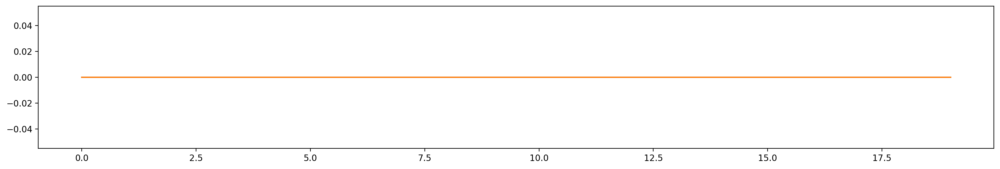

38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
S10 Behaviour_imaged Move Forward
Computing classification for Behaviour_imaged Move Forward behaviour
0 / 63  analysed
1 / 63  analysed


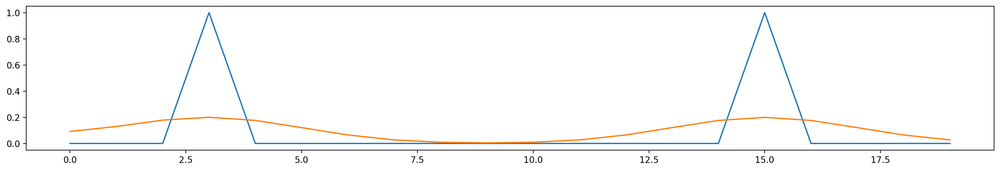

2 / 63  analysed


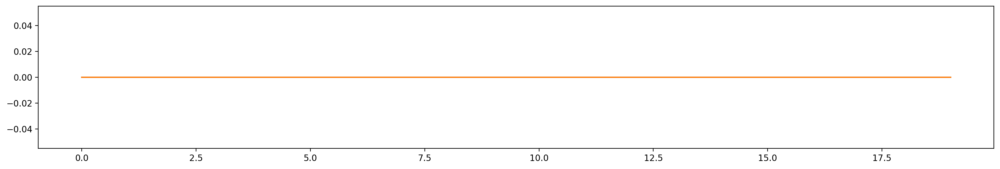

3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed


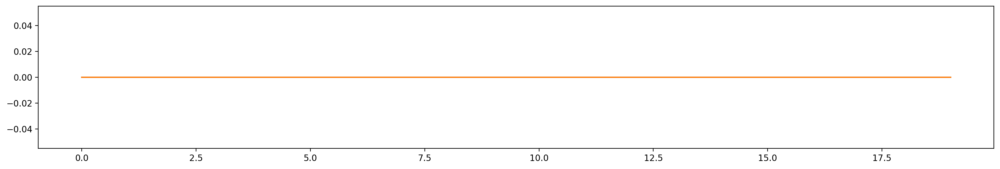

14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed


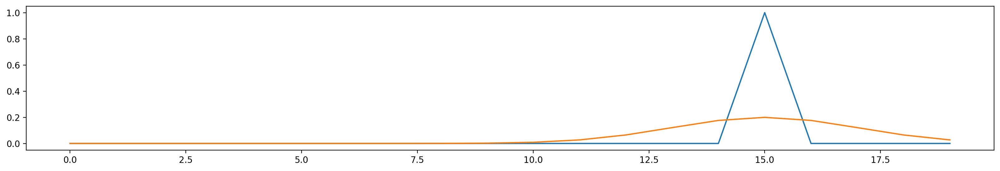

19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed


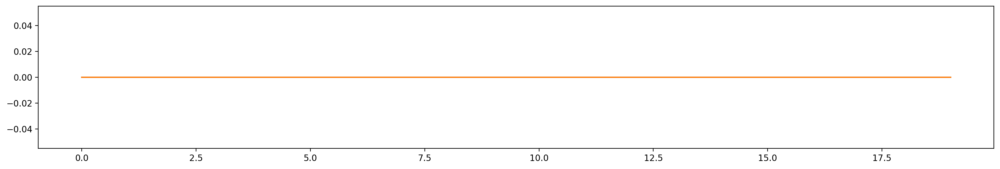

51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
S10 Behaviour_imaged Resistance
Computing classification for Behaviour_imaged Resistance behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed


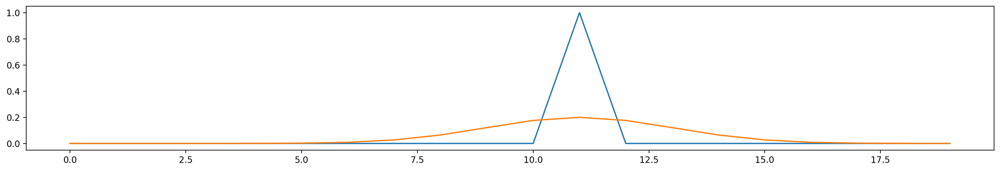

5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed


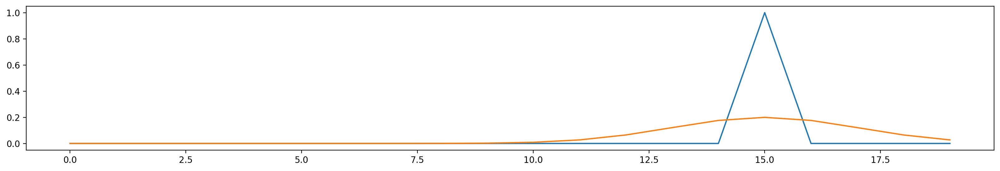

19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed


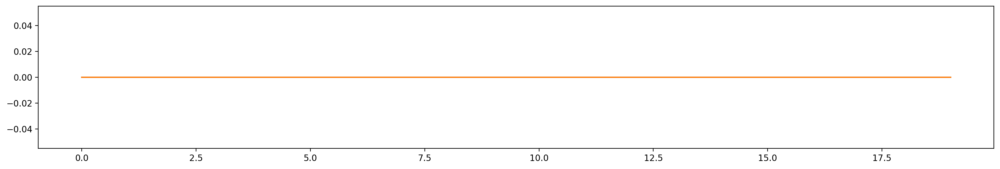

41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
S10 Behaviour_imaged Retreat
Computing classification for Behaviour_imaged Retreat behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed


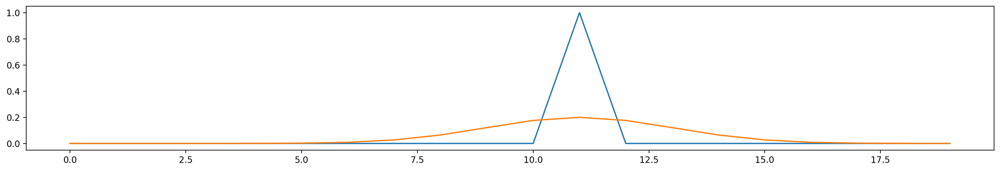

5 / 63  analysed
6 / 63  analysed


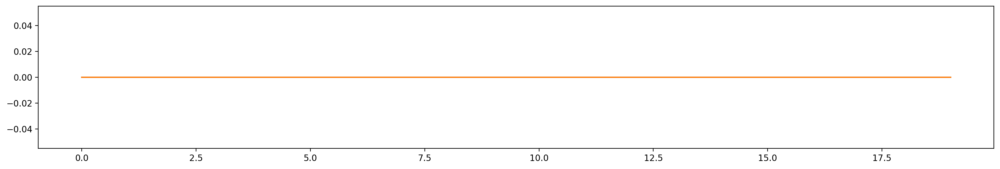

7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed


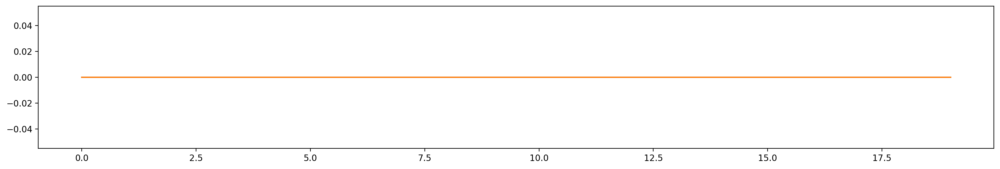

25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed


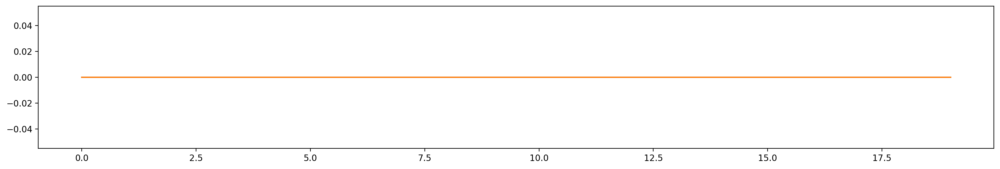

39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
S10 Behaviour_imaged Withdrawal
Computing classification for Behaviour_imaged Withdrawal behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  an

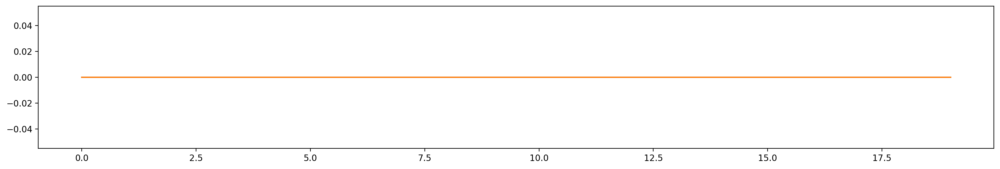

34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
S10 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 63  analysed
1 / 63  analysed


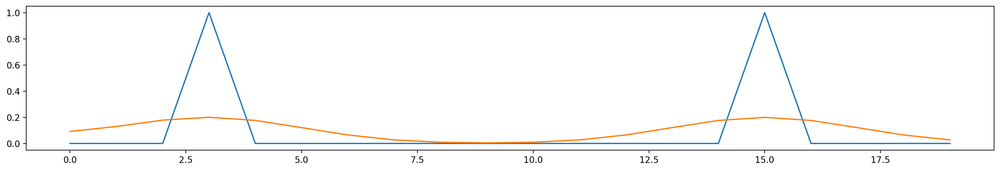

2 / 63  analysed


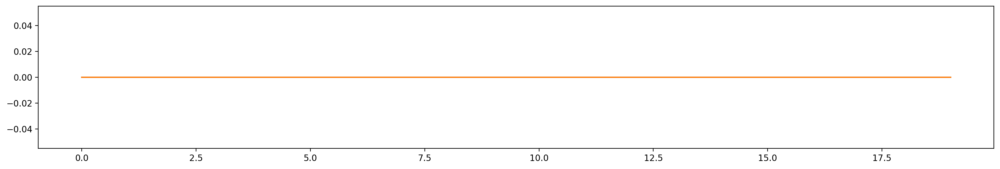

3 / 63  analysed


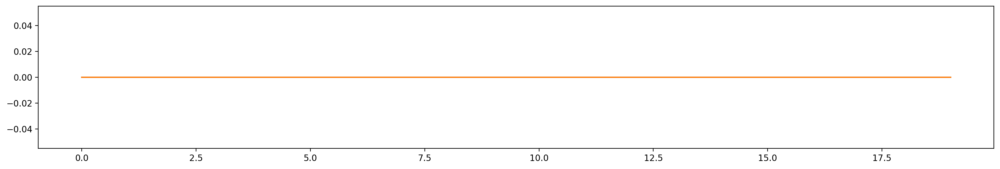

4 / 63  analysed


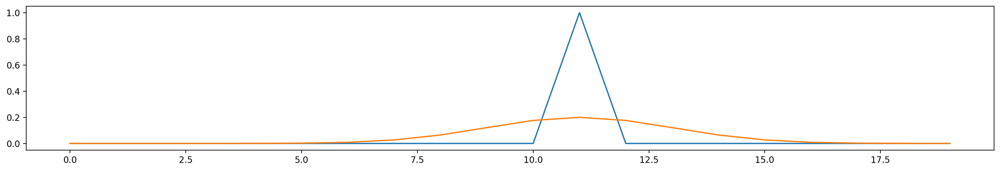

5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed


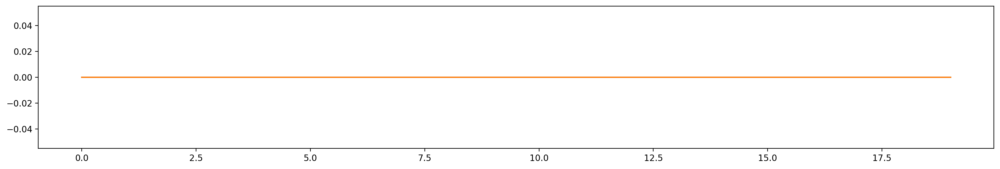

10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed


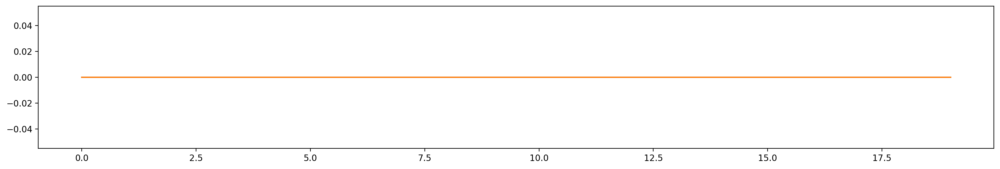

14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed


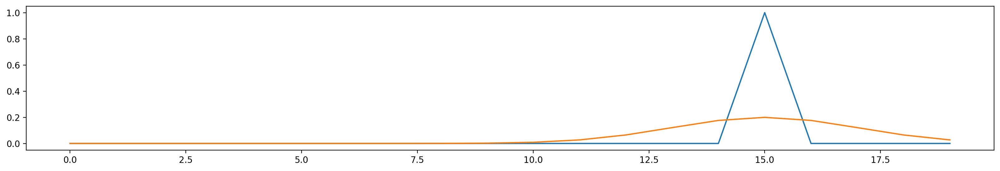

19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed


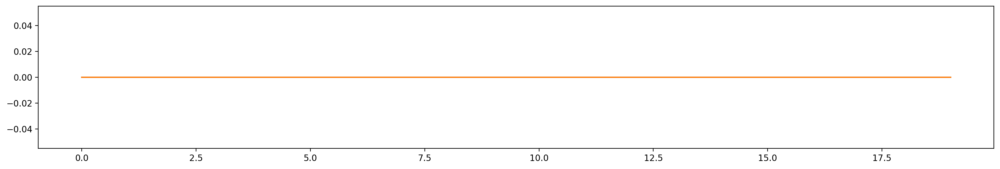

27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed


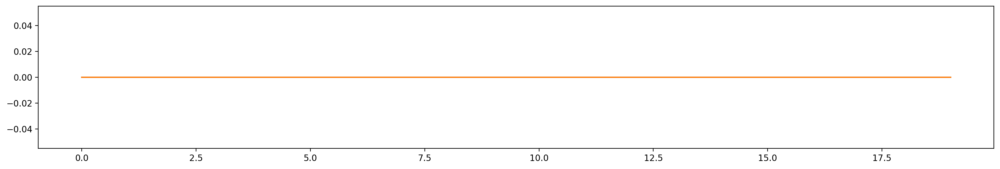

34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed


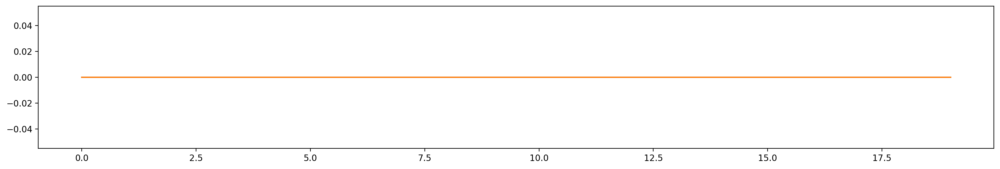

38 / 63  analysed
39 / 63  analysed
40 / 63  analysed


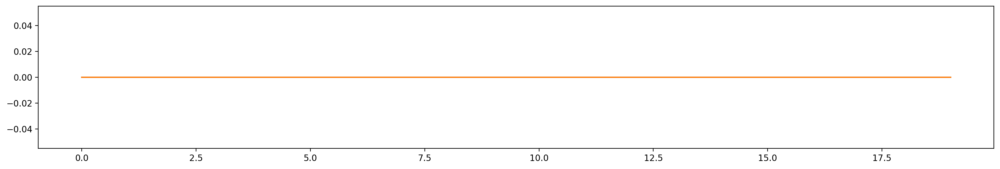

41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
S10 Behaviour_competitor Push
Computing classification for Behaviour_competitor Push behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed


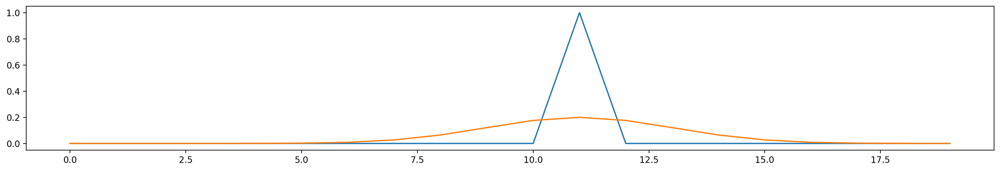

5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analys

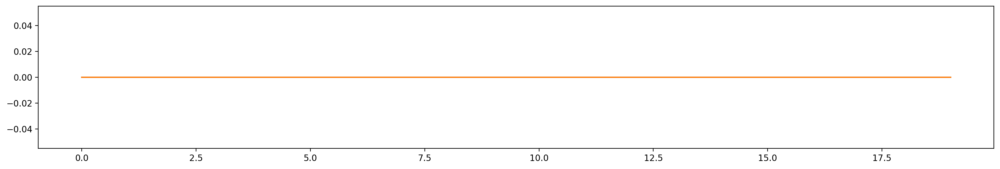

4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analyse

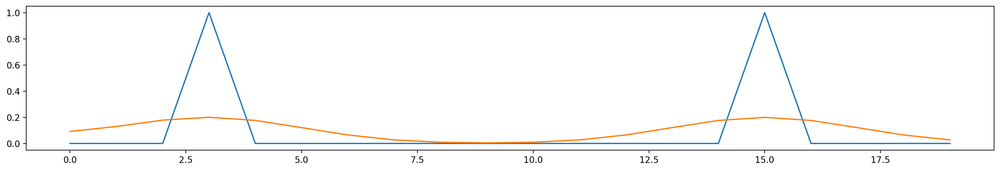

2 / 63  analysed


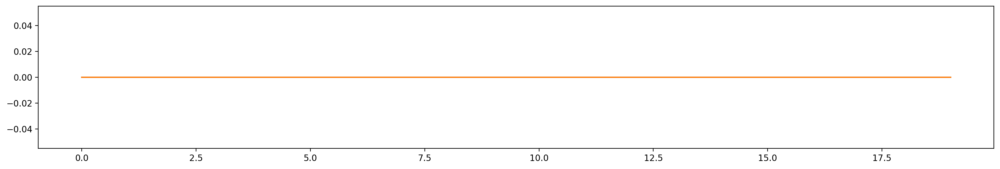

3 / 63  analysed


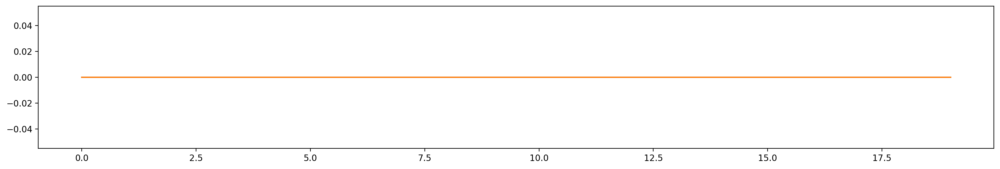

4 / 63  analysed


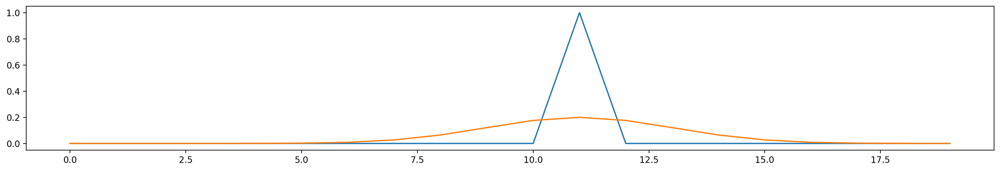

5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed


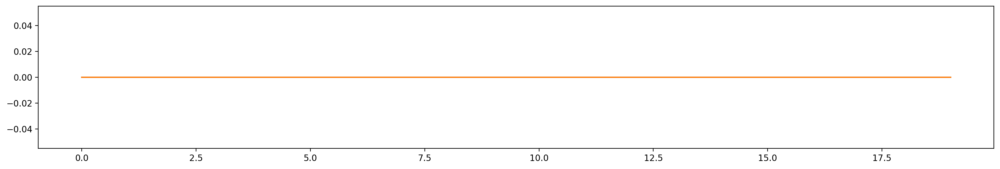

10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed


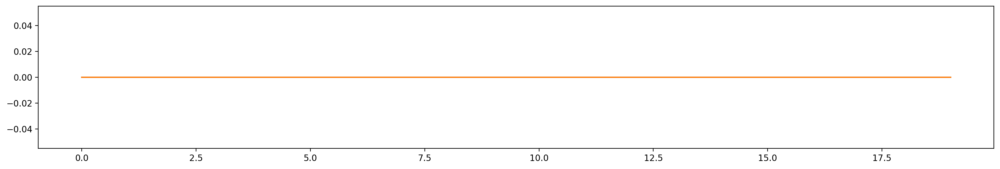

14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed


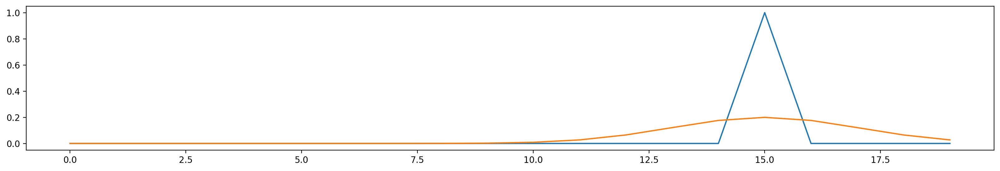

19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed


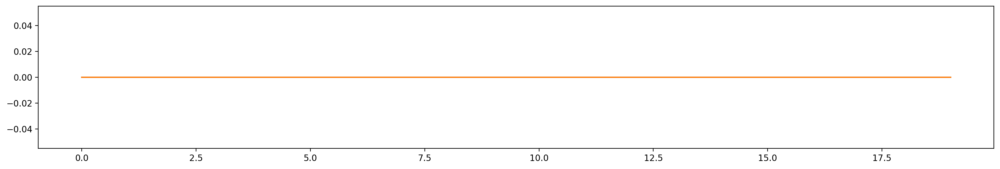

25 / 63  analysed
26 / 63  analysed


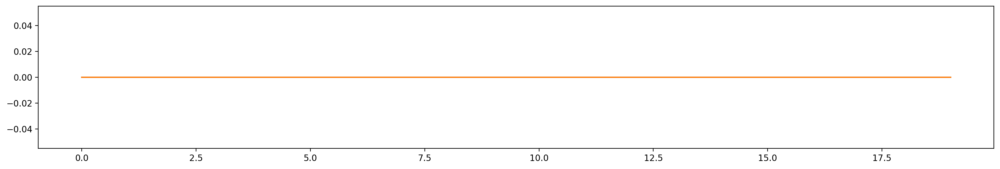

27 / 63  analysed


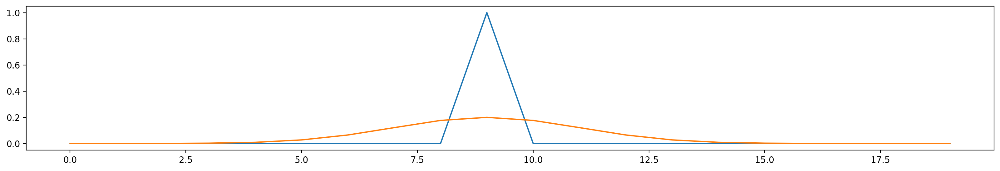

28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed


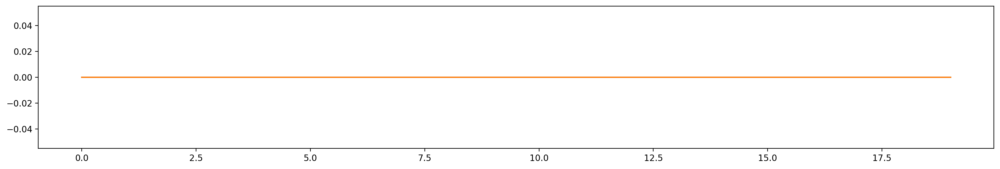

34 / 63  analysed
35 / 63  analysed
36 / 63  analysed


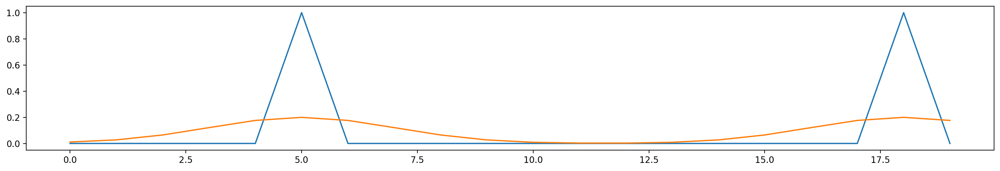

37 / 63  analysed


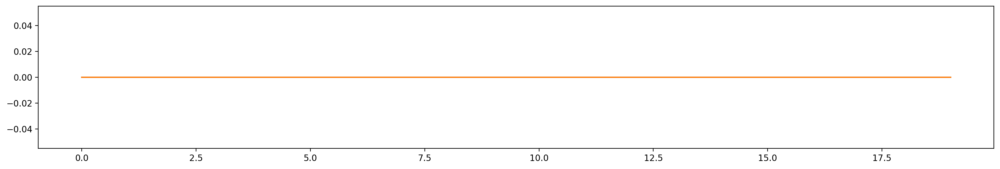

38 / 63  analysed
39 / 63  analysed
40 / 63  analysed


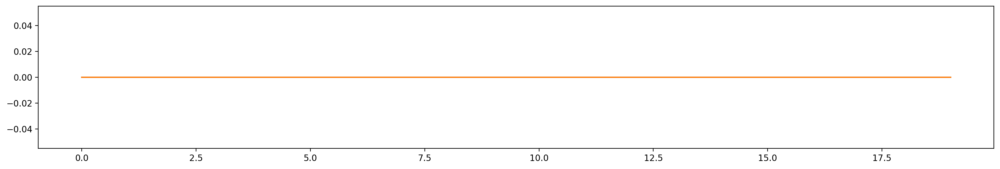

41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed


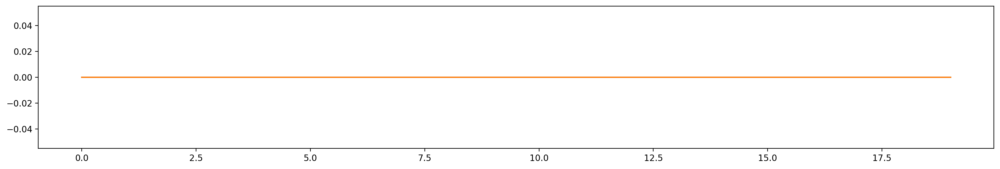

61 / 63  analysed


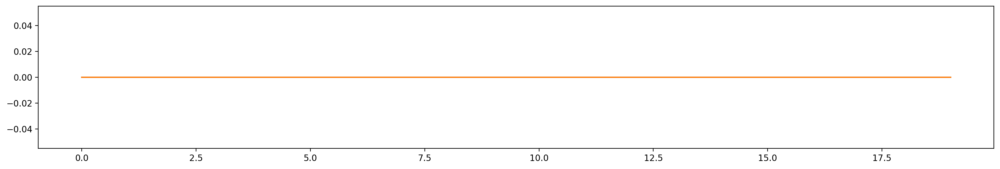

62 / 63  analysed
686_P1_S03_trace_behav_aligned.csv S03
S03 Behaviour_imaged Push
Computing classification for Behaviour_imaged Push behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48

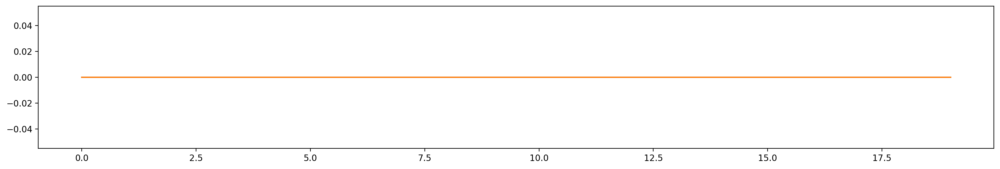

4 / 63  analysed


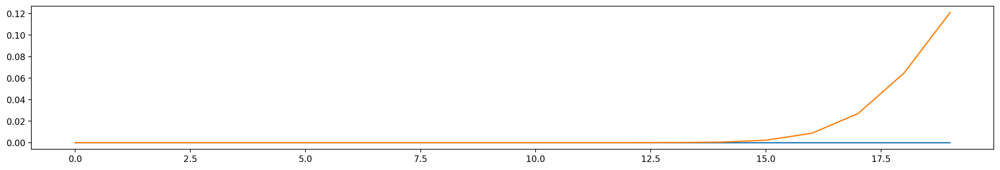

5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed


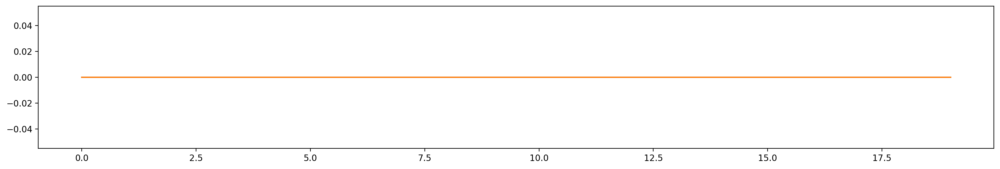

13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed


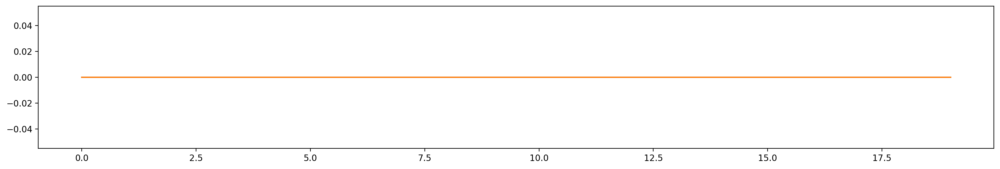

19 / 63  analysed
20 / 63  analysed


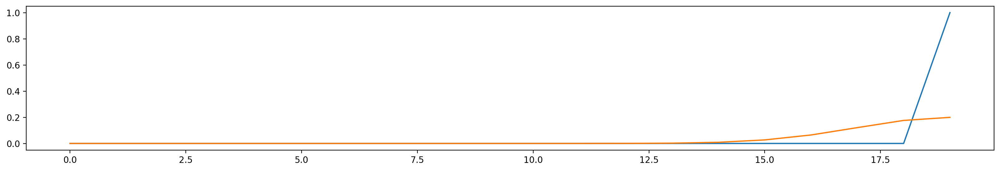

21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
S03 Behaviour_imaged Retreat
Computing classification for Behaviour_imaged Retreat behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analyse

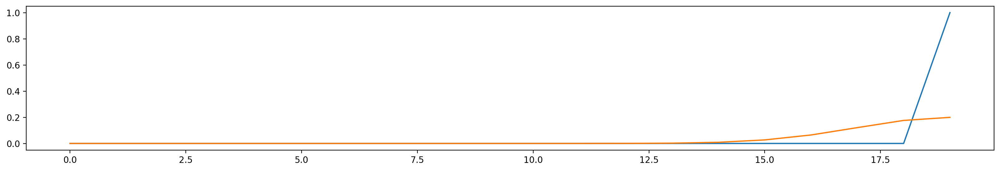

21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed


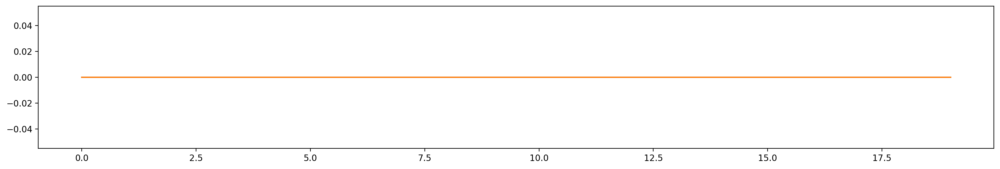

31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
S03 Behaviour_imaged Withdrawal
Computing classification for Behaviour_imaged Withdrawal behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  an

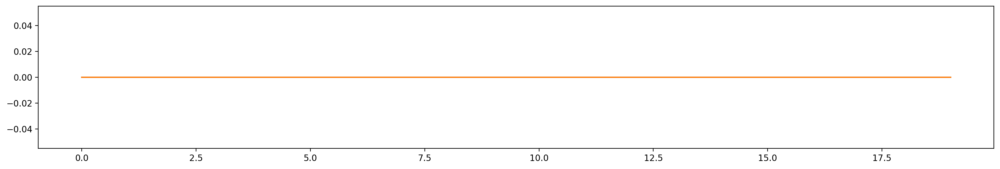

4 / 63  analysed


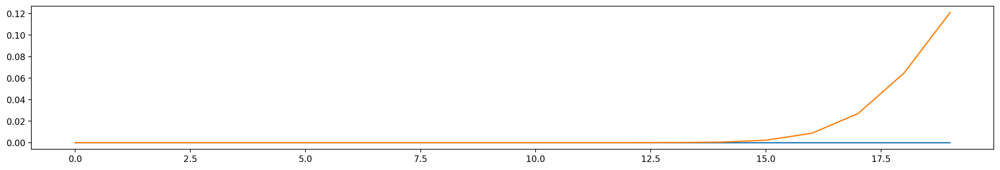

5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed


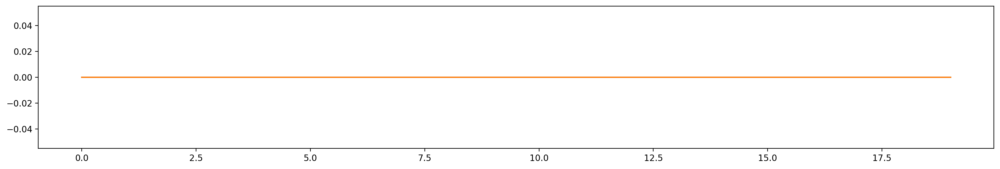

13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed


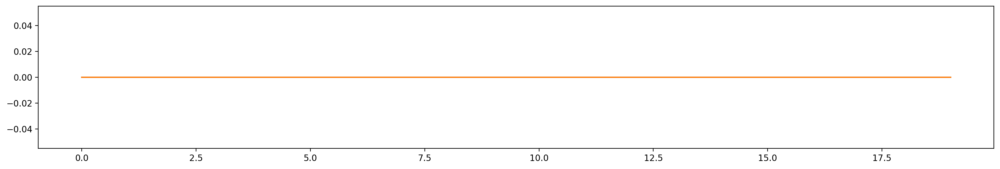

19 / 63  analysed
20 / 63  analysed


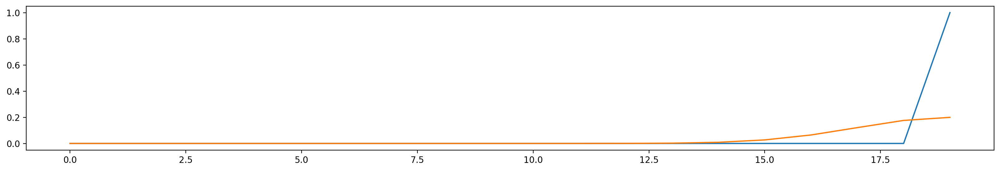

21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed


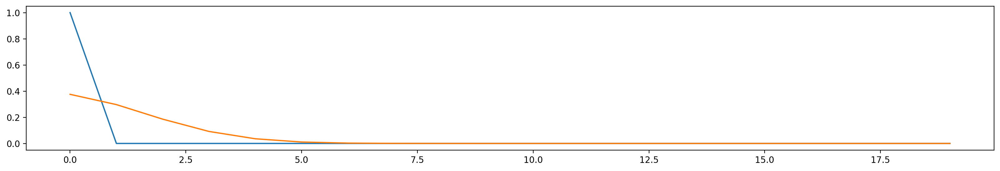

30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
S03 Behaviour_competitor Move Forward
Computing classification for Behaviour_competitor Move Forward behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed

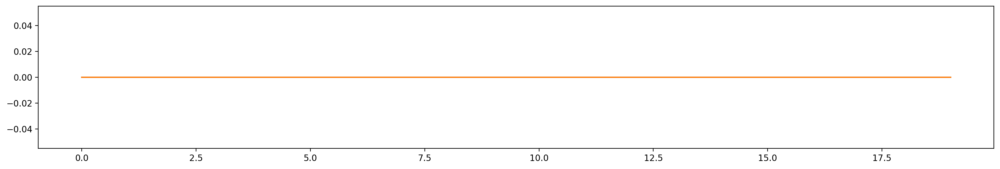

7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed


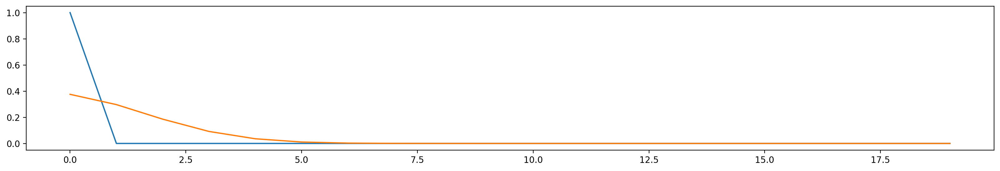

30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
686_P1_S07_trace_behav_aligned.csv S07
S07 Behaviour_imaged Push
Computing classification for Behaviour_imaged Push behaviour
0 / 63  analysed
1 / 63  analysed


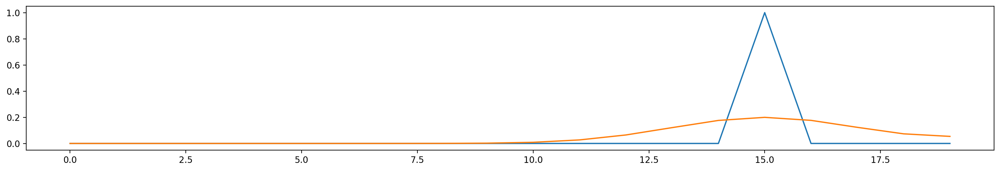

2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed


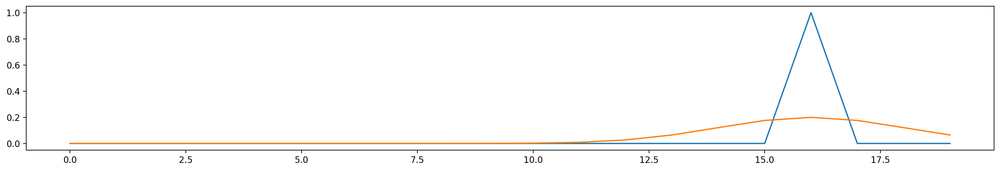

19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed


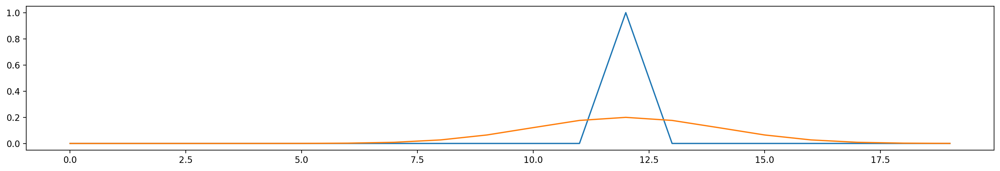

47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
S07 Behaviour_imaged Move Forward
Behaviour_imaged Move Forward behaviour not exhibted
S07 Behaviour_imaged Resistance
Computing classification for Behaviour_imaged Resistance behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analy

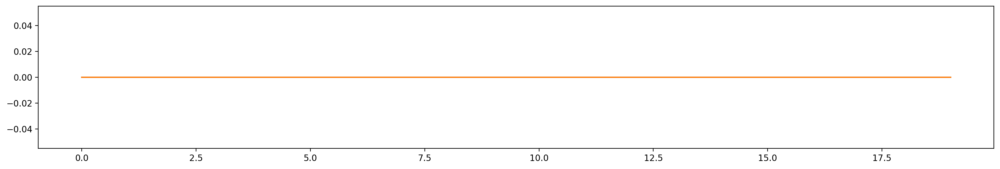

20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
S07 Behaviour_imaged Withdrawal
Computing classification for Behaviour_imaged Withdrawal behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  

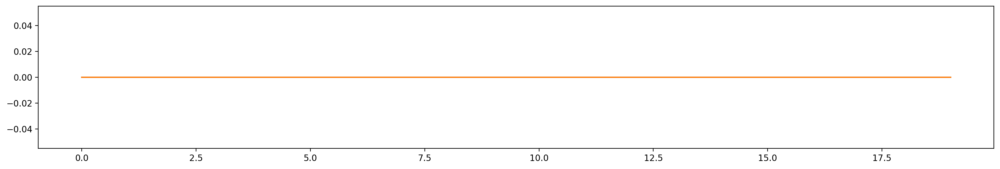

36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
S07 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed


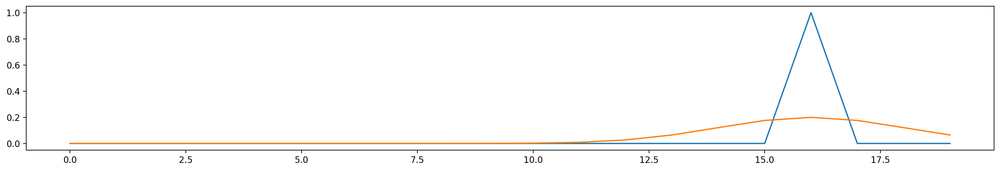

19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed


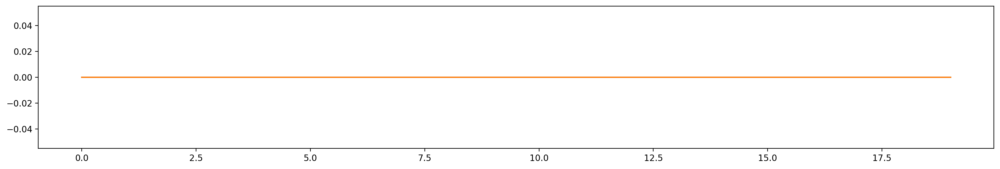

38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
S07 Behaviour_competitor Push
Computing classification for Behaviour_competitor Push behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analys

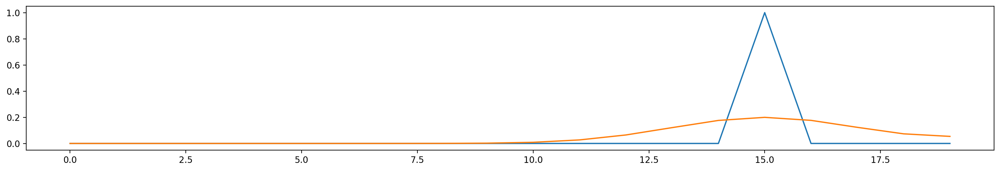

2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed


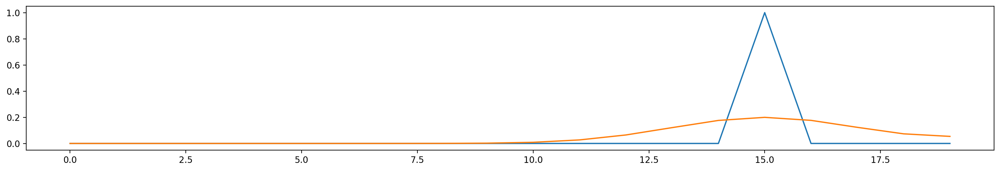

2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed


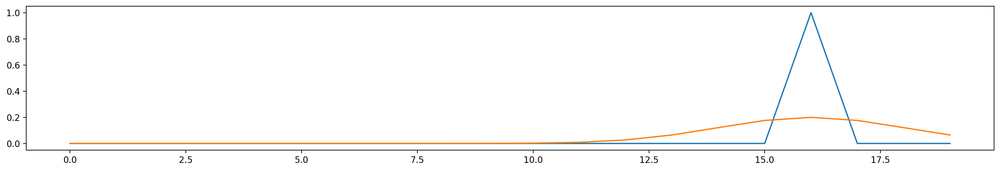

19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed


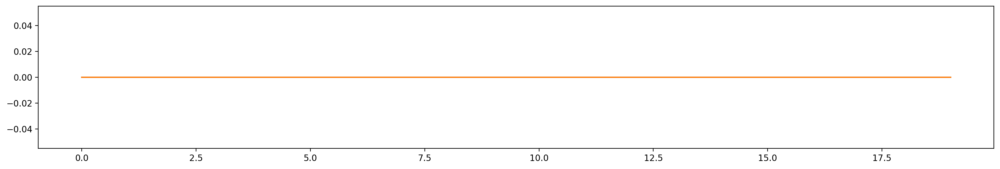

36 / 63  analysed
37 / 63  analysed


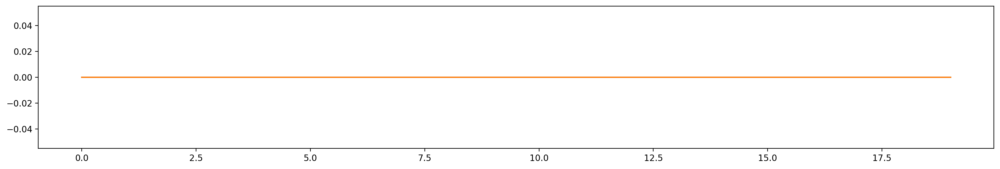

38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
686_P1_S01_trace_behav_aligned.csv S01
S01 Behaviour_imaged Push
Computing classification for Behaviour_imaged Push behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24

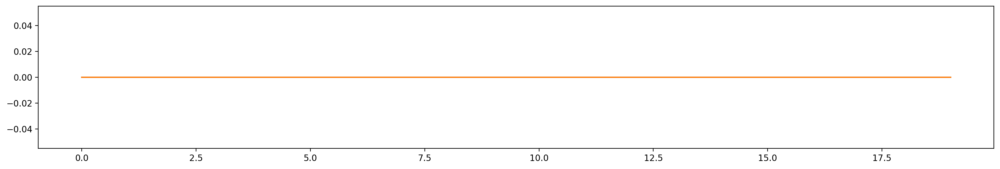

9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed


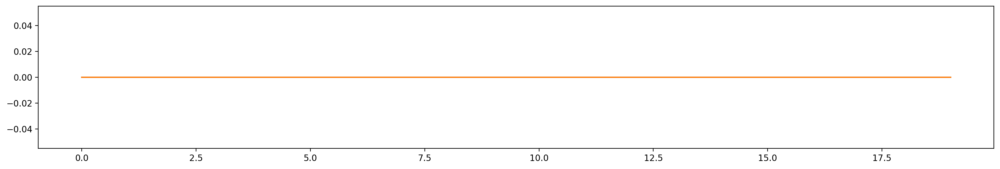

21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
S01 Behaviour_imaged Withdrawal
Computing classification for Behaviour_imaged Withdrawal behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  a

S05 Behaviour_imaged Push
Computing classification for Behaviour_imaged Push behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 

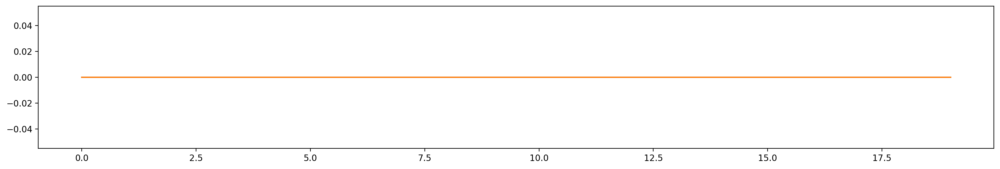

3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed


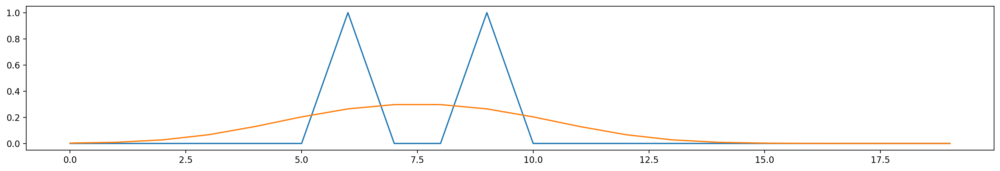

10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed


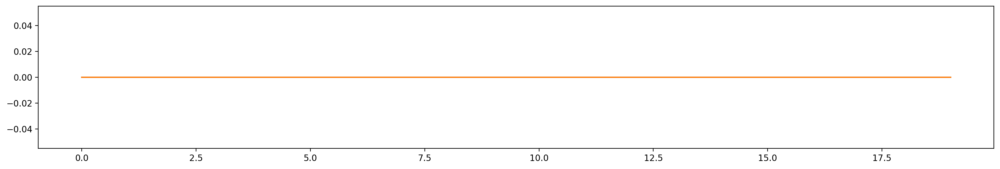

22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed


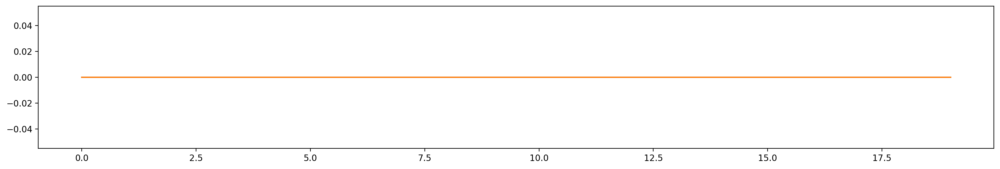

41 / 63  analysed


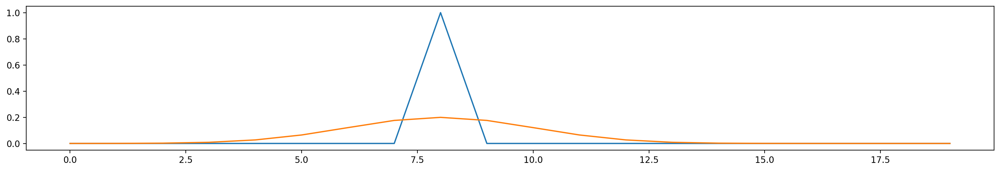

42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
S05 Behaviour_imaged Resistance
Computing classification for Behaviour_imaged Resistance behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  an

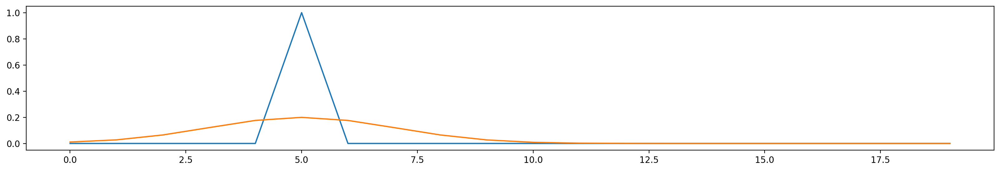

47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
S05 Behaviour_imaged Retreat
Computing classification for Behaviour_imaged Retreat behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed

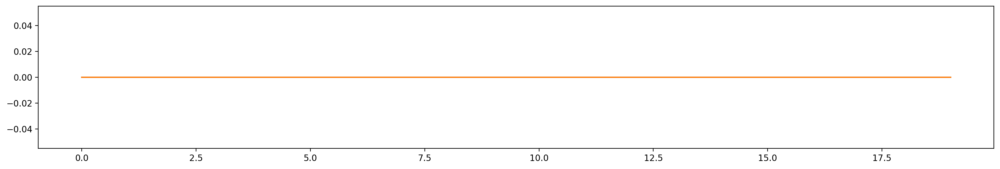

38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed


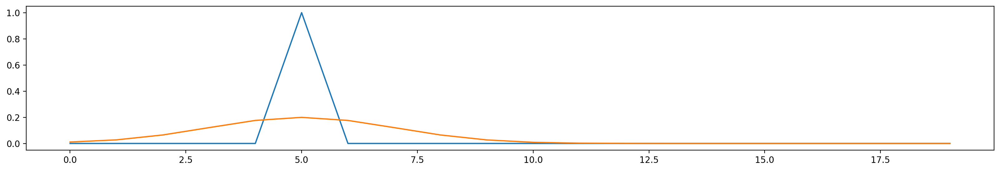

47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
S05 Behaviour_competitor Move Forward
Computing classification for Behaviour_competitor Move Forward behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed

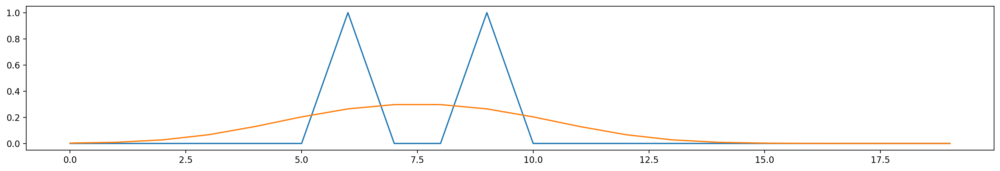

10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed


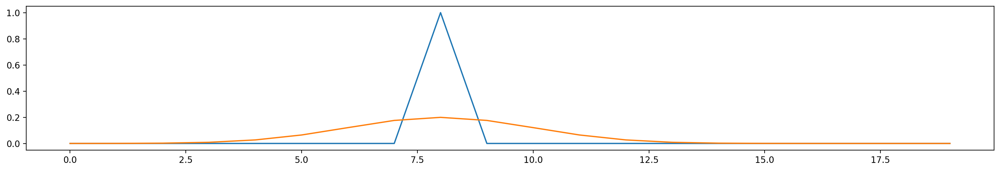

42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
686_P1_S09_trace_behav_aligned.csv S09
S09 Behaviour_imaged Push
Computing classification for Behaviour_imaged Push behaviour
0 / 63  analysed
1 / 63  analysed


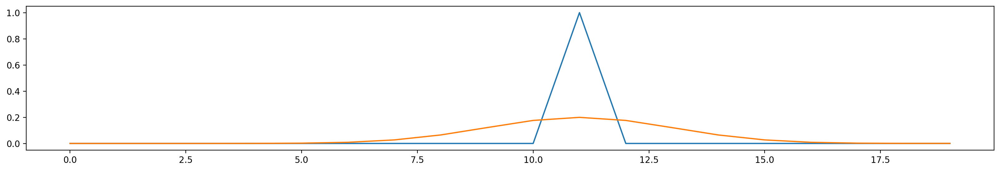

2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed


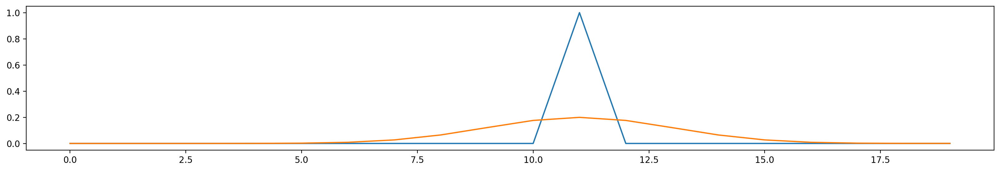

2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed


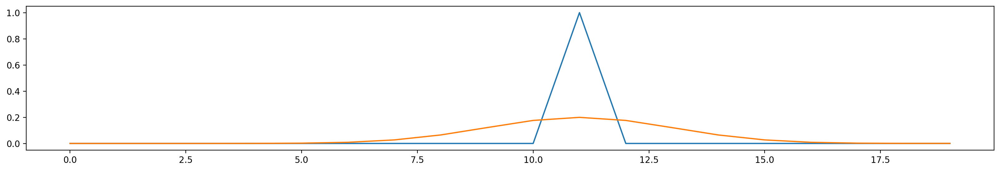

2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed


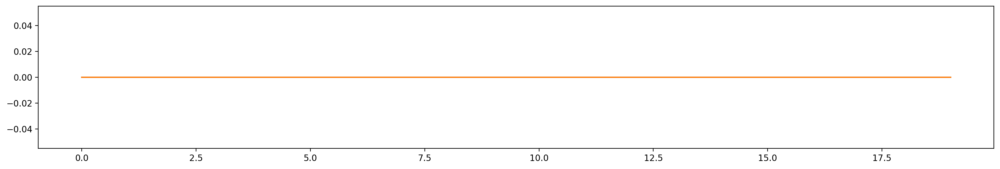

38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed
58 / 63  analysed
59 / 63  analysed
60 / 63  analysed
61 / 63  analysed
62 / 63  analysed
S09 Behaviour_competitor Move Forward
Computing classification for Behaviour_competitor Move Forward behaviour
0 / 63  analysed
1 / 63  analysed
2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed

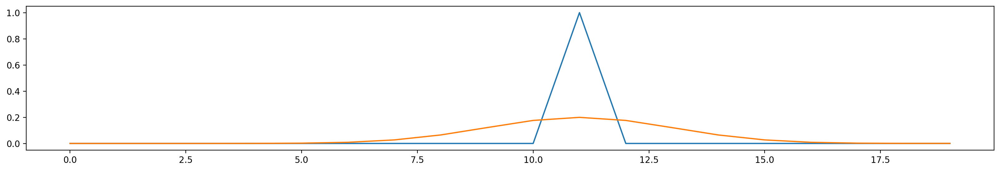

2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed


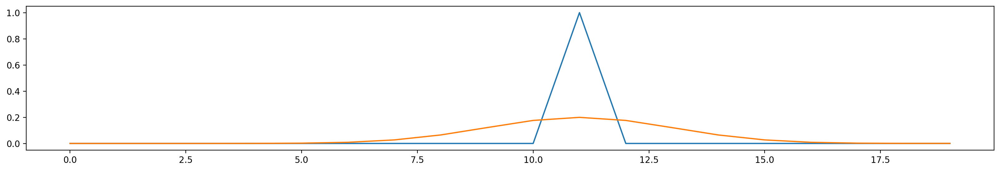

2 / 63  analysed
3 / 63  analysed
4 / 63  analysed
5 / 63  analysed
6 / 63  analysed
7 / 63  analysed
8 / 63  analysed
9 / 63  analysed
10 / 63  analysed
11 / 63  analysed
12 / 63  analysed
13 / 63  analysed
14 / 63  analysed
15 / 63  analysed
16 / 63  analysed
17 / 63  analysed
18 / 63  analysed
19 / 63  analysed
20 / 63  analysed
21 / 63  analysed
22 / 63  analysed
23 / 63  analysed
24 / 63  analysed
25 / 63  analysed
26 / 63  analysed
27 / 63  analysed
28 / 63  analysed
29 / 63  analysed
30 / 63  analysed
31 / 63  analysed
32 / 63  analysed
33 / 63  analysed
34 / 63  analysed
35 / 63  analysed
36 / 63  analysed
37 / 63  analysed
38 / 63  analysed
39 / 63  analysed
40 / 63  analysed
41 / 63  analysed
42 / 63  analysed
43 / 63  analysed
44 / 63  analysed
45 / 63  analysed
46 / 63  analysed
47 / 63  analysed
48 / 63  analysed
49 / 63  analysed
50 / 63  analysed
51 / 63  analysed
52 / 63  analysed
53 / 63  analysed
54 / 63  analysed
55 / 63  analysed
56 / 63  analysed
57 / 63  analysed


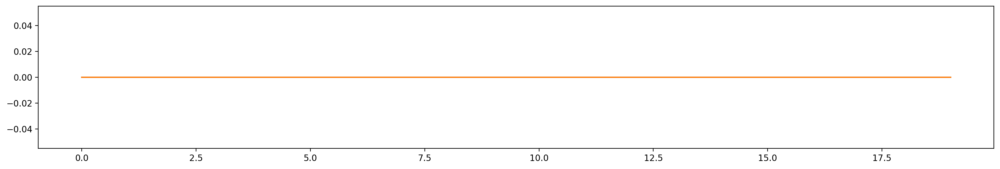

11 / 59  analysed
12 / 59  analysed
13 / 59  analysed
14 / 59  analysed
15 / 59  analysed


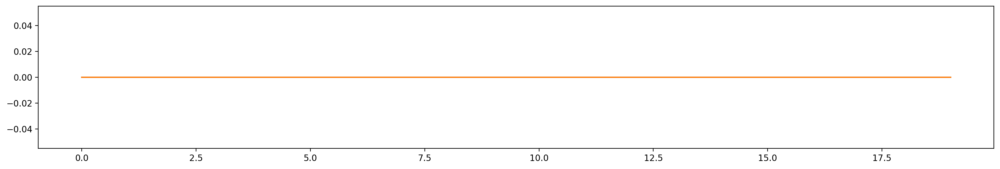

16 / 59  analysed


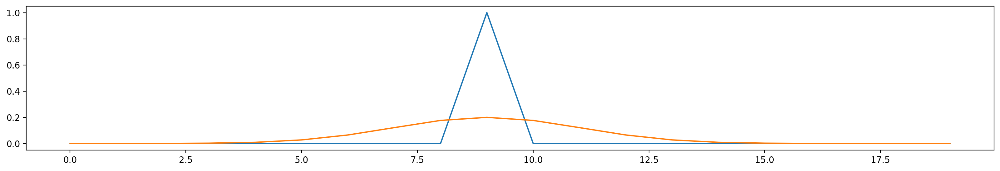

17 / 59  analysed
18 / 59  analysed
19 / 59  analysed


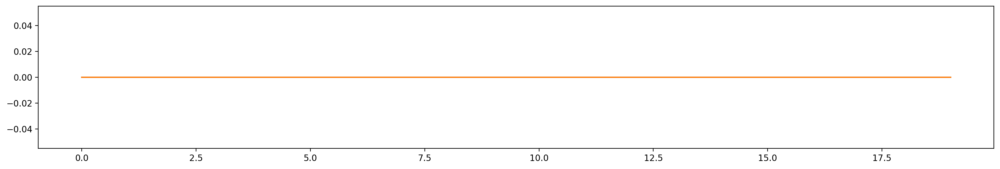

20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed


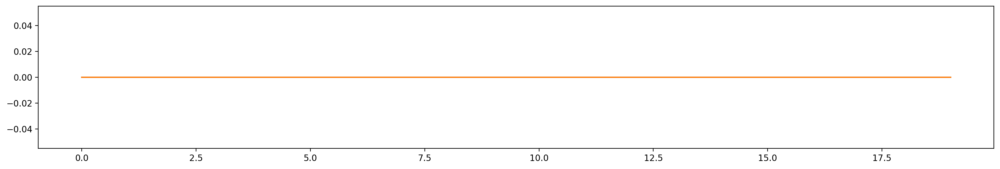

24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed


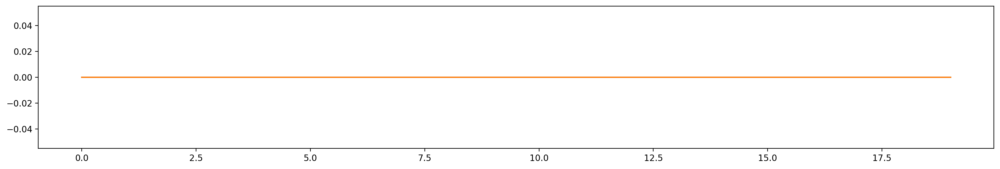

35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed


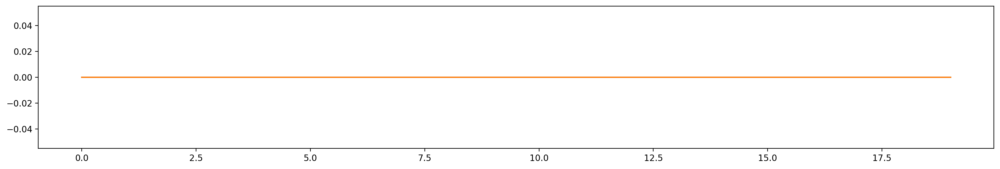

50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S06 Behaviour_imaged Move Forward
Computing classification for Behaviour_imaged Move Forward behaviour
0 / 59  analysed
1 / 59  analysed
2 / 59  analysed
3 / 59  analysed
4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed
8 / 59  analysed
9 / 59  analysed
10 / 59  analysed
11 / 59  analysed
12 / 59  analysed
13 / 59  analysed
14 / 59  analysed
15 / 59  analysed


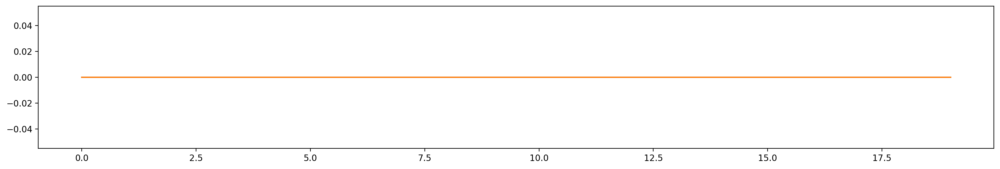

16 / 59  analysed
17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S06 Behaviour_imaged Resistance
Computing classification for Behaviour_imaged Resistance behaviour
0 / 59  analysed
1 / 59  analysed
2 / 59  analysed
3 / 59  analysed
4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  

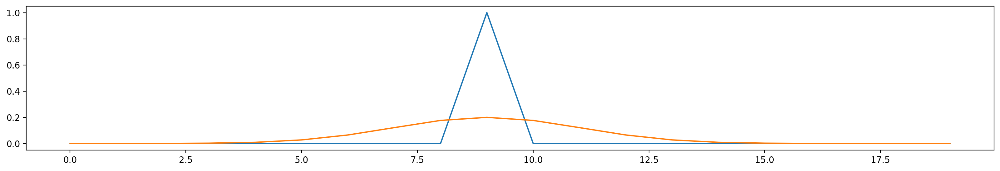

17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed


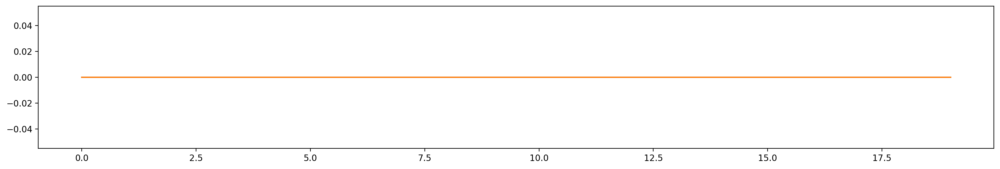

24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S06 Behaviour_imaged Retreat
Behaviour_imaged Retreat behaviour not exhibted
S06 Behaviour_imaged Withdrawal
Behaviour_imaged Withdrawal behaviour not exhibted
S06 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 59  analysed
1 / 59  analysed


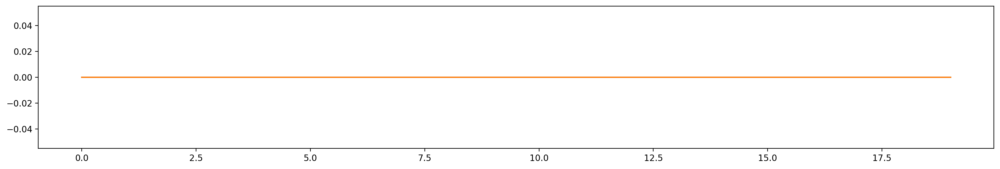

2 / 59  analysed
3 / 59  analysed
4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed
8 / 59  analysed
9 / 59  analysed
10 / 59  analysed
11 / 59  analysed
12 / 59  analysed
13 / 59  analysed
14 / 59  analysed
15 / 59  analysed


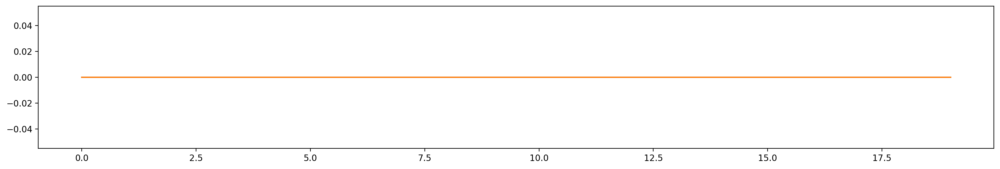

16 / 59  analysed
17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed
21 / 59  analysed


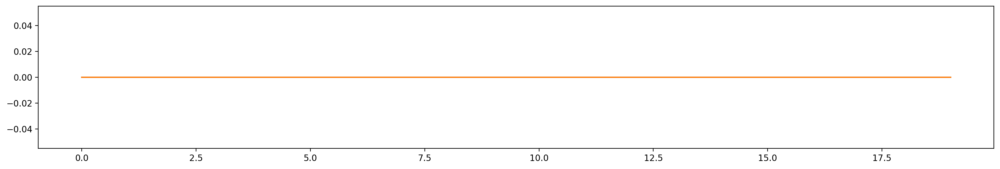

22 / 59  analysed
23 / 59  analysed
24 / 59  analysed


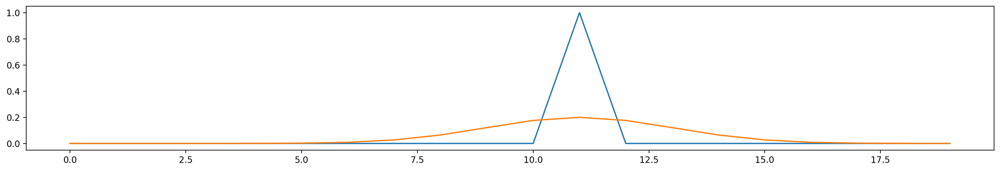

25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed


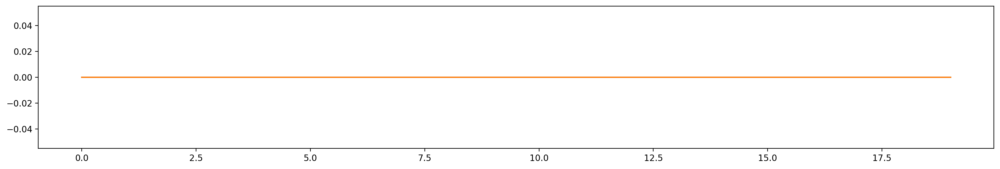

35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed


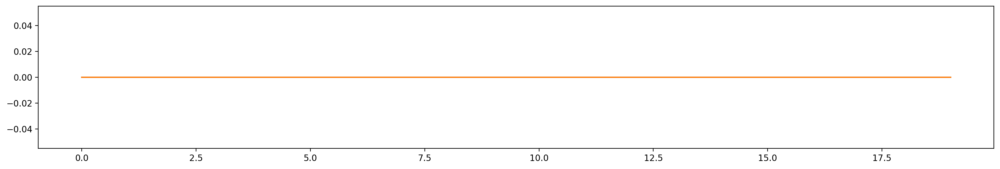

41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed


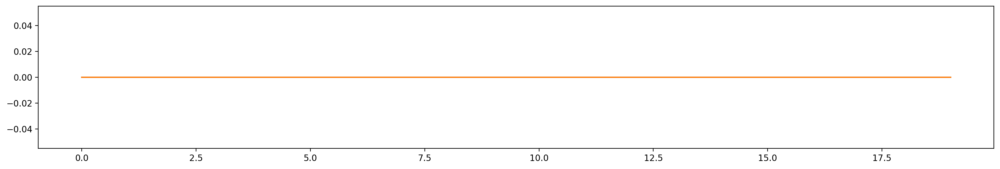

45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed


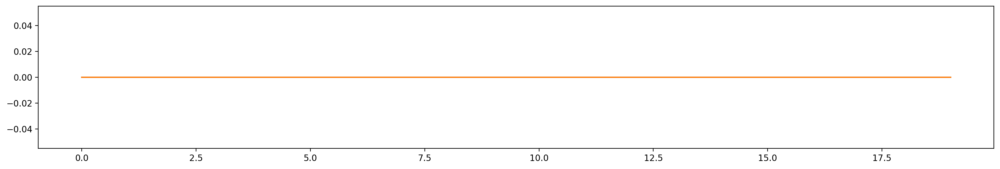

50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S06 Behaviour_competitor Push
Computing classification for Behaviour_competitor Push behaviour
0 / 59  analysed
1 / 59  analysed


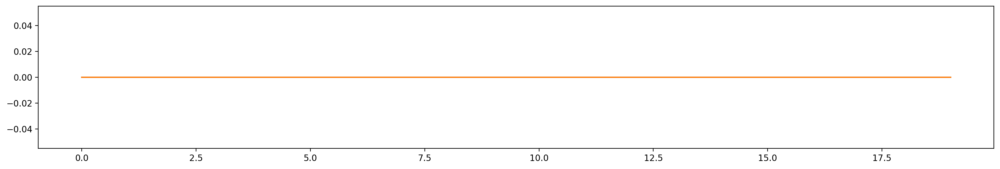

2 / 59  analysed
3 / 59  analysed
4 / 59  analysed
5 / 59  analysed
6 / 59  analysed


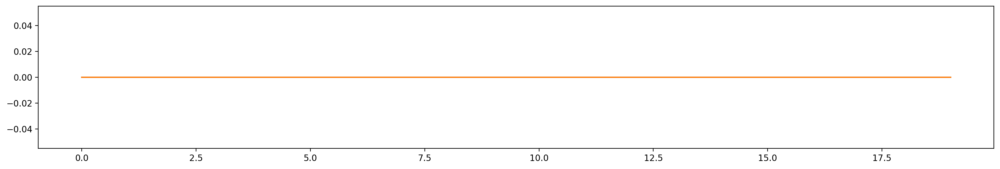

7 / 59  analysed
8 / 59  analysed
9 / 59  analysed
10 / 59  analysed
11 / 59  analysed
12 / 59  analysed
13 / 59  analysed
14 / 59  analysed
15 / 59  analysed


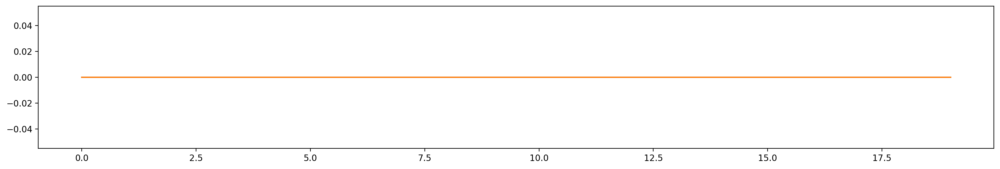

16 / 59  analysed


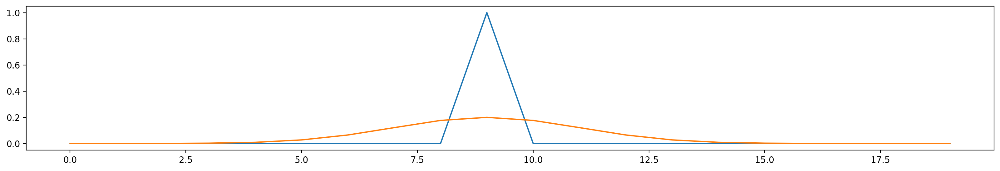

17 / 59  analysed
18 / 59  analysed
19 / 59  analysed


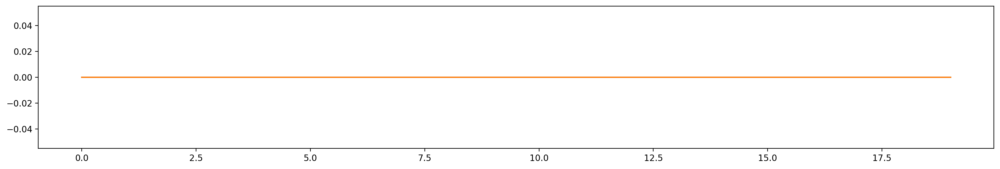

20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed


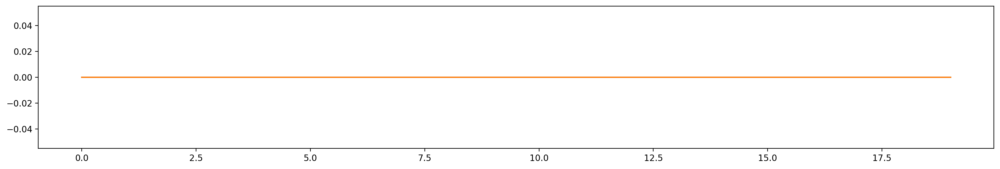

24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed


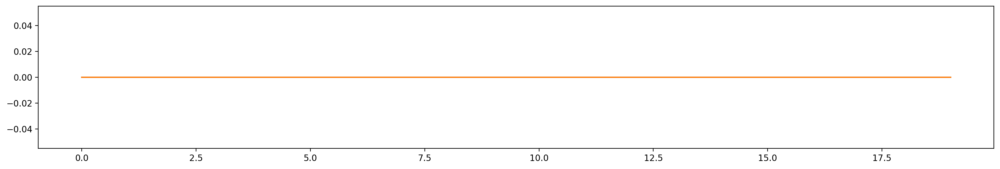

35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed


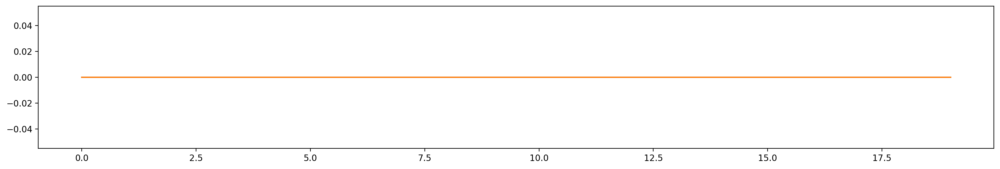

44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S06 Behaviour_competitor Move Forward
Behaviour_competitor Move Forward behaviour not exhibted
S06 Behaviour_competitor Resistance
Computing classification for Behaviour_competitor Resistance behaviour
0 / 59  analysed
1 / 59  analysed
2 / 59  analysed
3 / 59  analysed
4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed
8 / 59  analysed
9 / 59  analysed
10 / 59  analysed


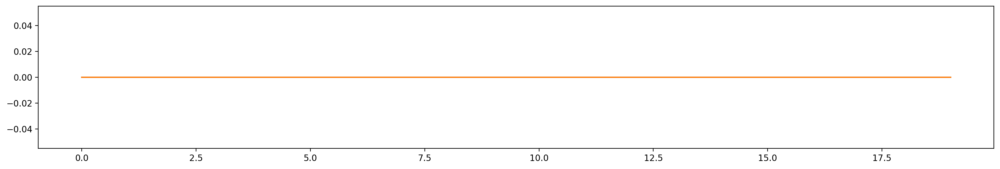

11 / 59  analysed
12 / 59  analysed
13 / 59  analysed
14 / 59  analysed
15 / 59  analysed
16 / 59  analysed


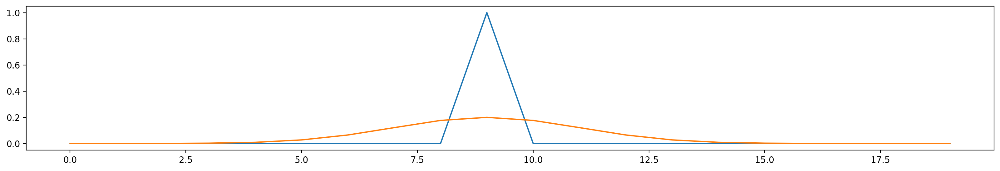

17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed


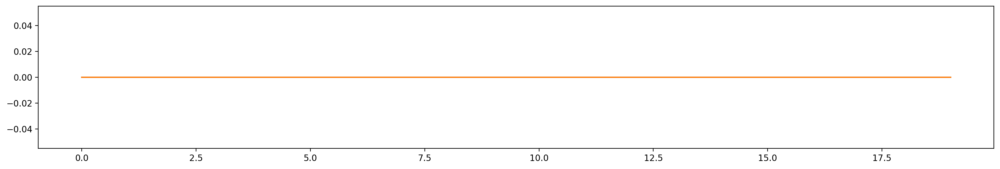

24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S06 Behaviour_competitor Retreat
Computing classification for Behaviour_competitor Retreat behaviour
0 / 59  analysed
1 / 59  analysed
2 / 59  analysed
3 / 59  analysed
4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed
8 / 59  analysed
9 / 59  analysed
10 / 59  analysed
11 / 59  analysed
12 / 59  analysed
13 / 59  analysed
14 / 59  analysed
15 / 59  

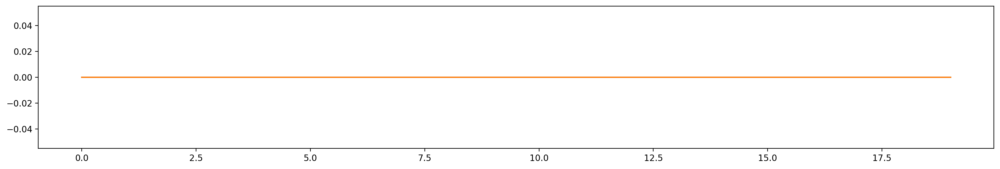

20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed


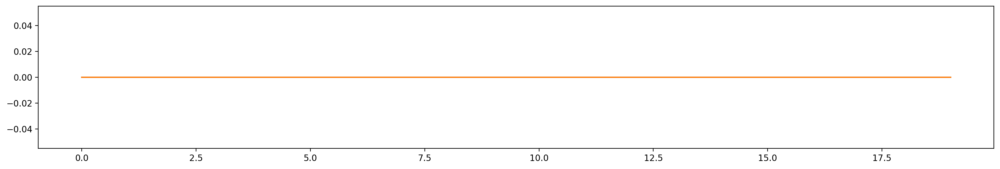

24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed


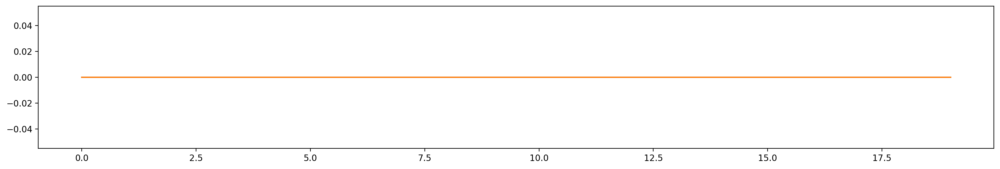

44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed


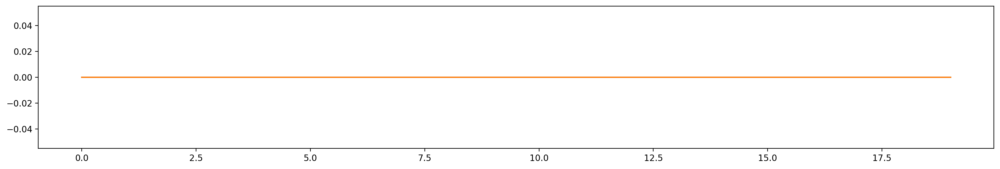

48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S06 Behaviour_competitor Withdrawal
Computing classification for Behaviour_competitor Withdrawal behaviour
0 / 59  analysed
1 / 59  analysed


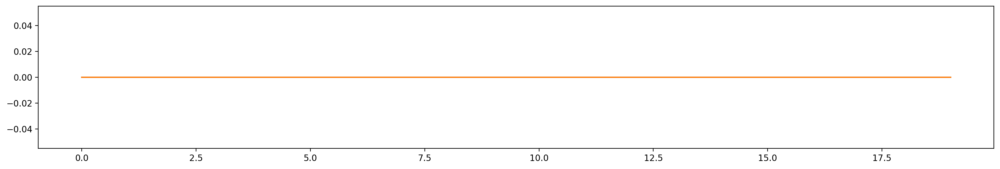

2 / 59  analysed
3 / 59  analysed
4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed
8 / 59  analysed
9 / 59  analysed
10 / 59  analysed
11 / 59  analysed
12 / 59  analysed
13 / 59  analysed
14 / 59  analysed
15 / 59  analysed
16 / 59  analysed
17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed


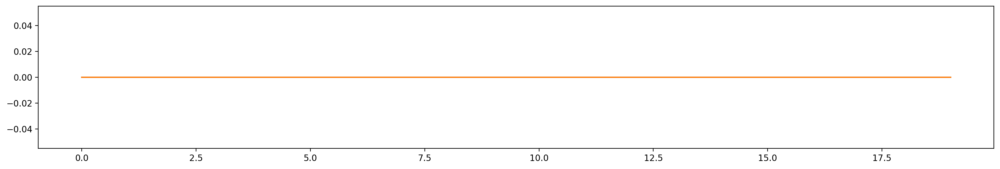

16 / 59  analysed
17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed


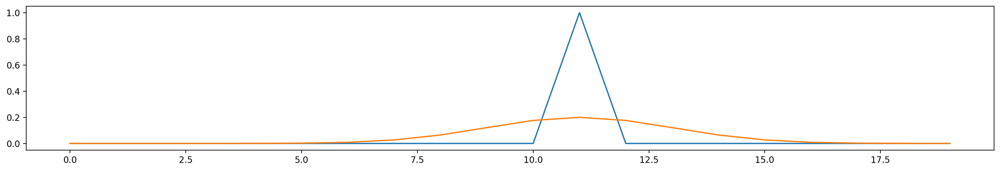

25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed


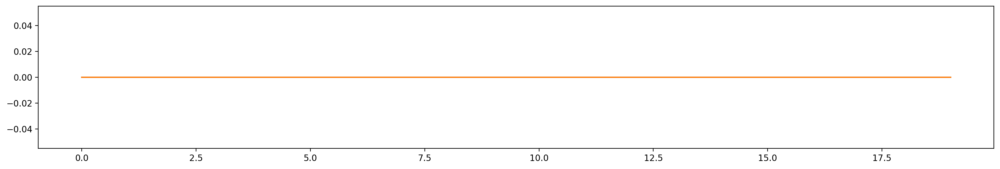

35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
691_P1_S04_trace_behav_aligned.csv S04
S04 Behaviour_imaged Push
Computing classification for Behaviour_imaged Push behaviour
0 / 59  analysed
1 / 59  analysed
2 / 59  analysed
3 / 59  analysed
4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed
8 / 59  analysed
9 / 59  analysed
10 / 59  analysed
11 / 59  analysed
12 / 59  analysed
13 / 59  analysed
14 / 59  analysed
15 / 59  analysed


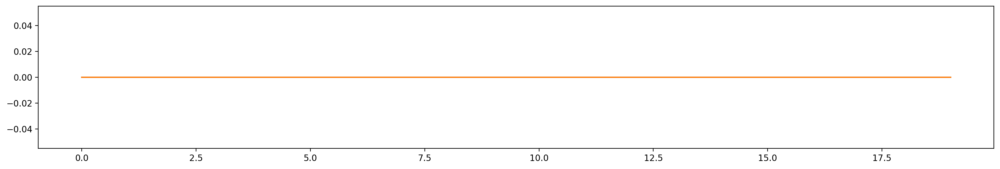

16 / 59  analysed
17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S04 Behaviour_imaged Move Forward
Computing classification for Behaviour_imaged Move Forward behaviour
0 / 59  analysed
1 / 59  analysed
2 / 59  analysed
3 / 59  analysed
4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 

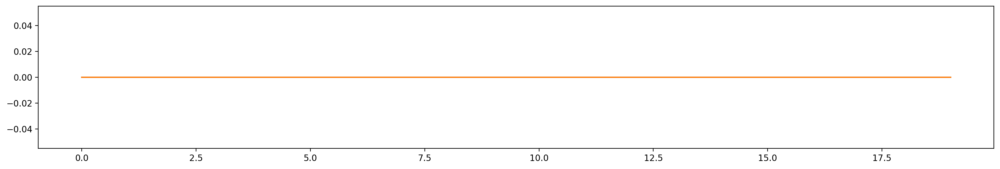

16 / 59  analysed


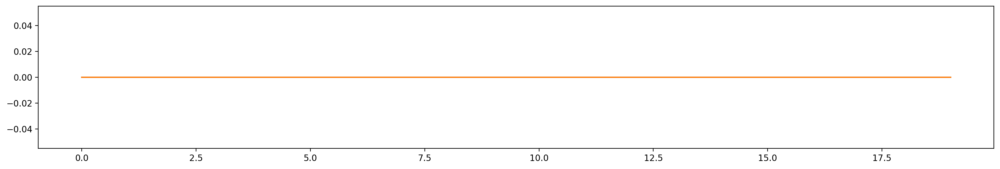

17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S04 Behaviour_imaged Retreat
Behaviour_imaged Retreat behaviour not exhibted
S04 Behaviour_imaged Withdrawal
Behaviour_imaged Withdrawal behaviour not exhibted
S04 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillne

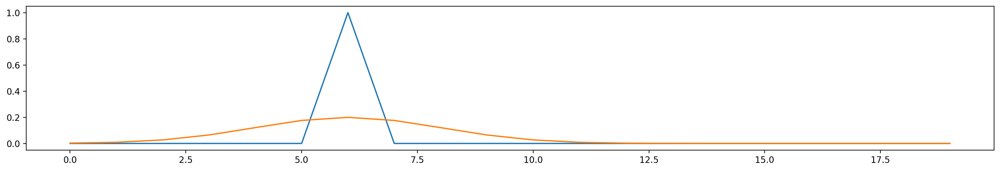

4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed


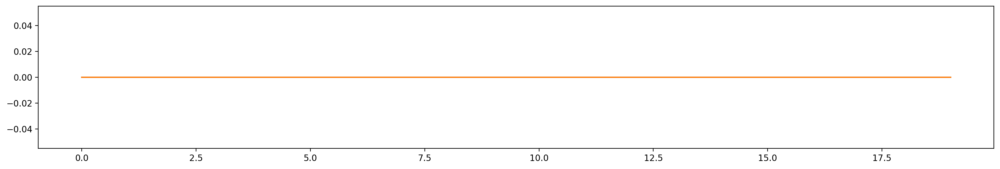

8 / 59  analysed
9 / 59  analysed


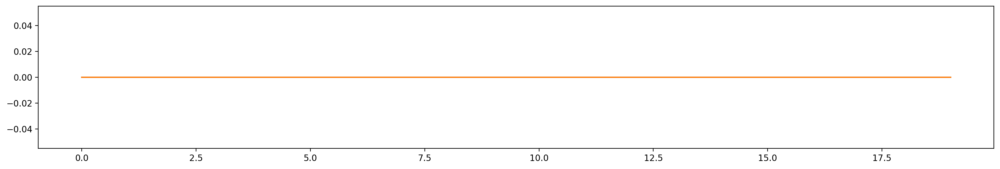

10 / 59  analysed
11 / 59  analysed
12 / 59  analysed


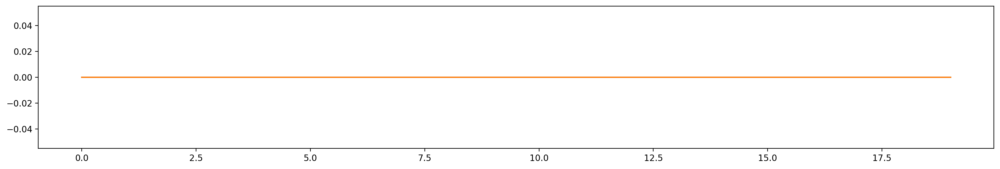

13 / 59  analysed
14 / 59  analysed
15 / 59  analysed


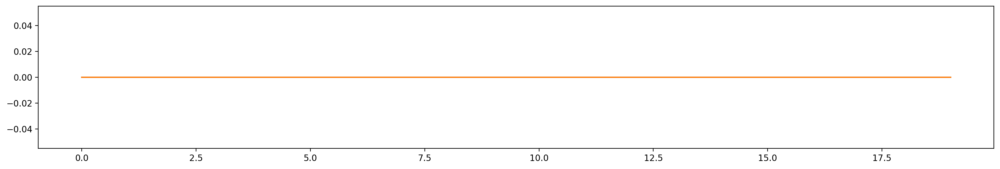

16 / 59  analysed


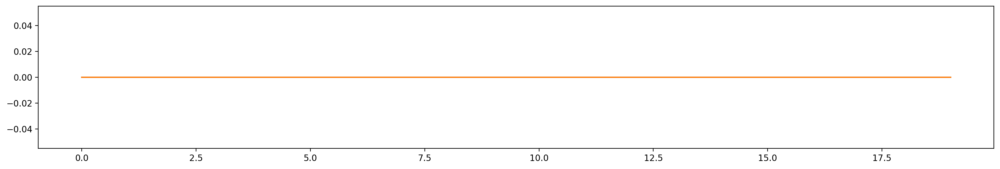

17 / 59  analysed
18 / 59  analysed
19 / 59  analysed


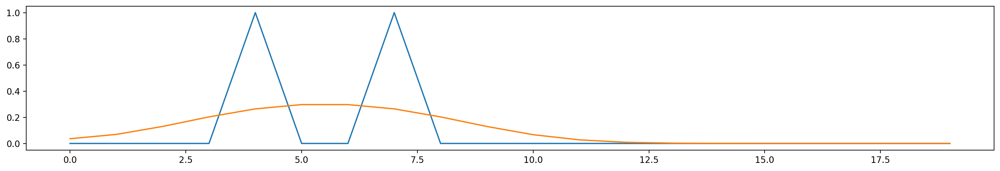

20 / 59  analysed


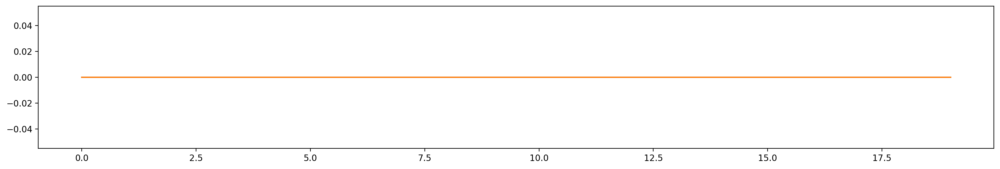

21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S04 Behaviour_competitor Push
Computing classification for Behaviour_competitor Push behaviour
0 / 59  analysed
1 / 59  analysed
2 / 59  analysed
3 / 59  analysed


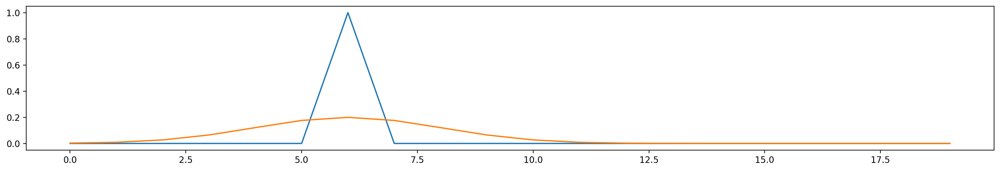

4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed
8 / 59  analysed
9 / 59  analysed
10 / 59  analysed
11 / 59  analysed
12 / 59  analysed
13 / 59  analysed
14 / 59  analysed
15 / 59  analysed


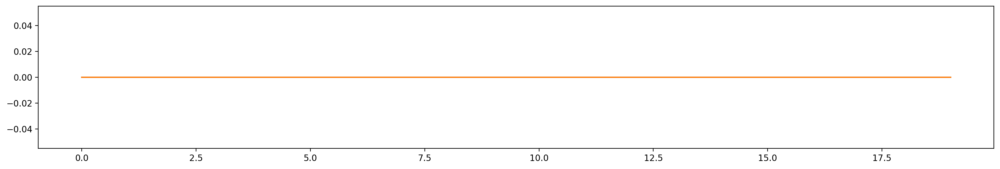

16 / 59  analysed
17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S04 Behaviour_competitor Move Forward
Computing classification for Behaviour_competitor Move Forward behaviour
0 / 59  analysed
1 / 59  analysed
2 / 59  analysed
3 / 59  analysed
4 / 59  analysed
5 / 59  analysed
6 / 59  analy

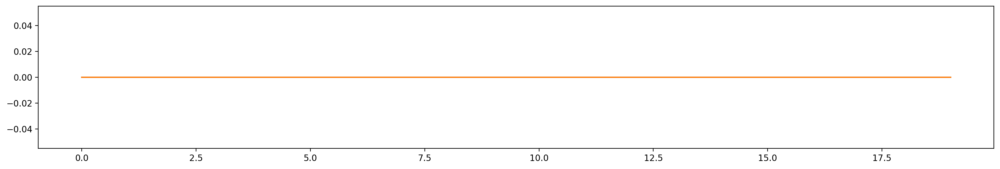

17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S04 Behaviour_competitor Resistance
Computing classification for Behaviour_competitor Resistance behaviour
0 / 59  analysed
1 / 59  analysed
2 / 59  analysed
3 / 59  analysed
4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed
8

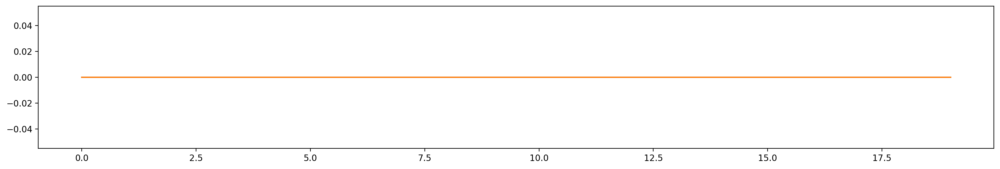

16 / 59  analysed
17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S04 Behaviour_competitor Retreat
Computing classification for Behaviour_competitor Retreat behaviour
0 / 59  analysed
1 / 59  analysed
2 / 59  analysed
3 / 59  analysed
4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59

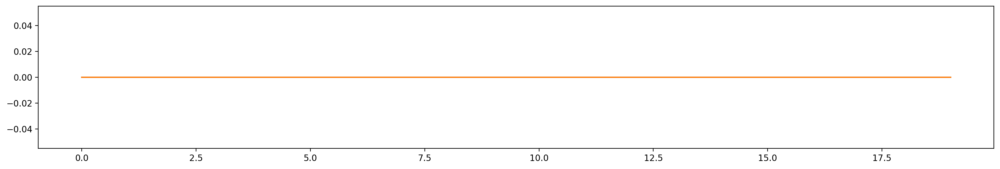

17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S04 Behaviour_competitor Stillness
Computing classification for Behaviour_competitor Stillness behaviour
0 / 59  analysed
1 / 59  analysed
2 / 59  analysed
3 / 59  analysed


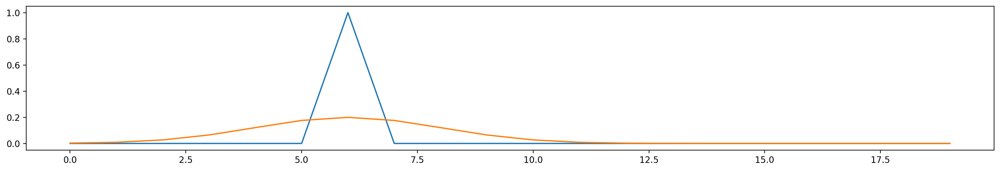

4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed
8 / 59  analysed
9 / 59  analysed
10 / 59  analysed
11 / 59  analysed
12 / 59  analysed


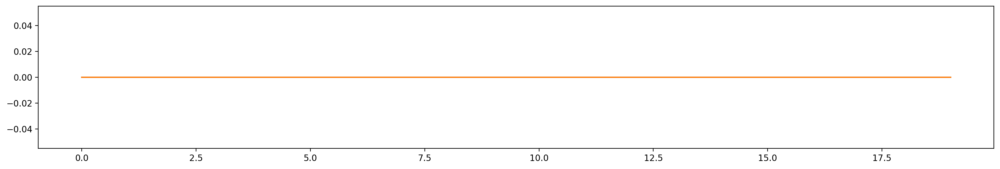

13 / 59  analysed
14 / 59  analysed
15 / 59  analysed


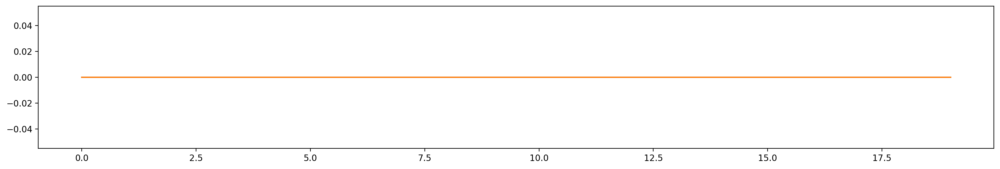

16 / 59  analysed


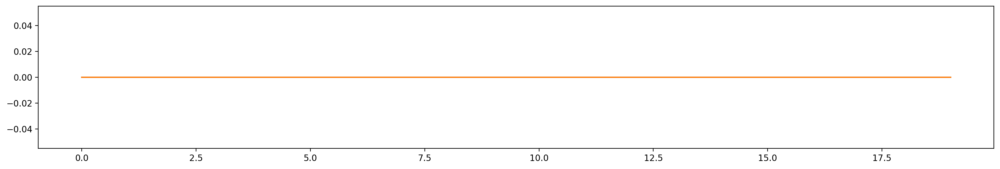

17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed


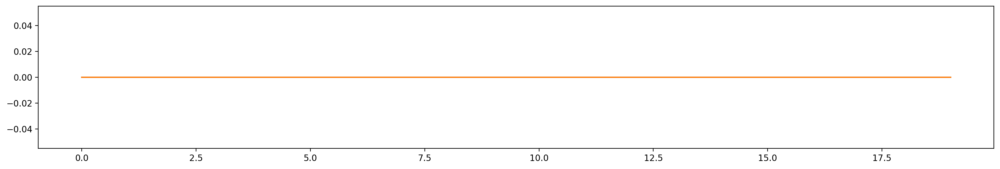

21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
691_P1_S08_trace_behav_aligned.csv S08
S08 Behaviour_imaged Push
Computing classification for Behaviour_imaged Push behaviour
0 / 59  analysed
1 / 59  analysed
2 / 59  analysed
3 / 59  analysed


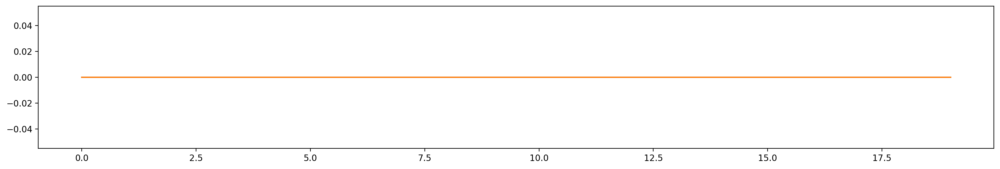

4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed
8 / 59  analysed
9 / 59  analysed
10 / 59  analysed
11 / 59  analysed
12 / 59  analysed
13 / 59  analysed
14 / 59  analysed
15 / 59  analysed
16 / 59  analysed


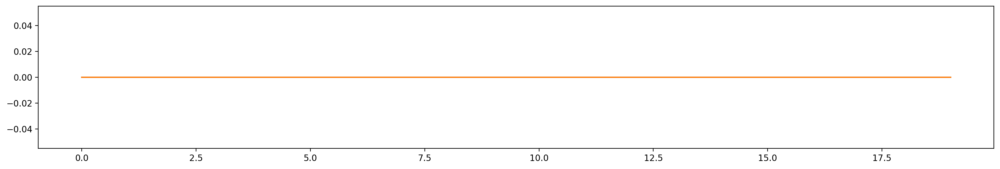

17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed


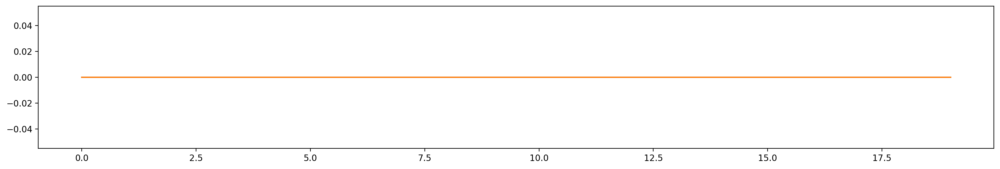

53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S08 Behaviour_imaged Move Forward
Computing classification for Behaviour_imaged Move Forward behaviour
0 / 59  analysed
1 / 59  analysed
2 / 59  analysed
3 / 59  analysed
4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed
8 / 59  analysed
9 / 59  analysed
10 / 59  analysed
11 / 59  analysed
12 / 59  analysed
13 / 59  analysed
14 / 59  analysed
15 / 59  analysed
16 / 59  analysed
17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59

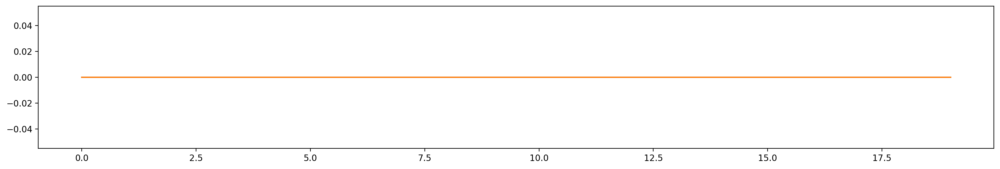

4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed
8 / 59  analysed
9 / 59  analysed
10 / 59  analysed
11 / 59  analysed
12 / 59  analysed
13 / 59  analysed
14 / 59  analysed
15 / 59  analysed
16 / 59  analysed


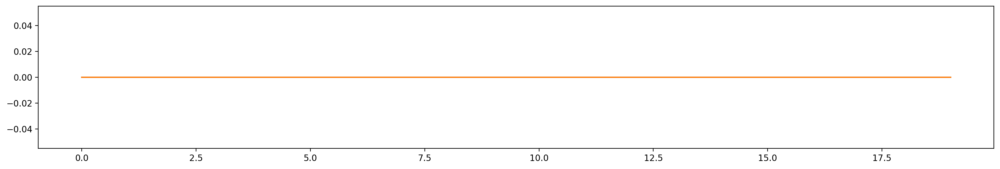

17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed


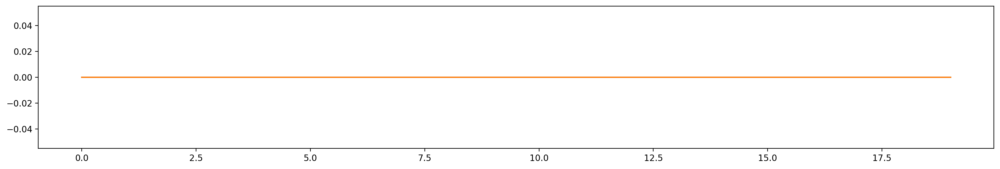

44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S08 Behaviour_imaged Retreat
Behaviour_imaged Retreat behaviour not exhibted
S08 Behaviour_imaged Withdrawal
Behaviour_imaged Withdrawal behaviour not exhibted
S08 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 59  analysed
1 / 59  analysed


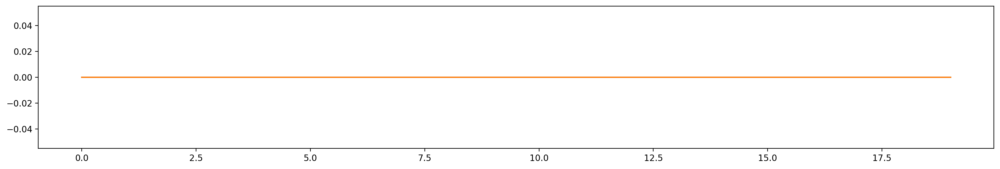

2 / 59  analysed
3 / 59  analysed


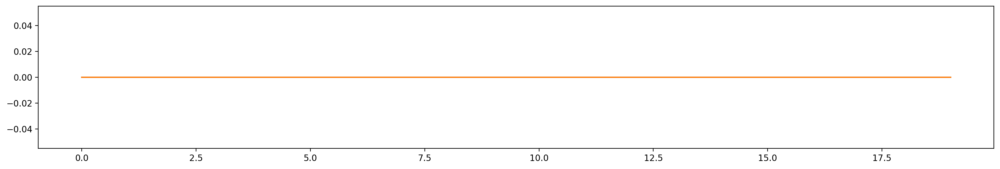

4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed
8 / 59  analysed
9 / 59  analysed
10 / 59  analysed
11 / 59  analysed
12 / 59  analysed
13 / 59  analysed
14 / 59  analysed
15 / 59  analysed
16 / 59  analysed


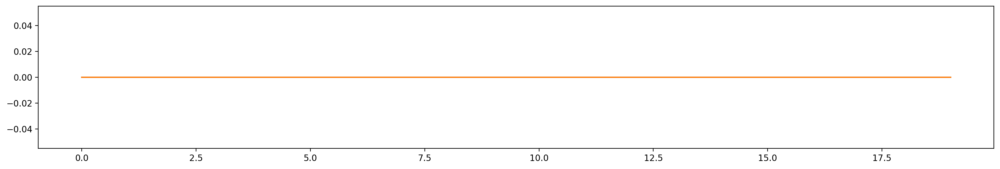

17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed


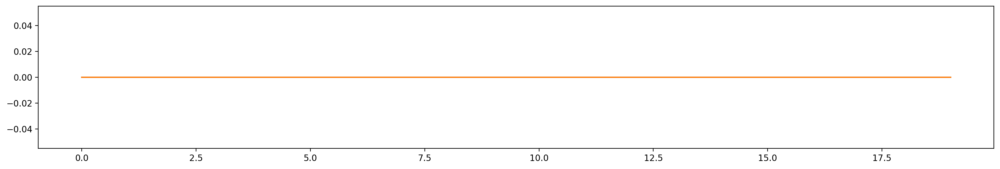

44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S08 Behaviour_competitor Push
Computing classification for Behaviour_competitor Push behaviour
0 / 59  analysed
1 / 59  analysed


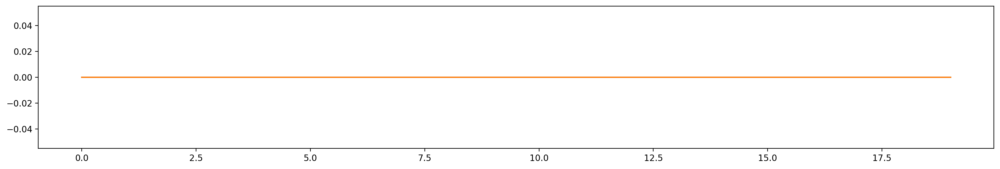

2 / 59  analysed
3 / 59  analysed


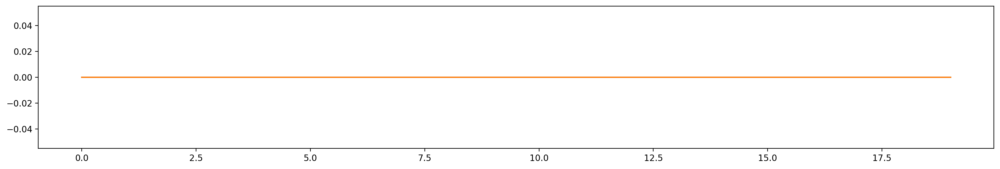

4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed
8 / 59  analysed
9 / 59  analysed


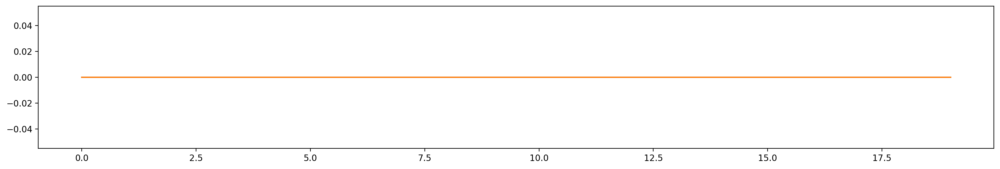

10 / 59  analysed
11 / 59  analysed
12 / 59  analysed
13 / 59  analysed
14 / 59  analysed
15 / 59  analysed
16 / 59  analysed


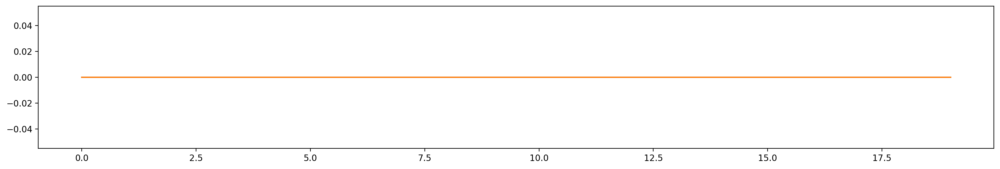

17 / 59  analysed
18 / 59  analysed
19 / 59  analysed


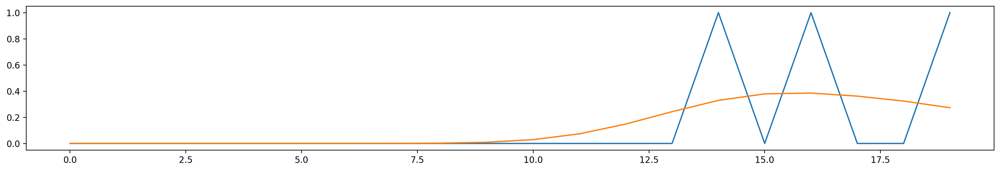

20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed


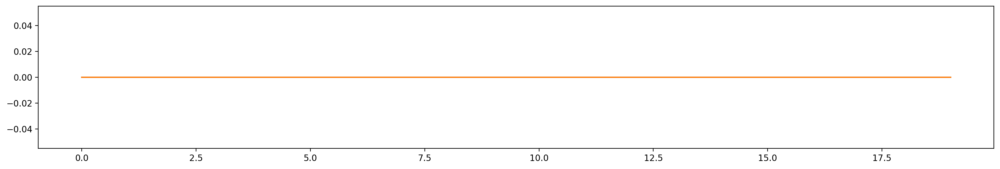

44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S08 Behaviour_competitor Move Forward
Computing classification for Behaviour_competitor Move Forward behaviour
0 / 59  analysed
1 / 59  analysed


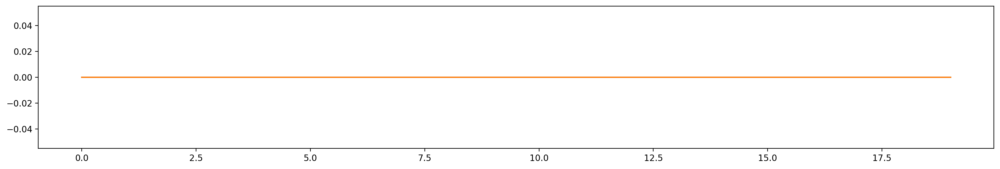

2 / 59  analysed
3 / 59  analysed
4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed
8 / 59  analysed
9 / 59  analysed
10 / 59  analysed


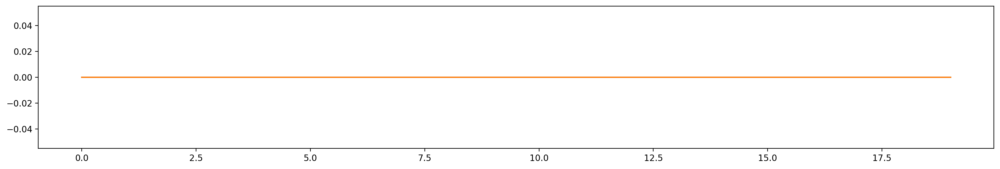

11 / 59  analysed
12 / 59  analysed
13 / 59  analysed
14 / 59  analysed
15 / 59  analysed
16 / 59  analysed


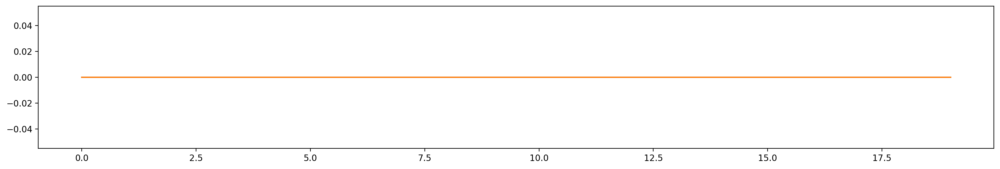

17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed


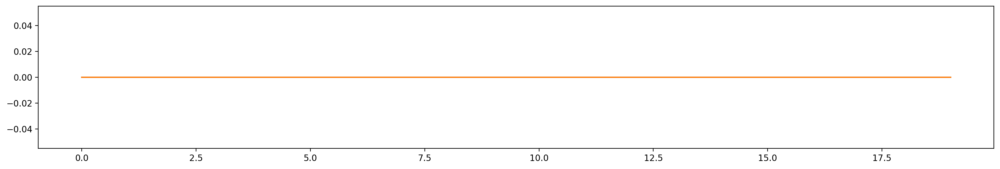

49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S08 Behaviour_competitor Resistance
Computing classification for Behaviour_competitor Resistance behaviour
0 / 59  analysed
1 / 59  analysed
2 / 59  analysed
3 / 59  analysed


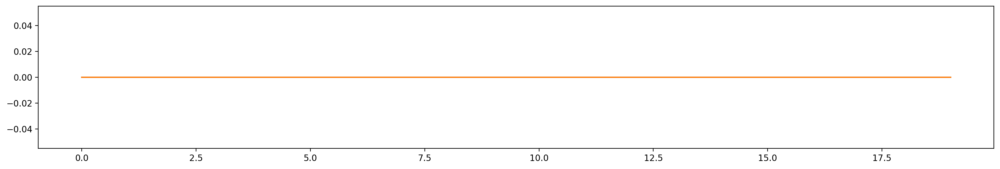

4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed
8 / 59  analysed
9 / 59  analysed
10 / 59  analysed
11 / 59  analysed
12 / 59  analysed
13 / 59  analysed
14 / 59  analysed
15 / 59  analysed
16 / 59  analysed


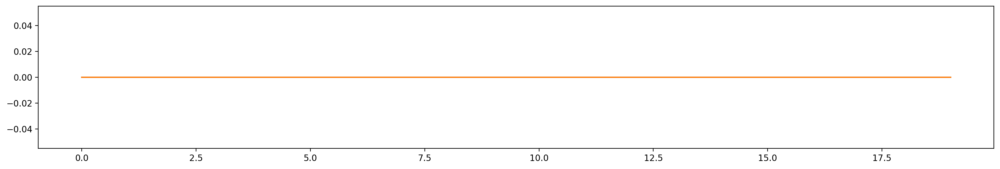

17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed


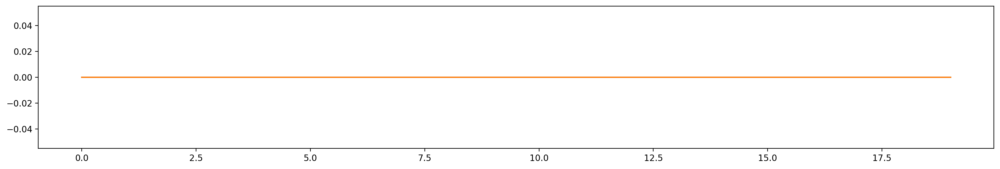

21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed


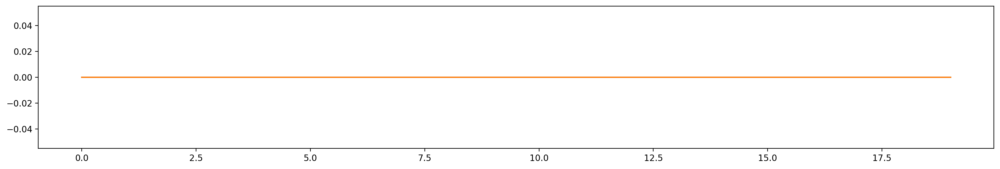

53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S08 Behaviour_competitor Retreat
Computing classification for Behaviour_competitor Retreat behaviour
0 / 59  analysed
1 / 59  analysed
2 / 59  analysed
3 / 59  analysed
4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed
8 / 59  analysed
9 / 59  analysed
10 / 59  analysed
11 / 59  analysed
12 / 59  analysed
13 / 59  analysed
14 / 59  analysed
15 / 59  analysed
16 / 59  analysed


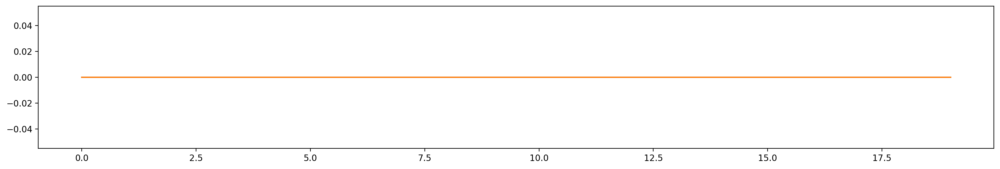

17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed


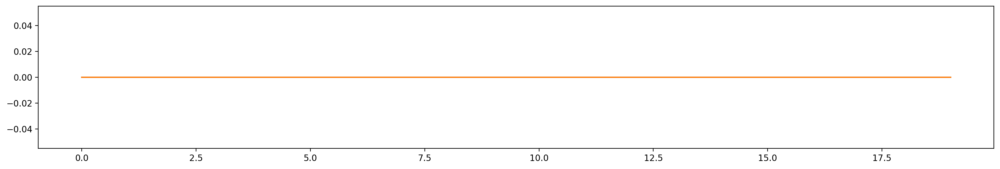

53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S08 Behaviour_competitor Withdrawal
Computing classification for Behaviour_competitor Withdrawal behaviour
0 / 59  analysed
1 / 59  analysed
2 / 59  analysed
3 / 59  analysed
4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed
8 / 59  analysed
9 / 59  analysed
10 / 59  analysed
11 / 59  analysed
12 / 59  analysed
13 / 59  analysed
14 / 59  analysed
15 / 59  analysed
16 / 59  analysed


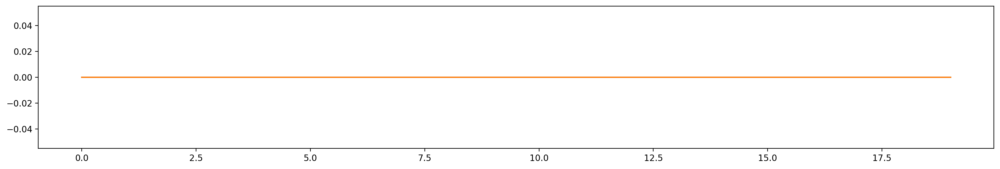

17 / 59  analysed
18 / 59  analysed
19 / 59  analysed
20 / 59  analysed
21 / 59  analysed
22 / 59  analysed
23 / 59  analysed
24 / 59  analysed
25 / 59  analysed
26 / 59  analysed
27 / 59  analysed
28 / 59  analysed
29 / 59  analysed
30 / 59  analysed
31 / 59  analysed
32 / 59  analysed
33 / 59  analysed
34 / 59  analysed
35 / 59  analysed
36 / 59  analysed
37 / 59  analysed
38 / 59  analysed
39 / 59  analysed
40 / 59  analysed
41 / 59  analysed
42 / 59  analysed
43 / 59  analysed
44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
S08 Behaviour_competitor Stillness
Computing classification for Behaviour_competitor Stillness behaviour
0 / 59  analysed
1 / 59  analysed
2 / 59  analysed
3 / 59  analysed
4 / 59  analysed
5 / 59  analysed
6 / 59  analysed
7 / 59  analysed
8 /

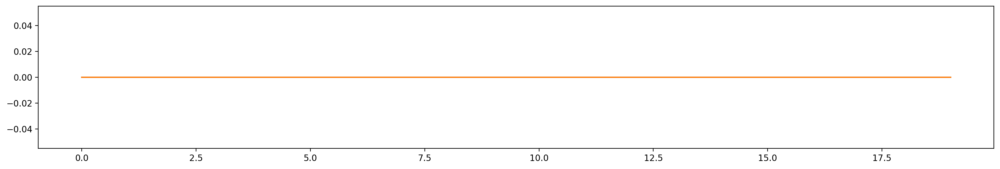

44 / 59  analysed
45 / 59  analysed
46 / 59  analysed
47 / 59  analysed
48 / 59  analysed
49 / 59  analysed
50 / 59  analysed
51 / 59  analysed
52 / 59  analysed
53 / 59  analysed
54 / 59  analysed
55 / 59  analysed
56 / 59  analysed
57 / 59  analysed
58 / 59  analysed
H4009_P1_S12_trace_behav_aligned.csv S12
S12 Behaviour_imaged Push
Computing classification for Behaviour_imaged Push behaviour
0 / 32  analysed
1 / 32  analysed
2 / 32  analysed
3 / 32  analysed
4 / 32  analysed
5 / 32  analysed
6 / 32  analysed
7 / 32  analysed
8 / 32  analysed
9 / 32  analysed
10 / 32  analysed
11 / 32  analysed
12 / 32  analysed
13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  analysed
24 / 32  analysed
25 / 32  analysed
26 / 32  analysed
27 / 32  analysed
28 / 32  analysed
29 / 32  analysed
30 / 32  analysed
31 / 32  analysed
S12 Behaviour_imaged Move Forward
Co

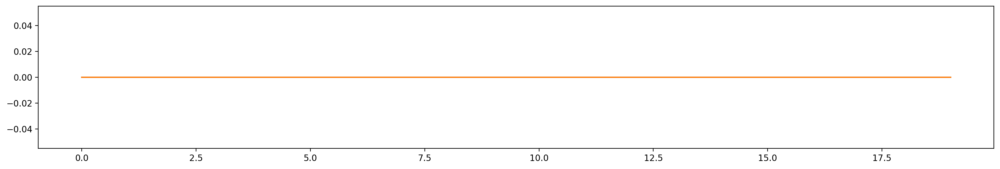

5 / 32  analysed
6 / 32  analysed
7 / 32  analysed
8 / 32  analysed
9 / 32  analysed
10 / 32  analysed
11 / 32  analysed
12 / 32  analysed
13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  analysed
24 / 32  analysed
25 / 32  analysed
26 / 32  analysed
27 / 32  analysed
28 / 32  analysed
29 / 32  analysed
30 / 32  analysed
31 / 32  analysed
S06 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 32  analysed
1 / 32  analysed
2 / 32  analysed
3 / 32  analysed
4 / 32  analysed
5 / 32  analysed
6 / 32  analysed
7 / 32  analysed
8 / 32  analysed
9 / 32  analysed
10 / 32  analysed
11 / 32  analysed
12 / 32  analysed
13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  analysed


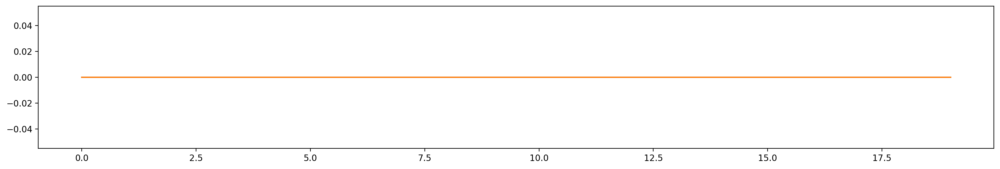

5 / 32  analysed
6 / 32  analysed
7 / 32  analysed
8 / 32  analysed
9 / 32  analysed
10 / 32  analysed
11 / 32  analysed
12 / 32  analysed
13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  analysed
24 / 32  analysed
25 / 32  analysed
26 / 32  analysed
27 / 32  analysed
28 / 32  analysed
29 / 32  analysed
30 / 32  analysed
31 / 32  analysed
S06 Behaviour_competitor Stillness
Computing classification for Behaviour_competitor Stillness behaviour
0 / 32  analysed
1 / 32  analysed
2 / 32  analysed
3 / 32  analysed
4 / 32  analysed


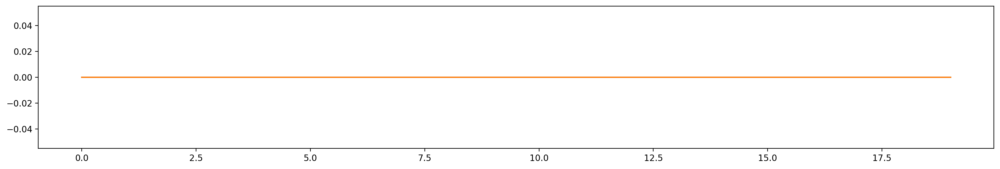

5 / 32  analysed
6 / 32  analysed
7 / 32  analysed
8 / 32  analysed
9 / 32  analysed
10 / 32  analysed
11 / 32  analysed
12 / 32  analysed
13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  analysed
24 / 32  analysed
25 / 32  analysed
26 / 32  analysed
27 / 32  analysed
28 / 32  analysed
29 / 32  analysed
30 / 32  analysed
31 / 32  analysed
H4009_P1_S04_trace_behav_aligned.csv S04
S04 Behaviour_imaged Push
Computing classification for Behaviour_imaged Push behaviour
0 / 32  analysed


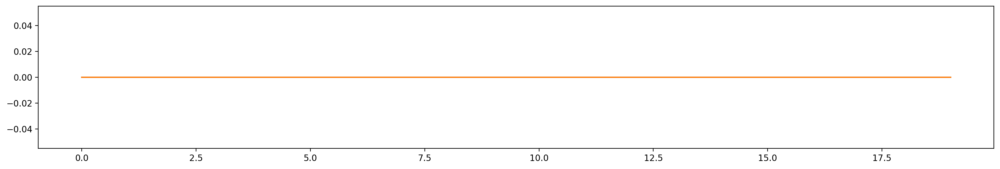

1 / 32  analysed
2 / 32  analysed
3 / 32  analysed
4 / 32  analysed


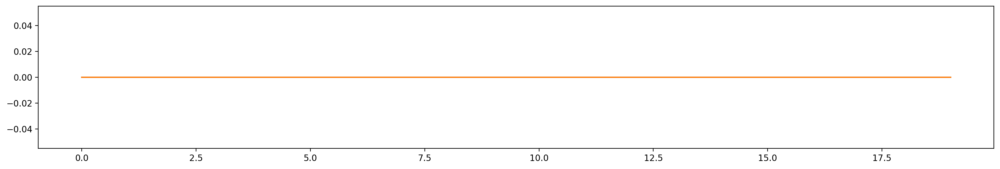

5 / 32  analysed
6 / 32  analysed
7 / 32  analysed
8 / 32  analysed
9 / 32  analysed
10 / 32  analysed
11 / 32  analysed
12 / 32  analysed
13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  analysed
24 / 32  analysed
25 / 32  analysed
26 / 32  analysed
27 / 32  analysed
28 / 32  analysed
29 / 32  analysed
30 / 32  analysed
31 / 32  analysed
S04 Behaviour_imaged Move Forward
Computing classification for Behaviour_imaged Move Forward behaviour
0 / 32  analysed
1 / 32  analysed
2 / 32  analysed
3 / 32  analysed
4 / 32  analysed
5 / 32  analysed
6 / 32  analysed
7 / 32  analysed
8 / 32  analysed
9 / 32  analysed
10 / 32  analysed
11 / 32  analysed
12 / 32  analysed
13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  ana

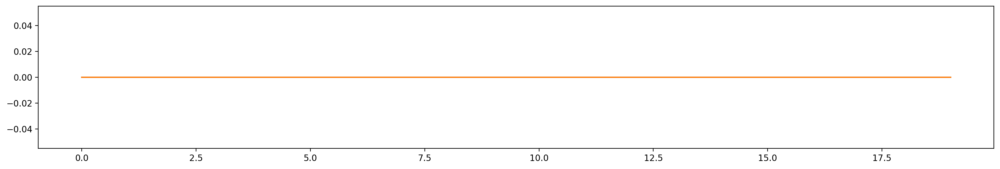

13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  analysed
24 / 32  analysed
25 / 32  analysed
26 / 32  analysed
27 / 32  analysed
28 / 32  analysed
29 / 32  analysed
30 / 32  analysed
31 / 32  analysed
S04 Behaviour_imaged Retreat
Behaviour_imaged Retreat behaviour not exhibted
S04 Behaviour_imaged Withdrawal
Computing classification for Behaviour_imaged Withdrawal behaviour
0 / 32  analysed
1 / 32  analysed
2 / 32  analysed
3 / 32  analysed


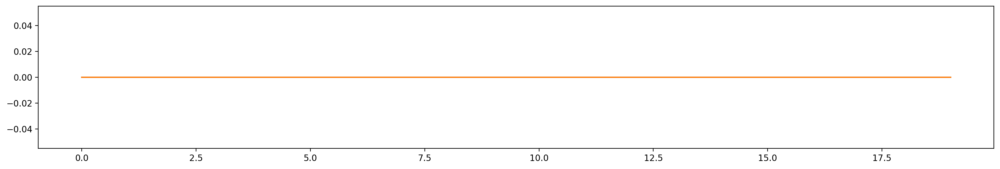

4 / 32  analysed


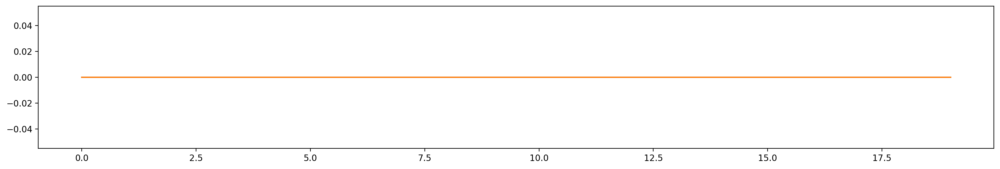

5 / 32  analysed
6 / 32  analysed
7 / 32  analysed
8 / 32  analysed
9 / 32  analysed
10 / 32  analysed
11 / 32  analysed
12 / 32  analysed
13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  analysed
24 / 32  analysed
25 / 32  analysed
26 / 32  analysed
27 / 32  analysed
28 / 32  analysed
29 / 32  analysed
30 / 32  analysed
31 / 32  analysed
S04 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 32  analysed
1 / 32  analysed
2 / 32  analysed
3 / 32  analysed
4 / 32  analysed
5 / 32  analysed
6 / 32  analysed
7 / 32  analysed
8 / 32  analysed
9 / 32  analysed
10 / 32  analysed
11 / 32  analysed
12 / 32  analysed
13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  analysed


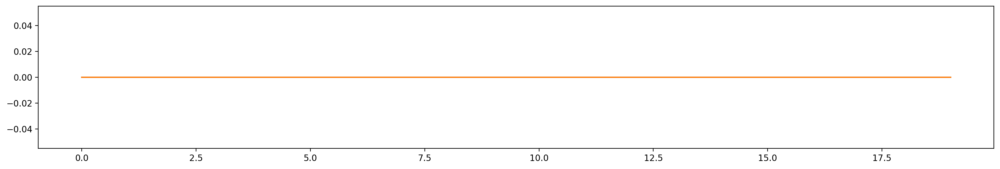

13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  analysed
24 / 32  analysed
25 / 32  analysed
26 / 32  analysed
27 / 32  analysed
28 / 32  analysed
29 / 32  analysed
30 / 32  analysed
31 / 32  analysed
S04 Behaviour_competitor Move Forward
Behaviour_competitor Move Forward behaviour not exhibted
S04 Behaviour_competitor Resistance
Computing classification for Behaviour_competitor Resistance behaviour
0 / 32  analysed
1 / 32  analysed
2 / 32  analysed
3 / 32  analysed
4 / 32  analysed


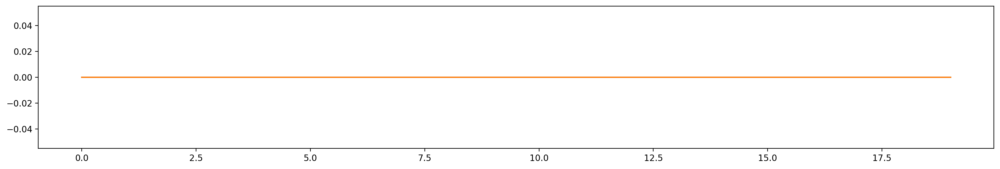

5 / 32  analysed
6 / 32  analysed
7 / 32  analysed
8 / 32  analysed
9 / 32  analysed
10 / 32  analysed
11 / 32  analysed
12 / 32  analysed
13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  analysed
24 / 32  analysed
25 / 32  analysed
26 / 32  analysed
27 / 32  analysed
28 / 32  analysed
29 / 32  analysed
30 / 32  analysed
31 / 32  analysed
S04 Behaviour_competitor Retreat
Computing classification for Behaviour_competitor Retreat behaviour
0 / 32  analysed
1 / 32  analysed
2 / 32  analysed
3 / 32  analysed
4 / 32  analysed
5 / 32  analysed
6 / 32  analysed
7 / 32  analysed
8 / 32  analysed
9 / 32  analysed
10 / 32  analysed
11 / 32  analysed
12 / 32  analysed
13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  analy

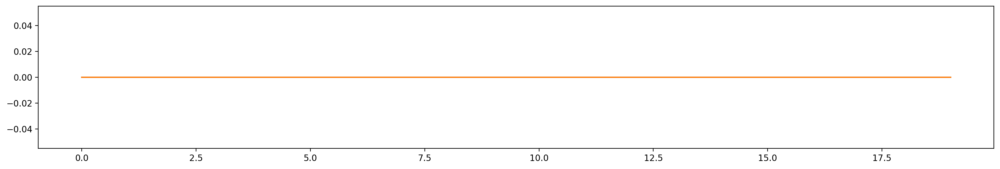

4 / 32  analysed
5 / 32  analysed
6 / 32  analysed
7 / 32  analysed
8 / 32  analysed
9 / 32  analysed
10 / 32  analysed
11 / 32  analysed
12 / 32  analysed
13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  analysed
24 / 32  analysed
25 / 32  analysed
26 / 32  analysed
27 / 32  analysed
28 / 32  analysed
29 / 32  analysed
30 / 32  analysed
31 / 32  analysed
H4009_P1_S10_trace_behav_aligned.csv S10
S10 Behaviour_imaged Push
Computing classification for Behaviour_imaged Push behaviour
0 / 32  analysed
1 / 32  analysed
2 / 32  analysed
3 / 32  analysed
4 / 32  analysed
5 / 32  analysed
6 / 32  analysed
7 / 32  analysed
8 / 32  analysed
9 / 32  analysed
10 / 32  analysed
11 / 32  analysed
12 / 32  analysed
13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 3

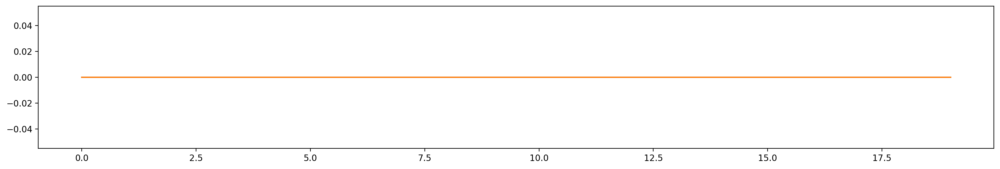

30 / 32  analysed
31 / 32  analysed
S14 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 32  analysed
1 / 32  analysed
2 / 32  analysed
3 / 32  analysed
4 / 32  analysed
5 / 32  analysed
6 / 32  analysed
7 / 32  analysed
8 / 32  analysed
9 / 32  analysed
10 / 32  analysed
11 / 32  analysed
12 / 32  analysed
13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  analysed
24 / 32  analysed
25 / 32  analysed
26 / 32  analysed
27 / 32  analysed
28 / 32  analysed
29 / 32  analysed
30 / 32  analysed
31 / 32  analysed
S14 Behaviour_competitor Push
Behaviour_competitor Push behaviour not exhibted
S14 Behaviour_competitor Move Forward
Computing classification for Behaviour_competitor Move Forward behaviour
0 / 32  analysed
1 / 32  analysed
2 / 32  analysed
3 / 32  analysed
4 / 32  analysed
5 / 32  analysed
6 / 32  a

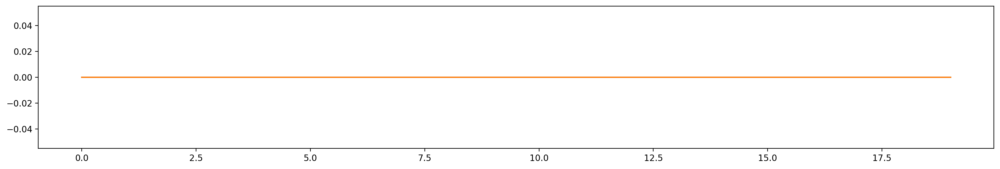

25 / 32  analysed
26 / 32  analysed
27 / 32  analysed
28 / 32  analysed
29 / 32  analysed
30 / 32  analysed
31 / 32  analysed
S14 Behaviour_competitor Stillness
Computing classification for Behaviour_competitor Stillness behaviour
0 / 32  analysed
1 / 32  analysed
2 / 32  analysed
3 / 32  analysed
4 / 32  analysed
5 / 32  analysed
6 / 32  analysed
7 / 32  analysed
8 / 32  analysed
9 / 32  analysed
10 / 32  analysed
11 / 32  analysed
12 / 32  analysed
13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  analysed
24 / 32  analysed
25 / 32  analysed
26 / 32  analysed
27 / 32  analysed
28 / 32  analysed
29 / 32  analysed
30 / 32  analysed
31 / 32  analysed
H4009_P1_S08_trace_behav_aligned.csv S08
S08 Behaviour_imaged Push
Computing classification for Behaviour_imaged Push behaviour
0 / 32  analysed
1 / 32  analysed
2 / 32  analysed
3 / 32  analysed
4 / 32 

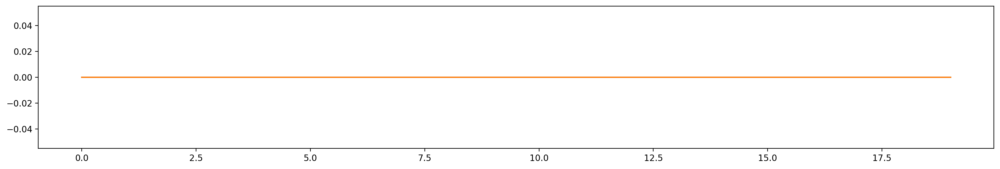

12 / 32  analysed
13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  analysed
24 / 32  analysed
25 / 32  analysed
26 / 32  analysed
27 / 32  analysed
28 / 32  analysed
29 / 32  analysed
30 / 32  analysed
31 / 32  analysed
S08 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 32  analysed
1 / 32  analysed
2 / 32  analysed
3 / 32  analysed
4 / 32  analysed
5 / 32  analysed
6 / 32  analysed
7 / 32  analysed
8 / 32  analysed
9 / 32  analysed
10 / 32  analysed
11 / 32  analysed
12 / 32  analysed
13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  analysed
24 / 32  analysed
25 / 32  analysed
26 / 32  analysed
27 / 32  analysed
28 / 32  analysed
29 / 32  analysed
30 / 32  anal

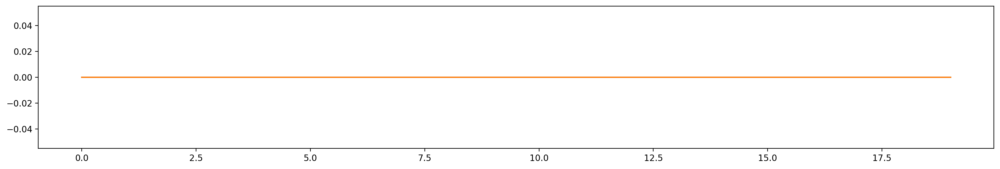

12 / 32  analysed
13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  analysed
24 / 32  analysed
25 / 32  analysed
26 / 32  analysed
27 / 32  analysed
28 / 32  analysed
29 / 32  analysed
30 / 32  analysed
31 / 32  analysed
S08 Behaviour_competitor Stillness
Computing classification for Behaviour_competitor Stillness behaviour
0 / 32  analysed
1 / 32  analysed
2 / 32  analysed
3 / 32  analysed
4 / 32  analysed
5 / 32  analysed
6 / 32  analysed
7 / 32  analysed
8 / 32  analysed
9 / 32  analysed
10 / 32  analysed
11 / 32  analysed
12 / 32  analysed
13 / 32  analysed
14 / 32  analysed
15 / 32  analysed
16 / 32  analysed
17 / 32  analysed
18 / 32  analysed
19 / 32  analysed
20 / 32  analysed
21 / 32  analysed
22 / 32  analysed
23 / 32  analysed
24 / 32  analysed
25 / 32  analysed
26 / 32  analysed
27 / 32  analysed
28 / 32  analysed
29 / 32  analysed
30 / 

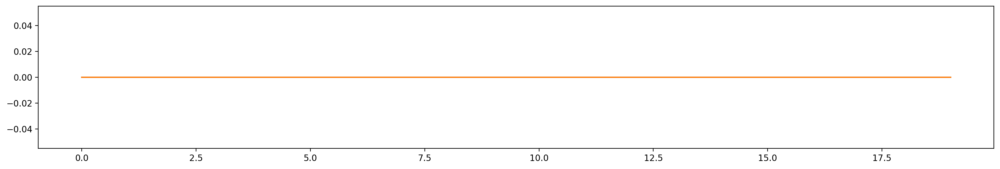

9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed


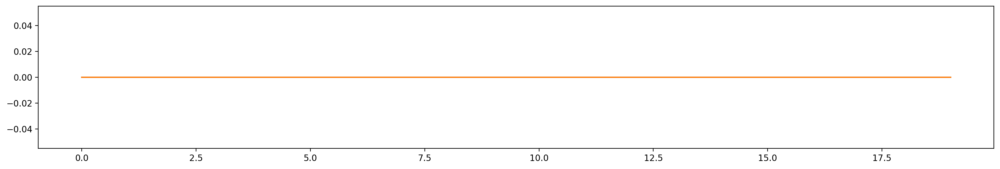

13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed


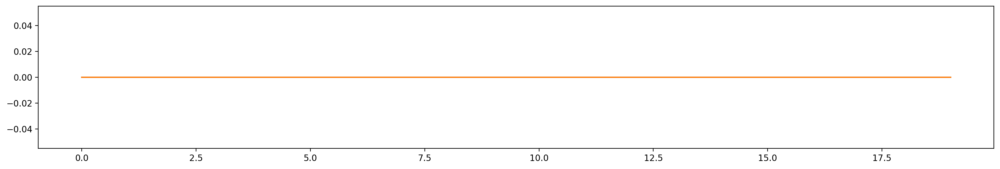

32 / 39  analysed
33 / 39  analysed
34 / 39  analysed


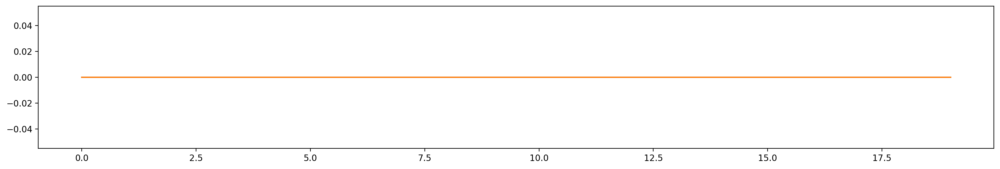

35 / 39  analysed
36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
S12 Behaviour_imaged Move Forward
Computing classification for Behaviour_imaged Move Forward behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed


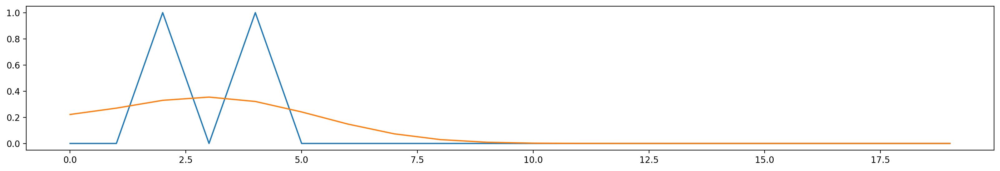

5 / 39  analysed
6 / 39  analysed


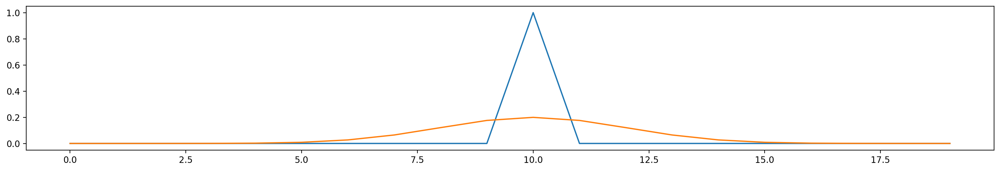

7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed


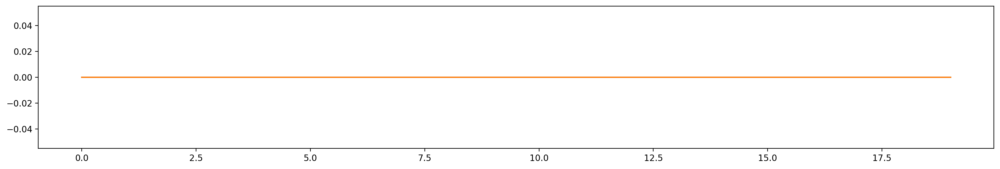

20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed


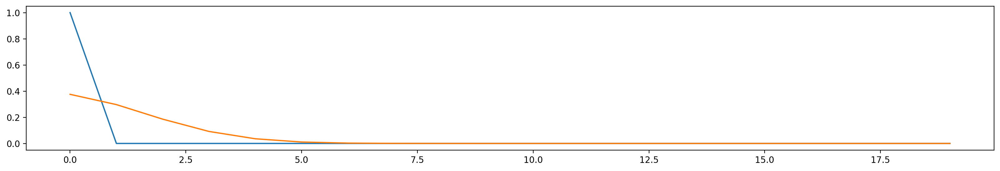

30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed


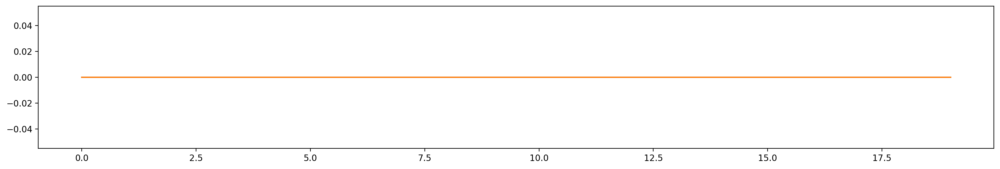

35 / 39  analysed
36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
S12 Behaviour_imaged Resistance
Computing classification for Behaviour_imaged Resistance behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed


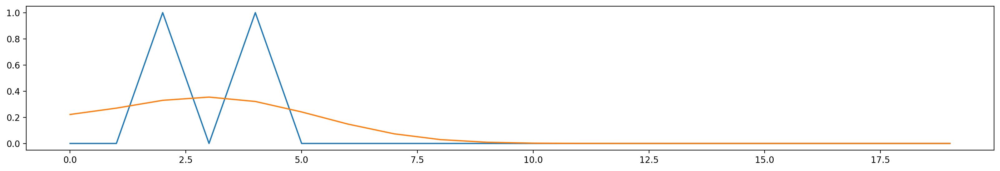

5 / 39  analysed
6 / 39  analysed


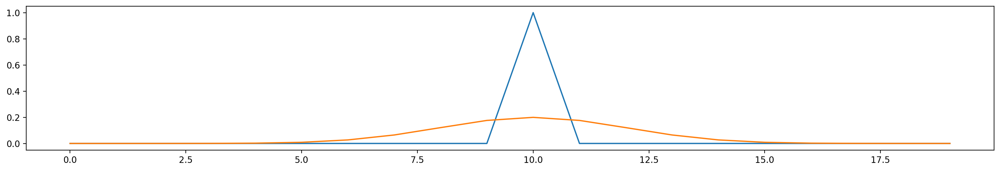

7 / 39  analysed


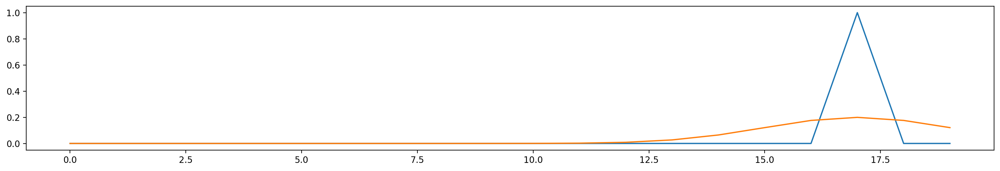

8 / 39  analysed


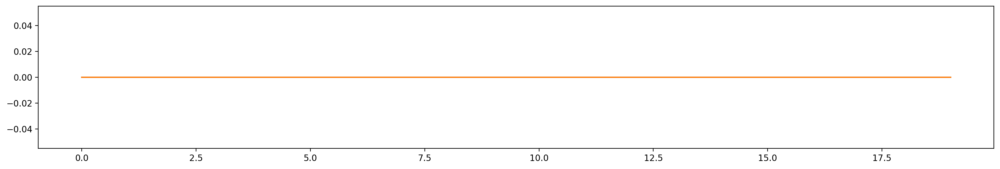

9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed


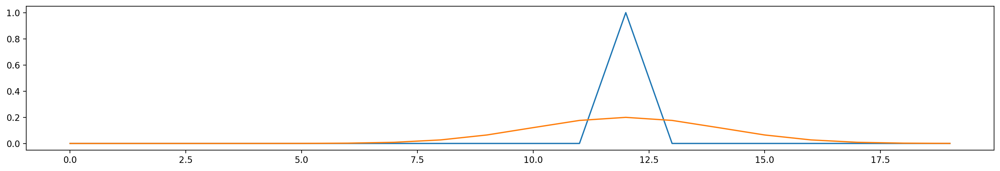

23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed


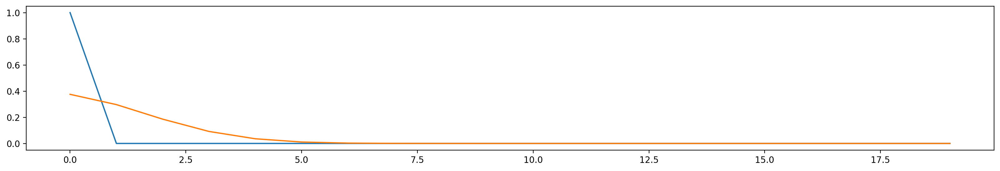

30 / 39  analysed


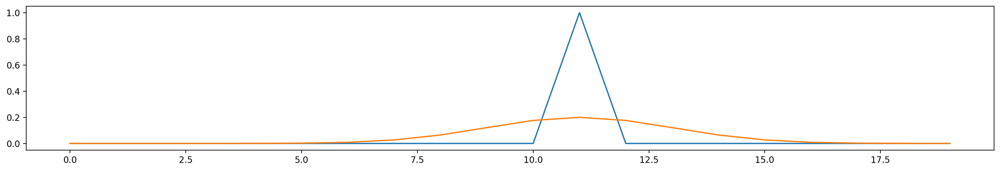

31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed
36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
S12 Behaviour_imaged Retreat
Computing classification for Behaviour_imaged Retreat behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed


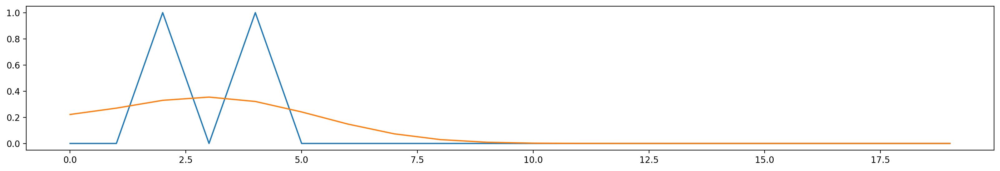

5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed
36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
S12 Behaviour_imaged Withdrawal
Behaviour_imaged Withdrawal behaviour not exhibted
S12 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39

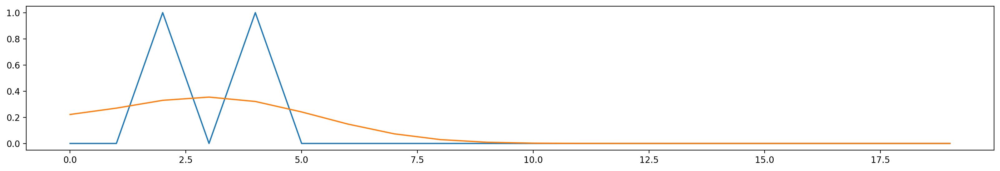

5 / 39  analysed
6 / 39  analysed


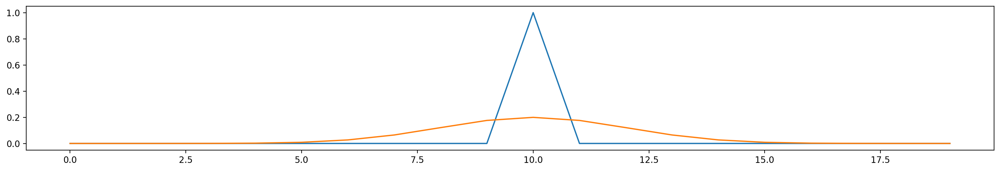

7 / 39  analysed


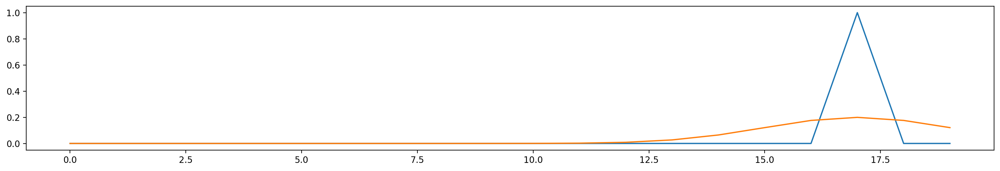

8 / 39  analysed


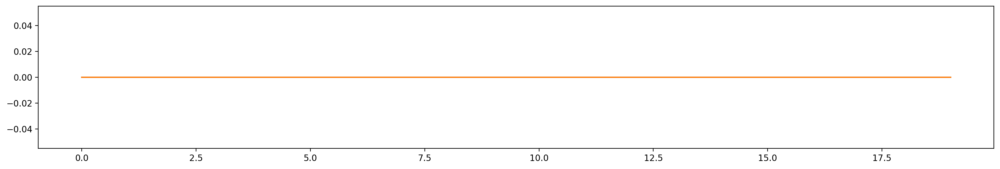

9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed


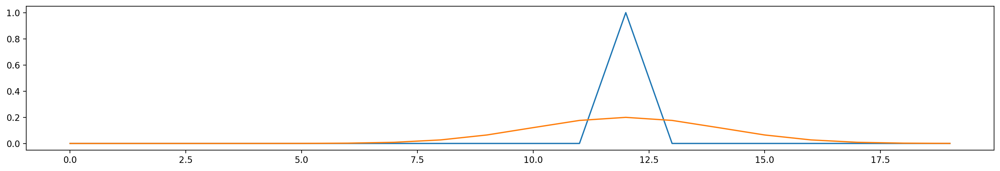

23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed


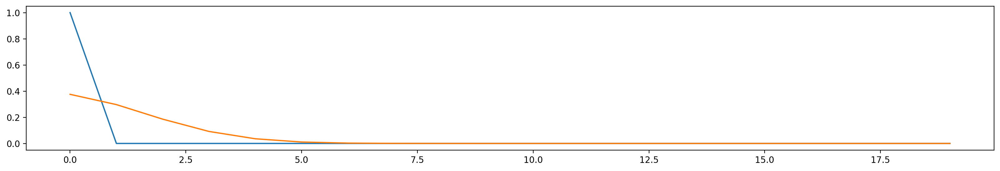

30 / 39  analysed


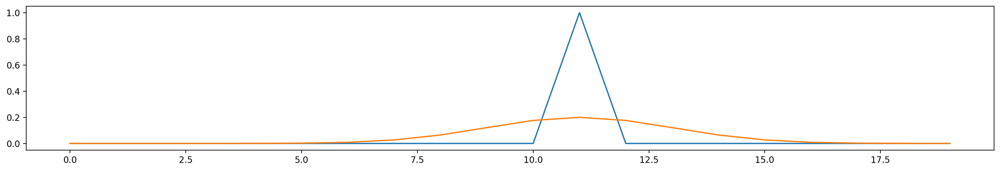

31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed
36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
S12 Behaviour_competitor Move Forward
Behaviour_competitor Move Forward behaviour not exhibted
S12 Behaviour_competitor Resistance
Computing classification for Behaviour_competitor Resistance behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed


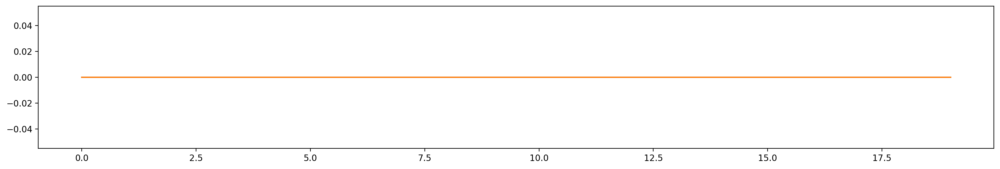

13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed


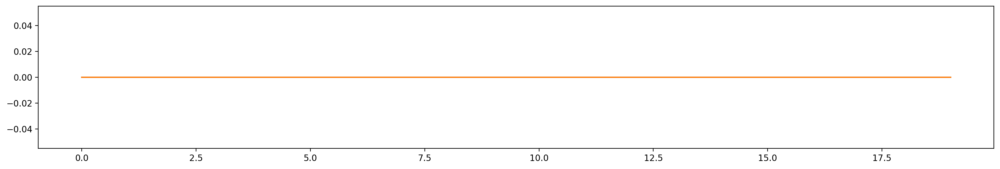

35 / 39  analysed
36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
S12 Behaviour_competitor Retreat
Computing classification for Behaviour_competitor Retreat behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed


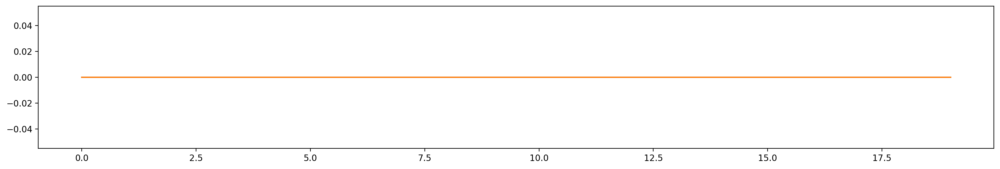

32 / 39  analysed
33 / 39  analysed
34 / 39  analysed


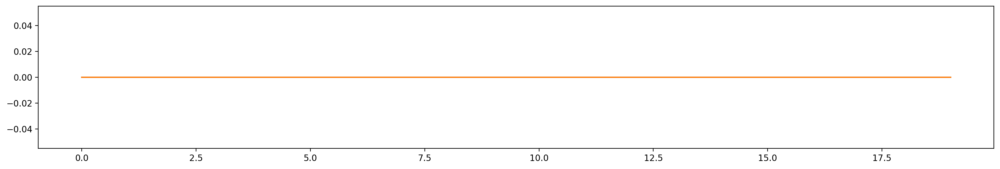

35 / 39  analysed
36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
S12 Behaviour_competitor Withdrawal
Computing classification for Behaviour_competitor Withdrawal behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed


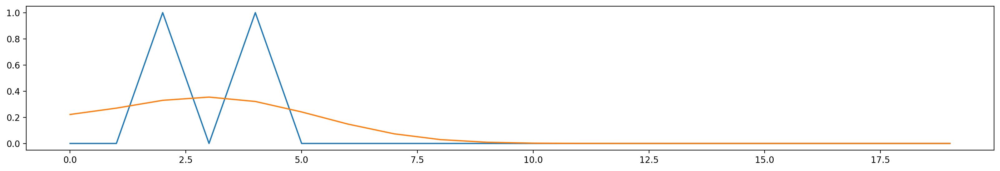

5 / 39  analysed
6 / 39  analysed


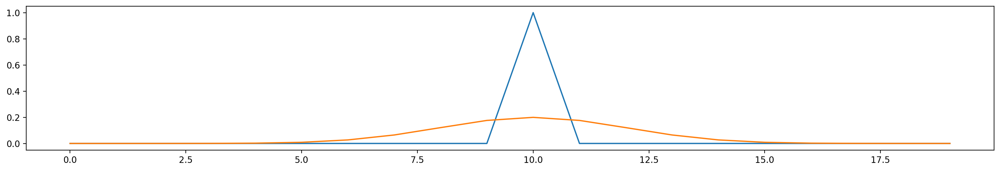

7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed


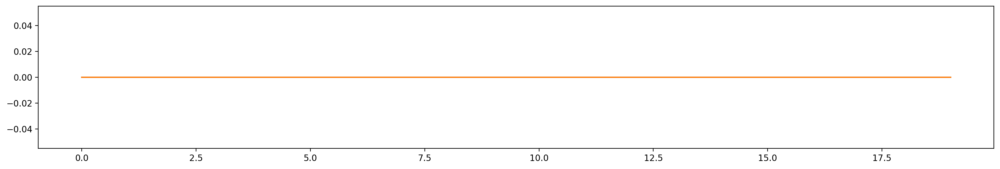

20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed


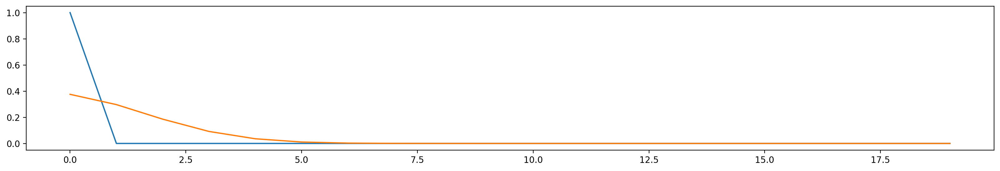

30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed


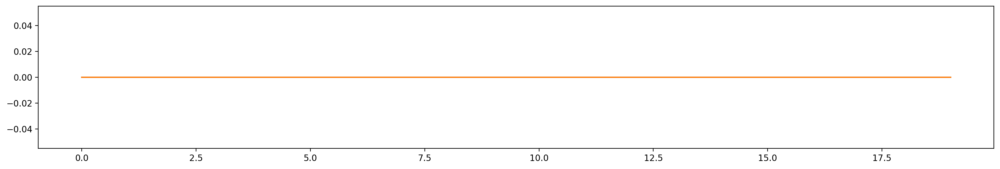

35 / 39  analysed
36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
S12 Behaviour_competitor Stillness
Computing classification for Behaviour_competitor Stillness behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed
36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
H4010_P1_S06_trace_behav_aligned.csv S06
S06 Behaviour_imaged Push
Computing classification for Behaviour_imaged Push behaviour
0 /

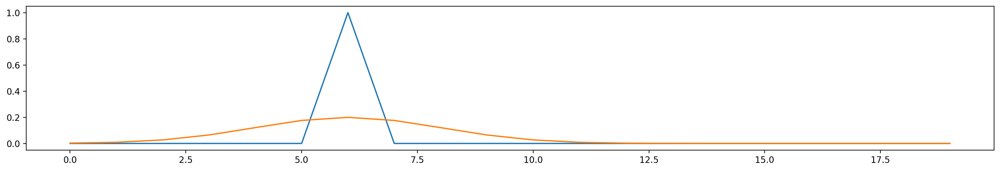

9 / 39  analysed


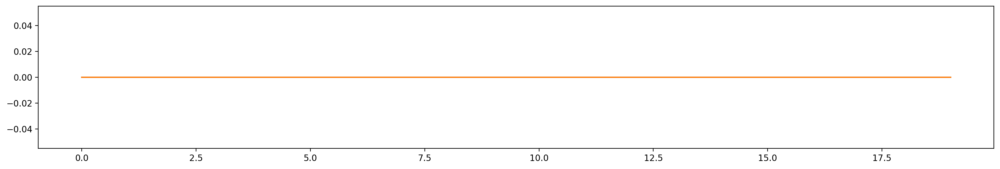

10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed


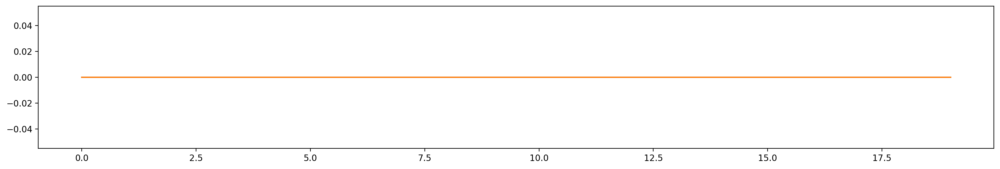

23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed
36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
S06 Behaviour_imaged Move Forward
Computing classification for Behaviour_imaged Move Forward behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39

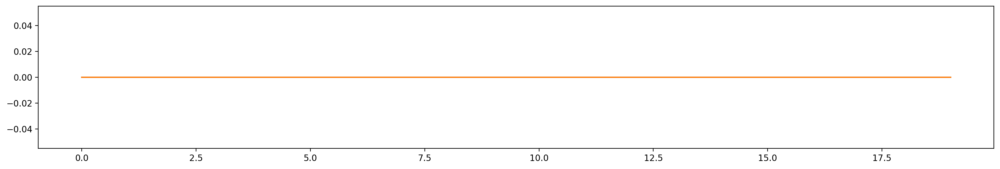

10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed


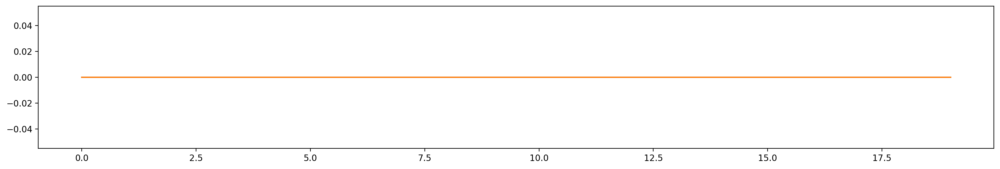

17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed
36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
S06 Behaviour_imaged Withdrawal
Behaviour_imaged Withdrawal behaviour not exhibted
S06 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24

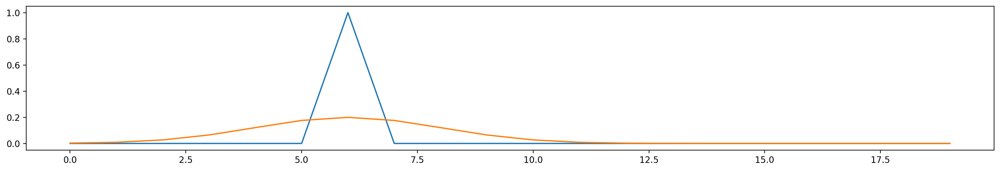

9 / 39  analysed


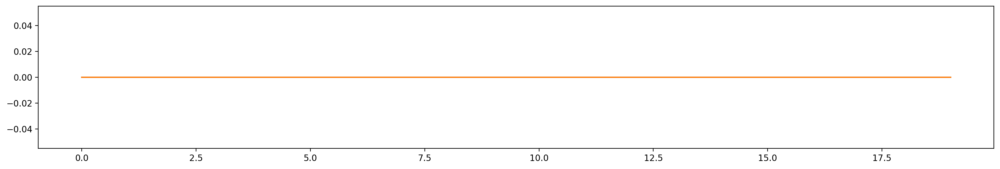

10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed


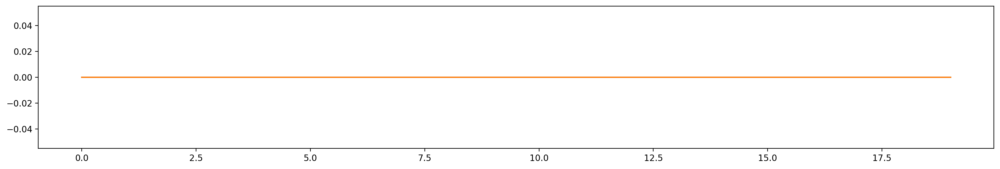

17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed
36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
S06 Behaviour_competitor Withdrawal
Computing classification for Behaviour_competitor Withdrawal behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 

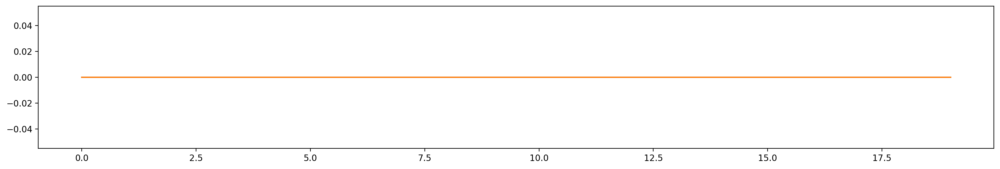

15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed
36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
S04 Behaviour_imaged Withdrawal
Computing classification for Behaviour_imaged Withdrawal behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  an

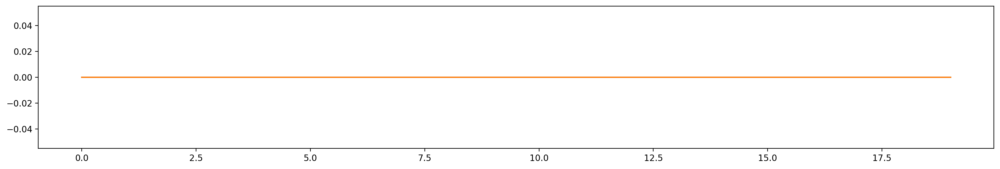

15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed
36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
S04 Behaviour_competitor Move Forward
Computing classification for Behaviour_competitor Move Forward behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed

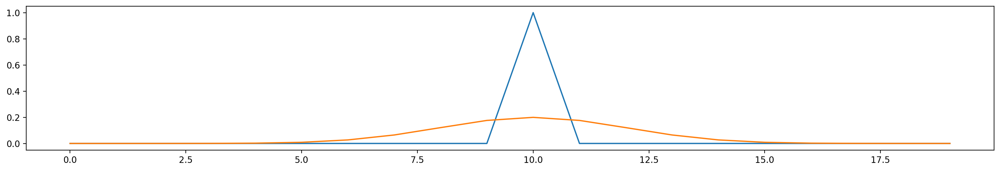

9 / 39  analysed
10 / 39  analysed


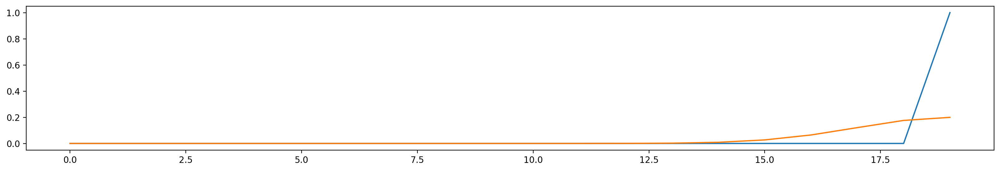

11 / 39  analysed
12 / 39  analysed


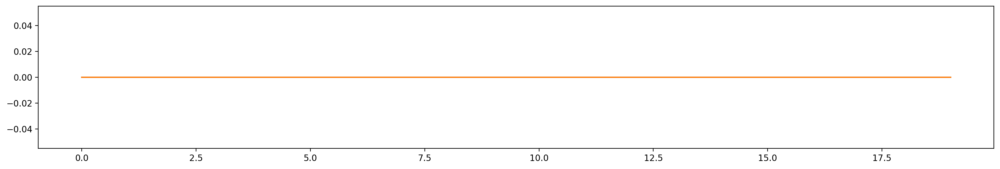

13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed


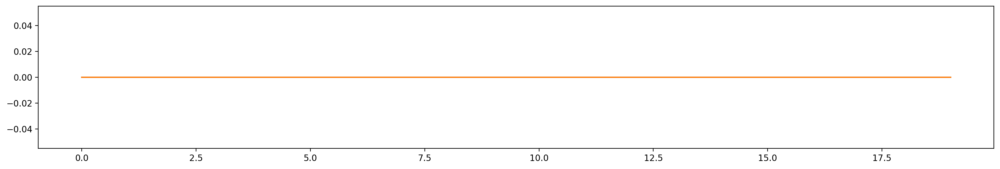

26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed
36 / 39  analysed
37 / 39  analysed


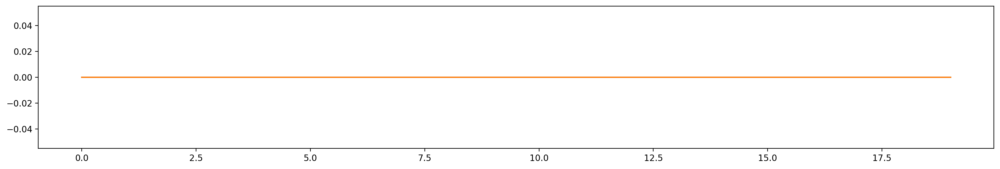

38 / 39  analysed


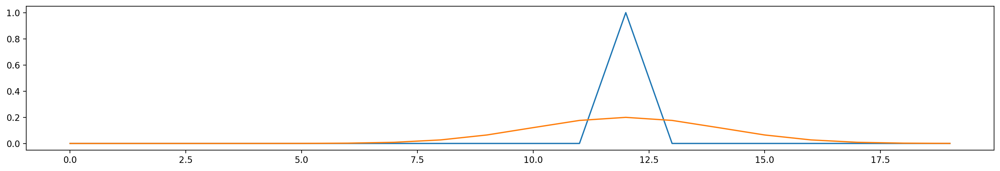

S10 Behaviour_imaged Move Forward
Computing classification for Behaviour_imaged Move Forward behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed


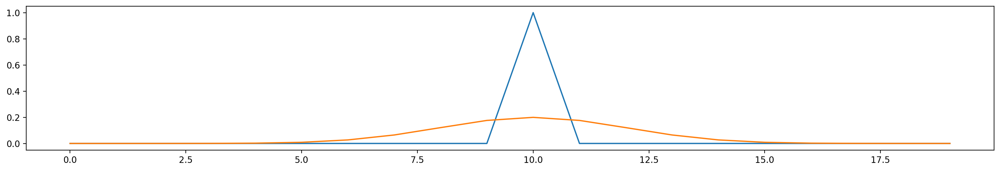

9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed


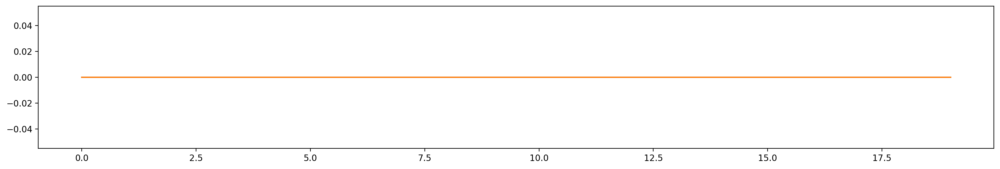

23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed
36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
S10 Behaviour_imaged Resistance
Computing classification for Behaviour_imaged Resistance behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed


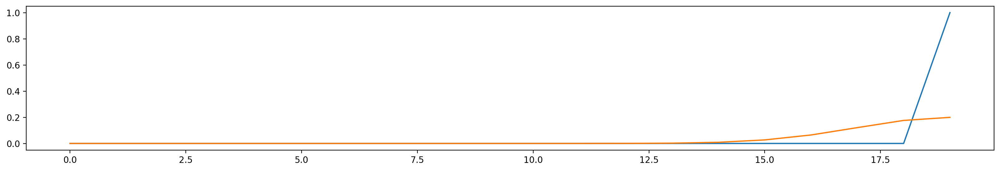

11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed


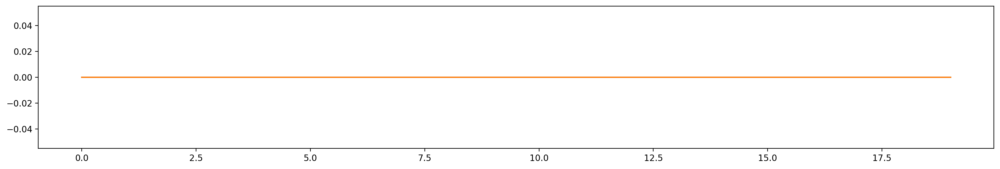

26 / 39  analysed


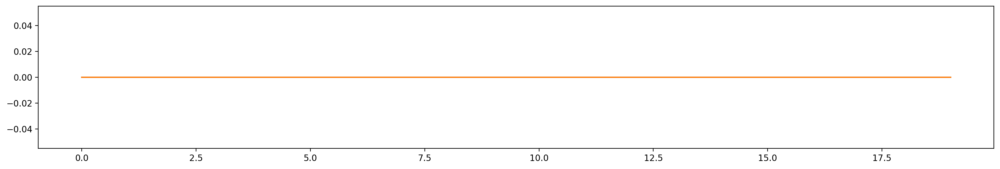

27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed


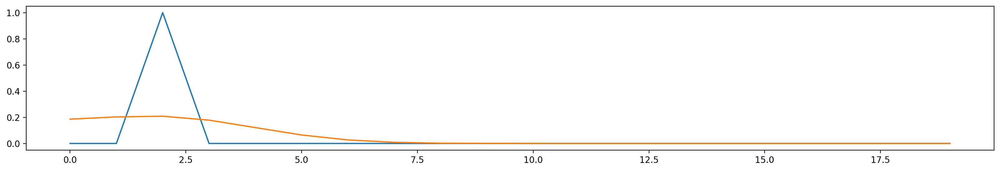

36 / 39  analysed
37 / 39  analysed
38 / 39  analysed


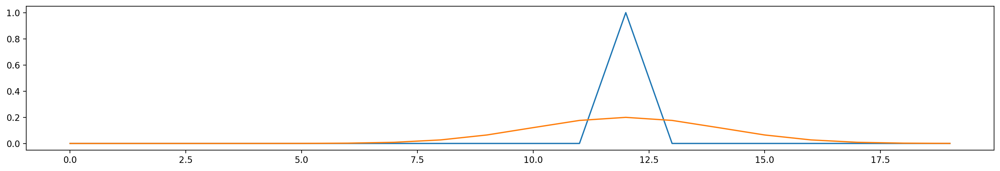

S10 Behaviour_imaged Retreat
Behaviour_imaged Retreat behaviour not exhibted
S10 Behaviour_imaged Withdrawal
Behaviour_imaged Withdrawal behaviour not exhibted
S10 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed


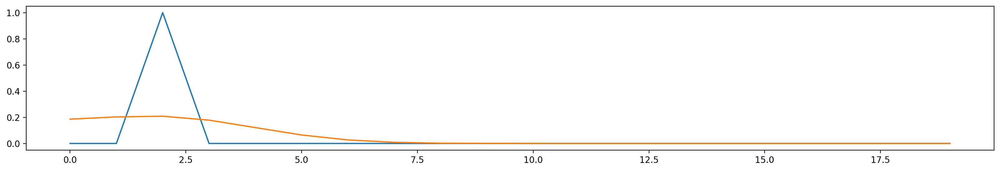

36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
S10 Behaviour_competitor Push
Computing classification for Behaviour_competitor Push behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed


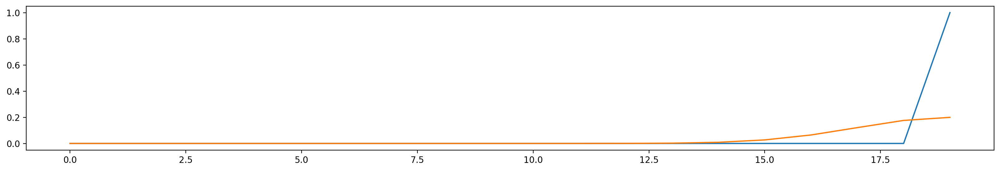

11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed


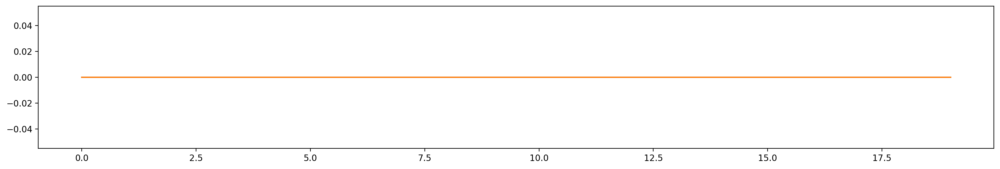

26 / 39  analysed


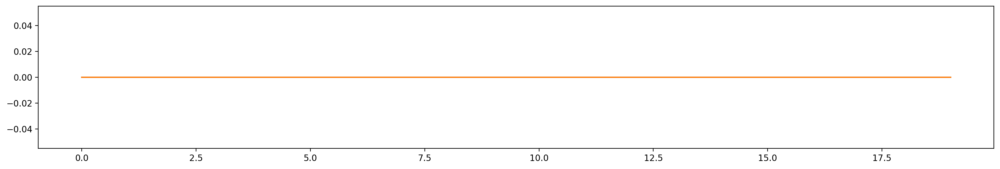

27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed


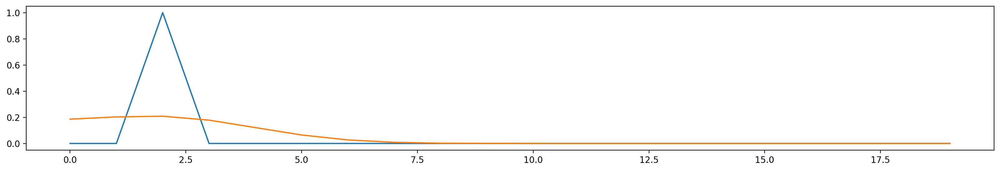

36 / 39  analysed
37 / 39  analysed
38 / 39  analysed


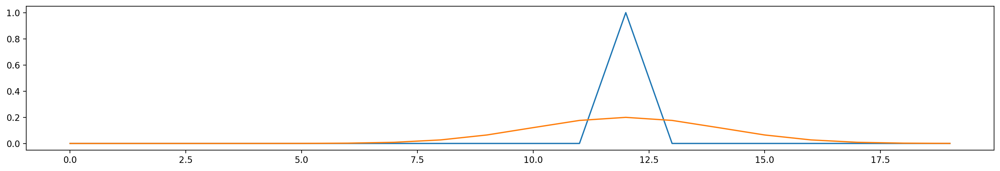

S10 Behaviour_competitor Move Forward
Behaviour_competitor Move Forward behaviour not exhibted
S10 Behaviour_competitor Resistance
Computing classification for Behaviour_competitor Resistance behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed


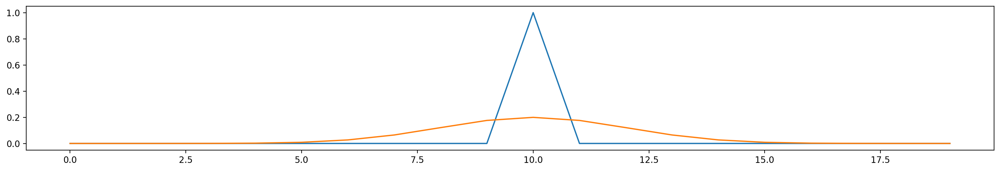

9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed
36 / 39  analysed
37 / 39  analysed


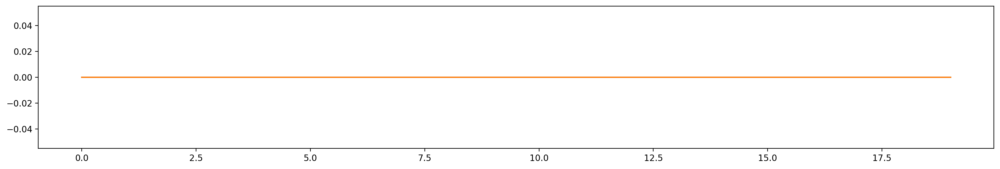

38 / 39  analysed


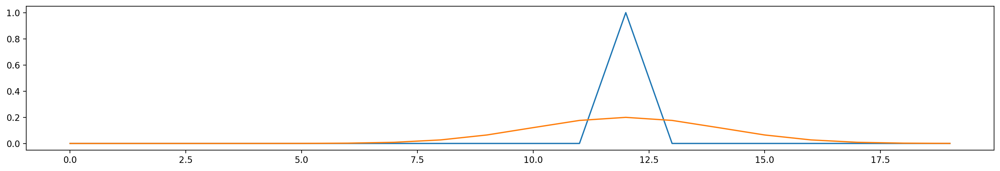

S10 Behaviour_competitor Retreat
Computing classification for Behaviour_competitor Retreat behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed


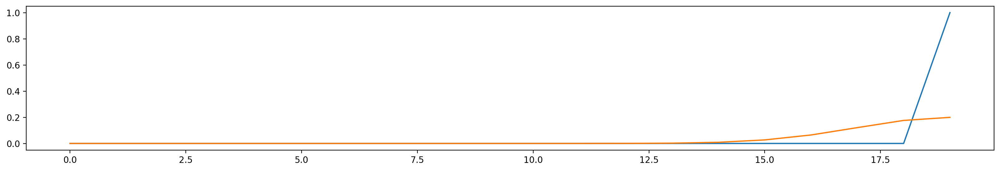

11 / 39  analysed
12 / 39  analysed


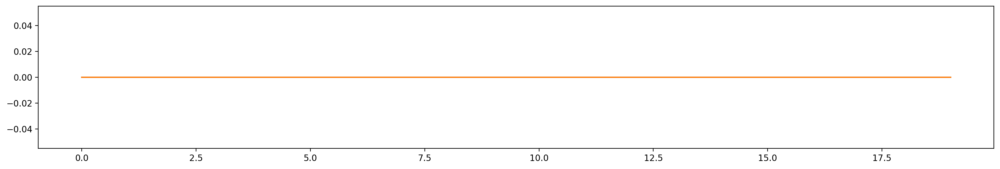

13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed
36 / 39  analysed
37 / 39  analysed
38 / 39  analysed


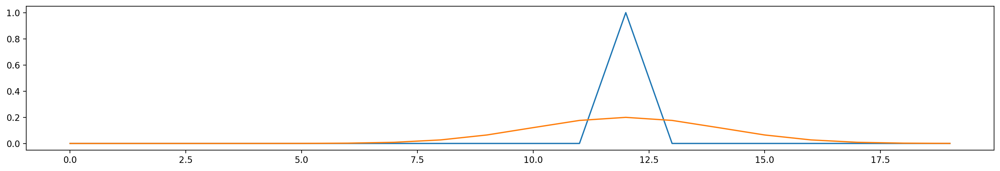

S10 Behaviour_competitor Withdrawal
Computing classification for Behaviour_competitor Withdrawal behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed


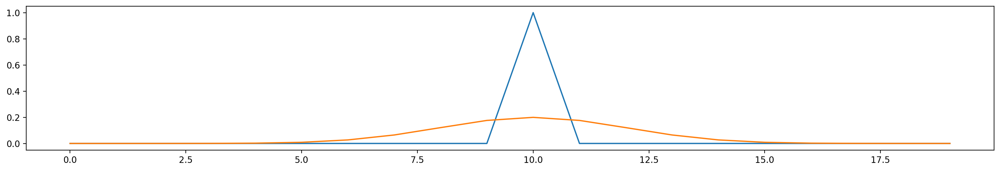

9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed


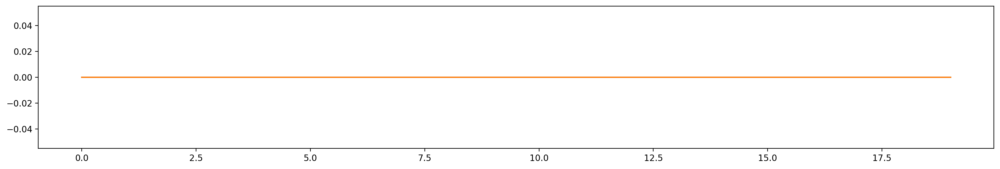

22 / 39  analysed


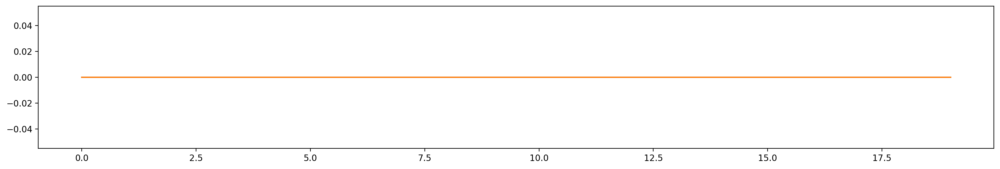

23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed


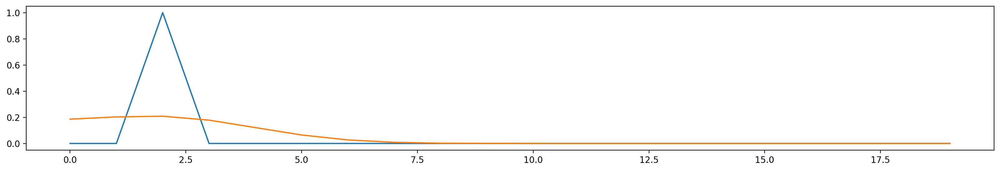

36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
S10 Behaviour_competitor Stillness
Computing classification for Behaviour_competitor Stillness behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed


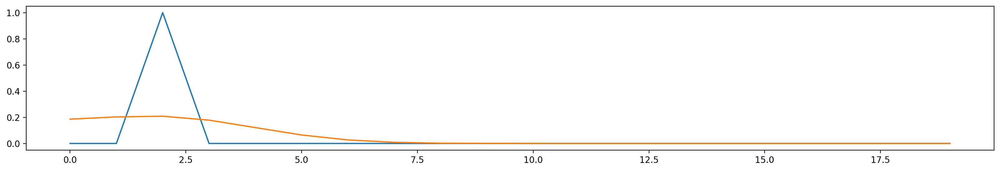

36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
H4010_P1_S08_trace_behav_aligned.csv S08
S08 Behaviour_imaged Push
Computing classification for Behaviour_imaged Push behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed


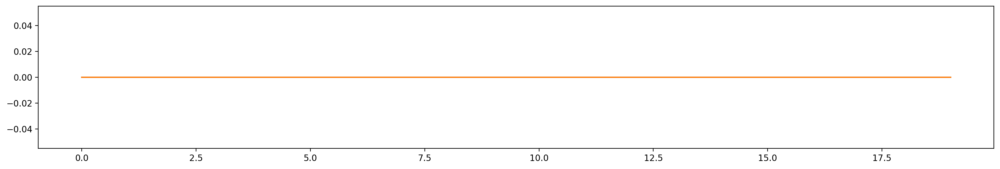

4 / 39  analysed
5 / 39  analysed
6 / 39  analysed


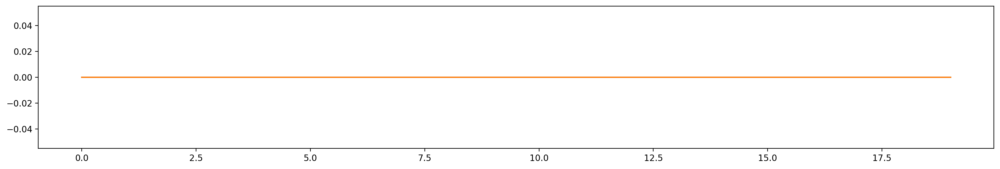

7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed


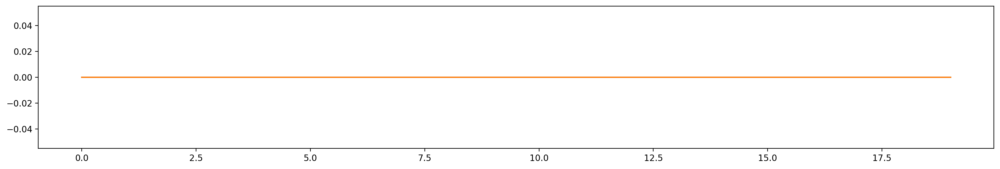

13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed


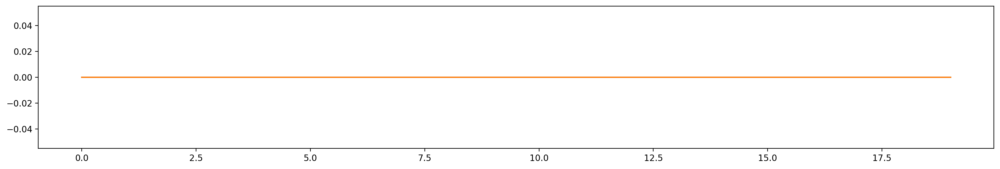

21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed
36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
S08 Behaviour_imaged Move Forward
Computing classification for Behaviour_imaged Move Forward behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39

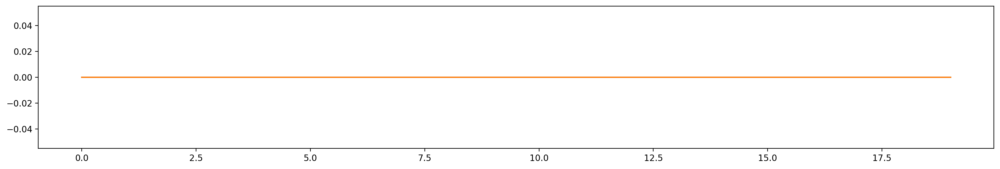

13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed
36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
S08 Behaviour_competitor Retreat
Computing classification for Behaviour_competitor Retreat behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed


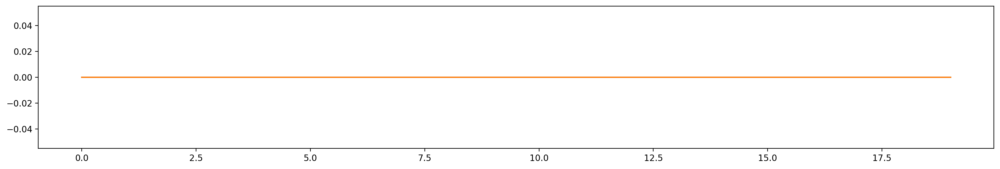

4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed


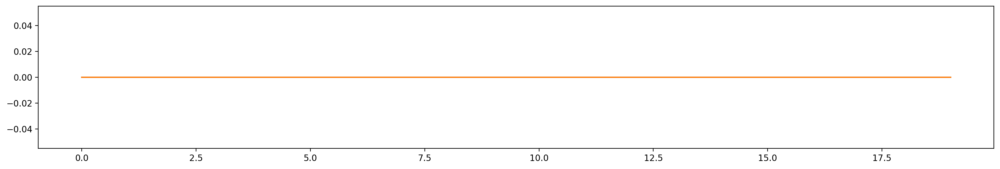

13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed


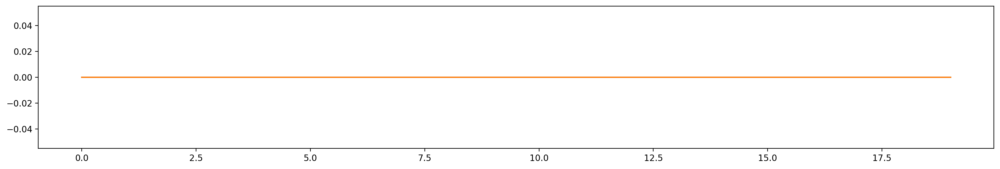

21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 / 39  analysed
33 / 39  analysed
34 / 39  analysed
35 / 39  analysed
36 / 39  analysed
37 / 39  analysed
38 / 39  analysed
S08 Behaviour_competitor Withdrawal
Computing classification for Behaviour_competitor Withdrawal behaviour
0 / 39  analysed
1 / 39  analysed
2 / 39  analysed
3 / 39  analysed
4 / 39  analysed
5 / 39  analysed
6 / 39  analysed
7 / 39  analysed
8 / 39  analysed
9 / 39  analysed
10 / 39  analysed
11 / 39  analysed
12 / 39  analysed
13 / 39  analysed
14 / 39  analysed
15 / 39  analysed
16 / 39  analysed
17 / 39  analysed
18 / 39  analysed
19 / 39  analysed
20 / 39  analysed
21 / 39  analysed
22 / 39  analysed
23 / 39  analysed
24 / 39  analysed
25 / 39  analysed
26 / 39  analysed
27 / 39  analysed
28 / 39  analysed
29 / 39  analysed
30 / 39  analysed
31 / 39  analysed
32 

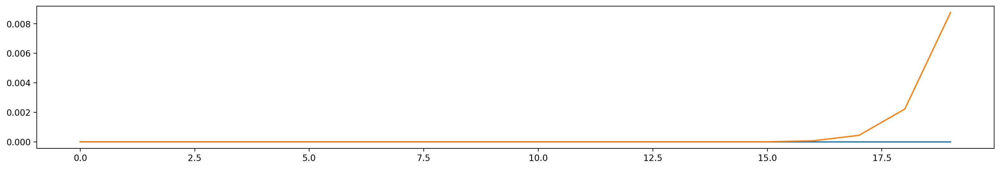

16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S03 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  anal

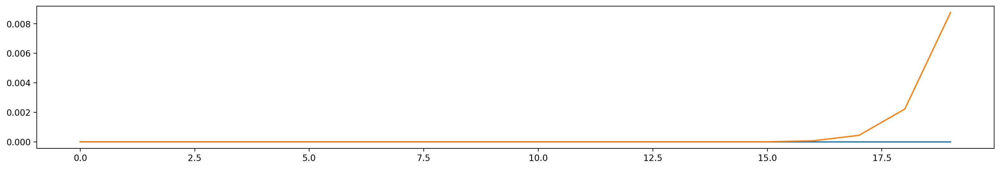

16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S03 Behaviour_competitor Resistance
Behaviour_competitor Resistance behaviour not exhibted
S03 Behaviour_competitor Retreat
Behaviour_competitor Retreat behaviour not exhibted
S03 Behaviour_competitor Withdrawal
Computing classification for Behaviour_competitor Withdrawal behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed


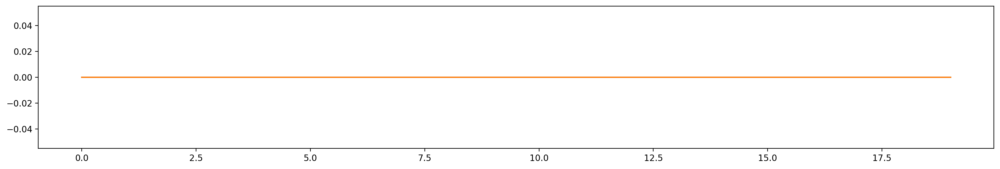

11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S07 Behaviour_imaged Resistance
Computing classification for Behaviour_imaged Resistance behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  a

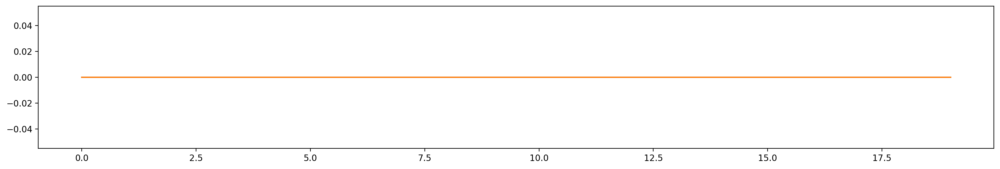

11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed


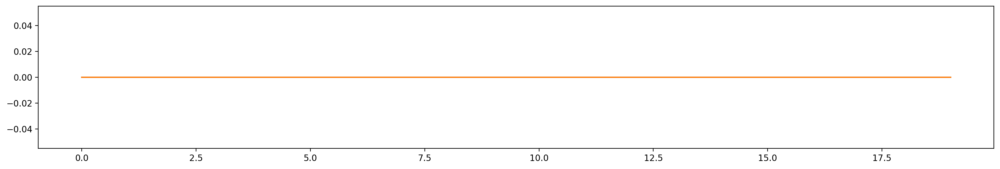

31 / 53  analysed


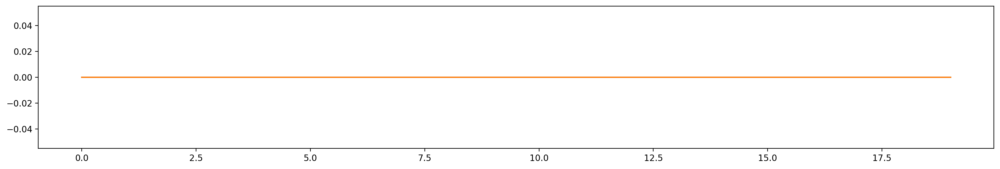

32 / 53  analysed
33 / 53  analysed


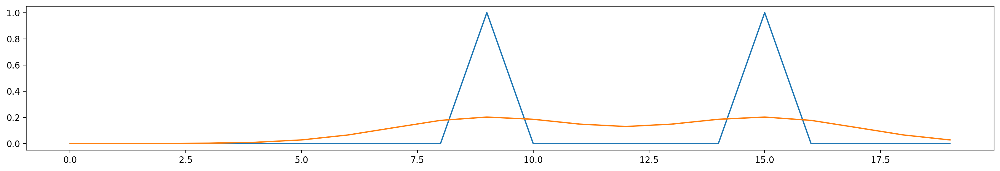

34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S07 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed


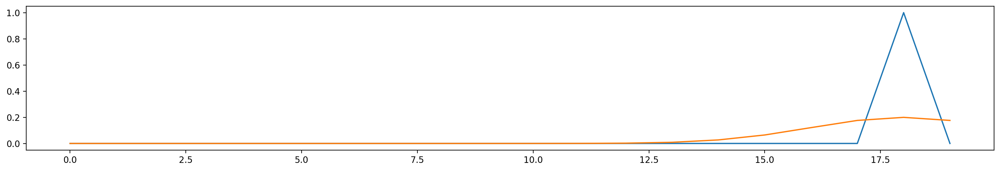

7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed


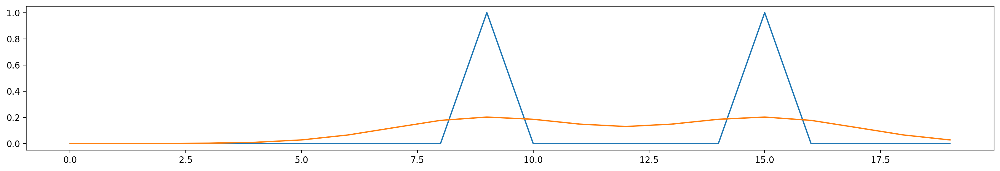

34 / 53  analysed


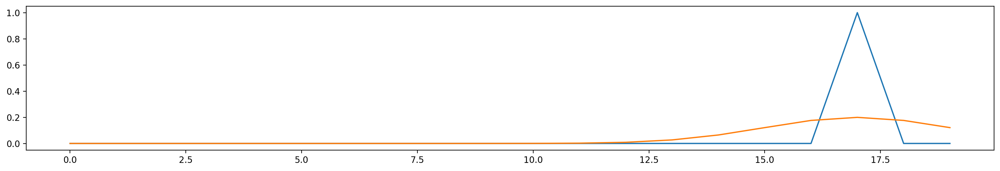

35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S07 Behaviour_competitor Push
Computing classification for Behaviour_competitor Push behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analys

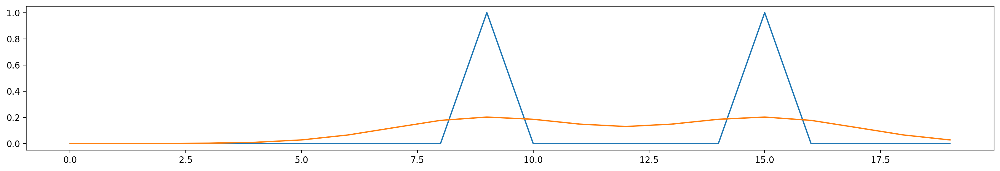

34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S07 Behaviour_competitor Move Forward
Computing classification for Behaviour_competitor Move Forward behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed

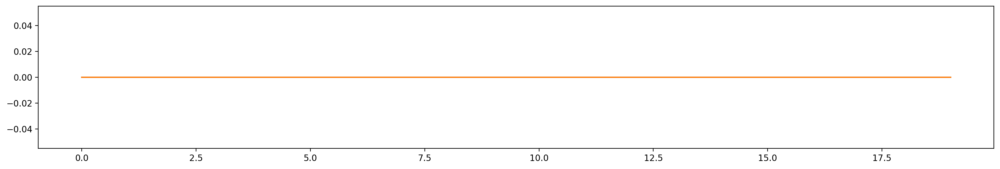

31 / 53  analysed


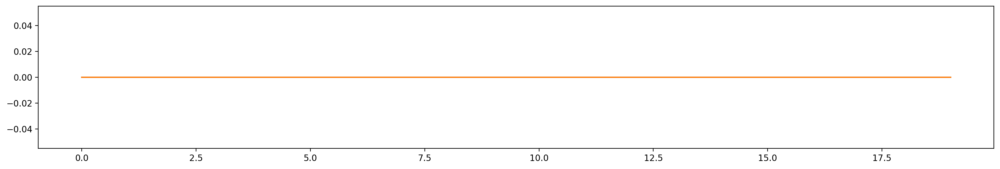

32 / 53  analysed
33 / 53  analysed


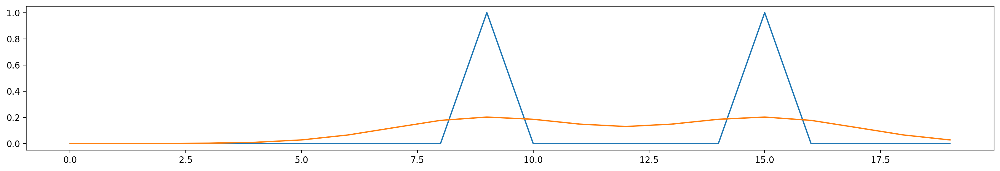

34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S07 Behaviour_competitor Resistance
Behaviour_competitor Resistance behaviour not exhibted
S07 Behaviour_competitor Retreat
Behaviour_competitor Retreat behaviour not exhibted
S07 Behaviour_competitor Withdrawal
Computing classification for Behaviour_competitor Withdrawal behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed


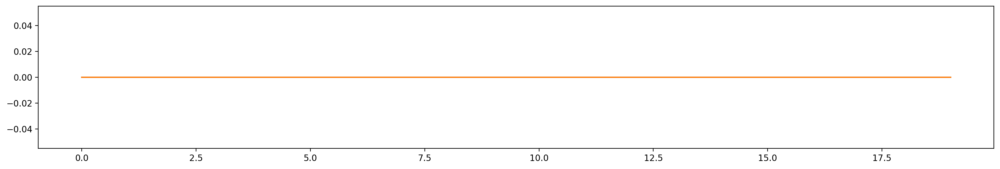

11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed


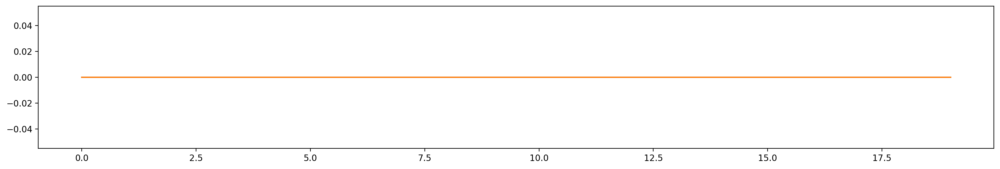

31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S07 Behaviour_competitor Stillness
Computing classification for Behaviour_competitor Stillness behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed


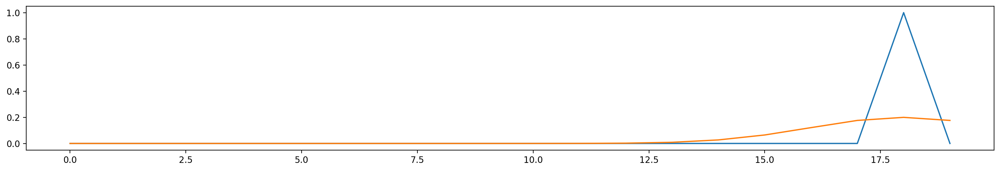

7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed


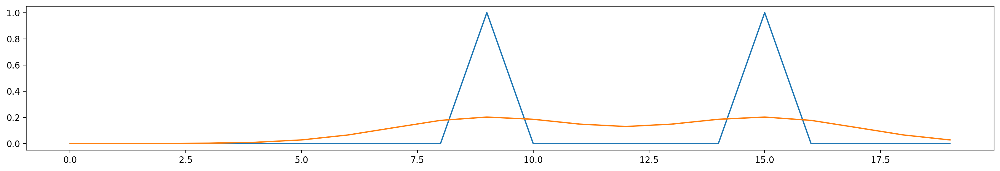

34 / 53  analysed


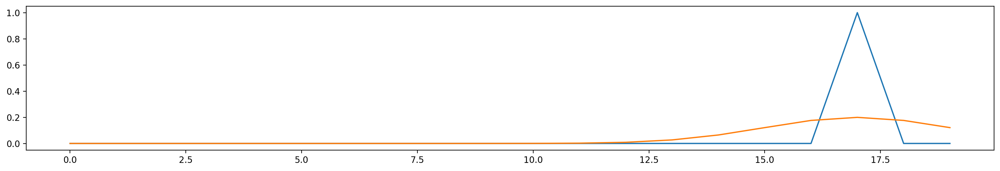

35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
H4015_P1_S13_trace_behav_aligned.csv S13
S13 Behaviour_imaged Push
Computing classification for Behaviour_imaged Push behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed


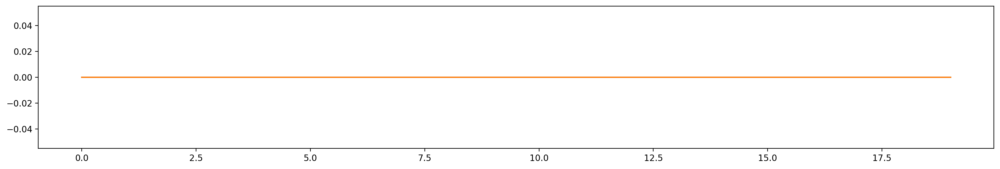

11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed


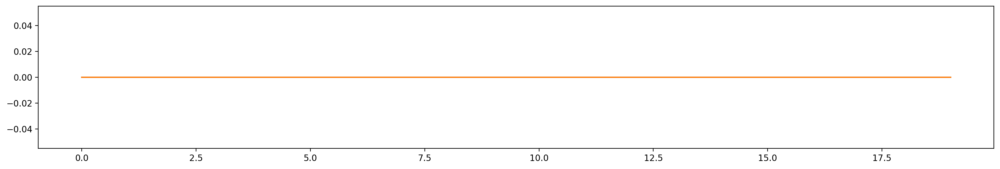

36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed


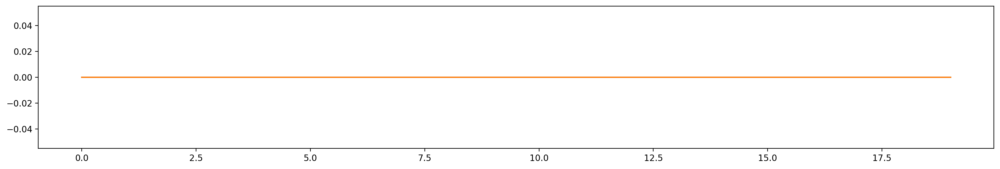

47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed


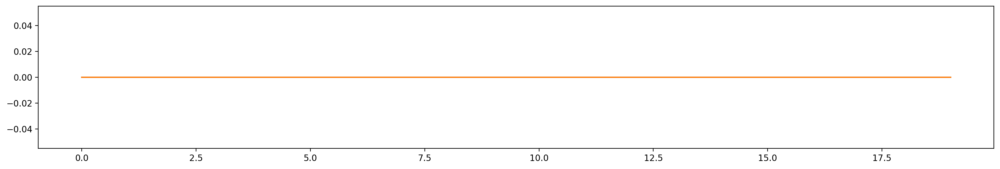

51 / 53  analysed
52 / 53  analysed
S13 Behaviour_imaged Move Forward
Behaviour_imaged Move Forward behaviour not exhibted
S13 Behaviour_imaged Resistance
Computing classification for Behaviour_imaged Resistance behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed


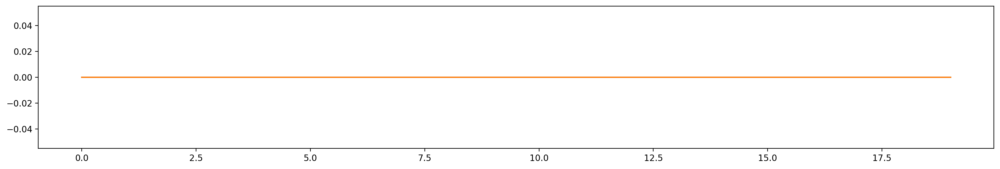

11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S13 Behaviour_imaged Retreat
Computing classification for Behaviour_imaged Retreat behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analyse

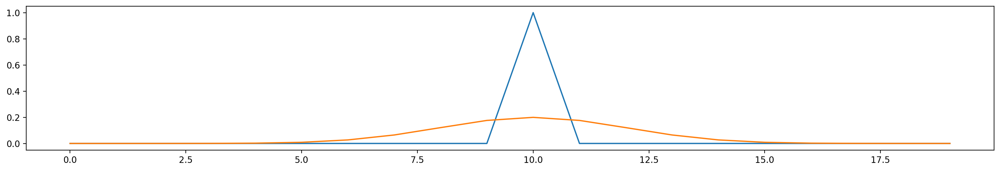

48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S13 Behaviour_imaged Withdrawal
Computing classification for Behaviour_imaged Withdrawal behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed


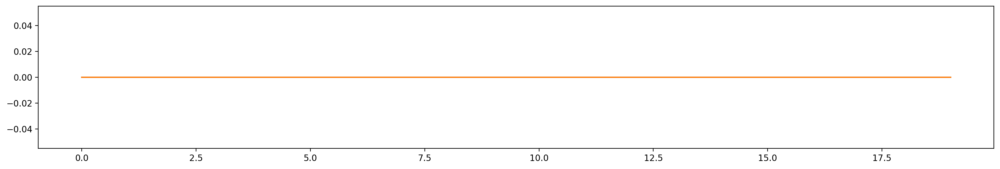

11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S13 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  ana

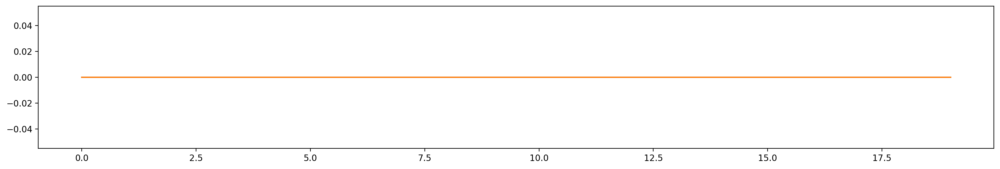

11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed


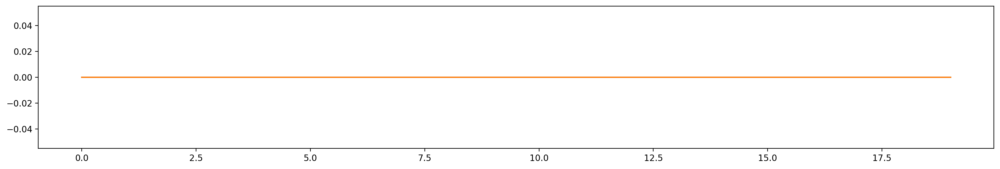

36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S13 Behaviour_competitor Push
Computing classification for Behaviour_competitor Push behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed


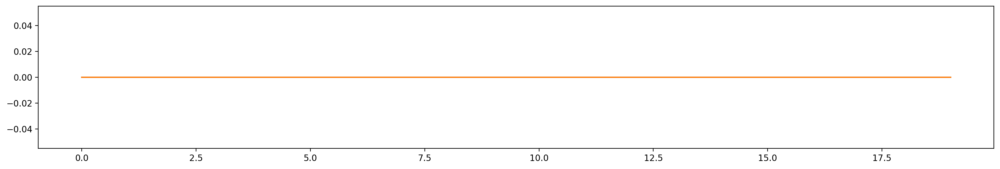

11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S13 Behaviour_competitor Move Forward
Computing classification for Behaviour_competitor Move Forward behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analys

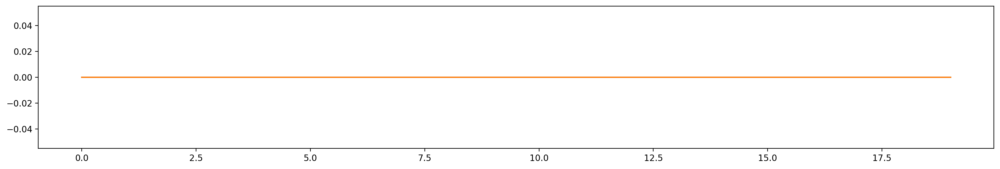

11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed


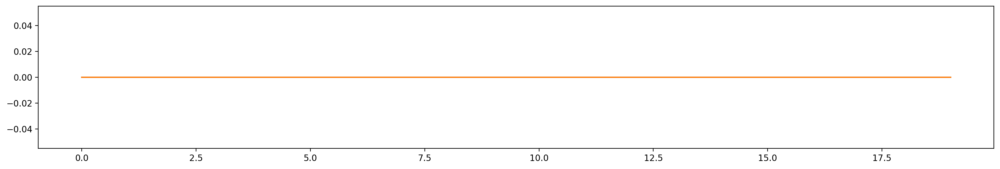

36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S13 Behaviour_competitor Retreat
Behaviour_competitor Retreat behaviour not exhibted
S13 Behaviour_competitor Withdrawal
Computing classification for Behaviour_competitor Withdrawal behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed


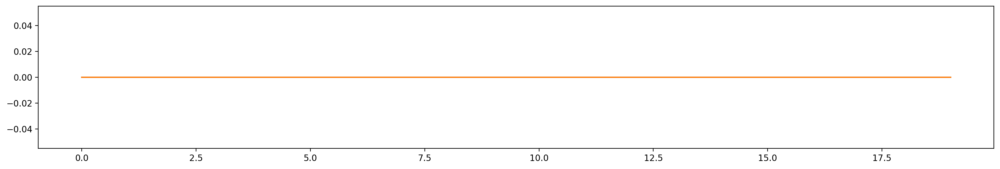

11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S13 Behaviour_competitor Stillness
Computing classification for Behaviour_competitor Stillness behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 /

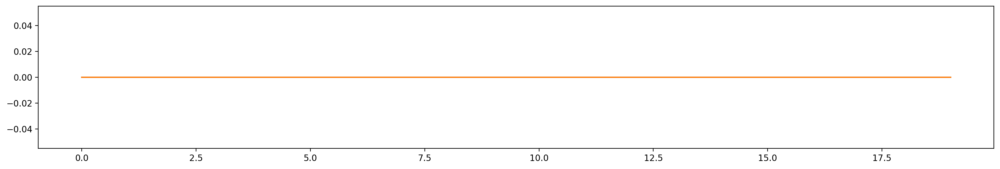

11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
H4015_P1_S09_trace_behav_aligned.csv S09
S09 Behaviour_imaged Push
Behaviour_imaged Push behaviour not exhibted
S09 Behaviour_imaged Move Forward
Behaviour_imaged Move Forward behaviour not exhibted
S09 Behaviour_imaged Resistance
Computing cla

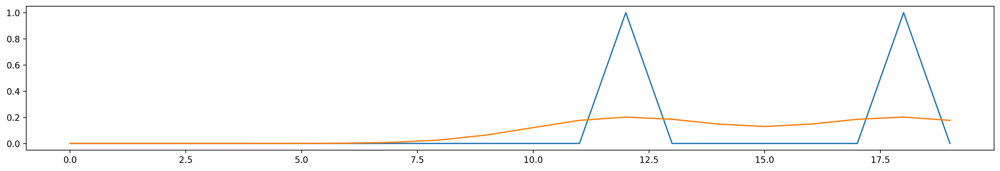

27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed


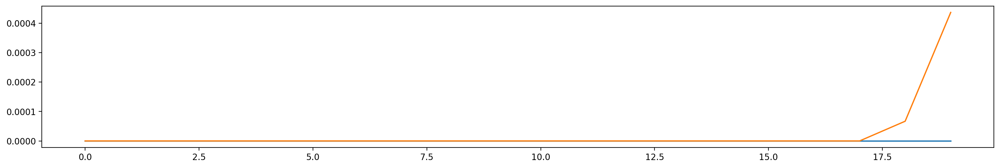

44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S09 Behaviour_imaged Retreat
Computing classification for Behaviour_imaged Retreat behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed


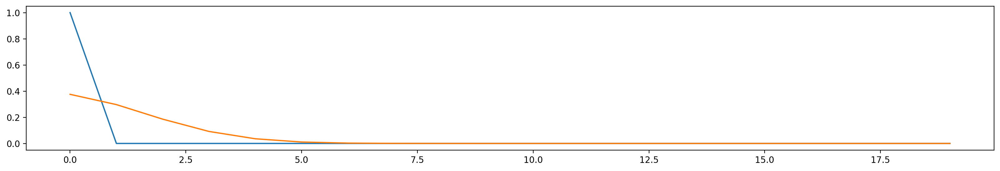

11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed


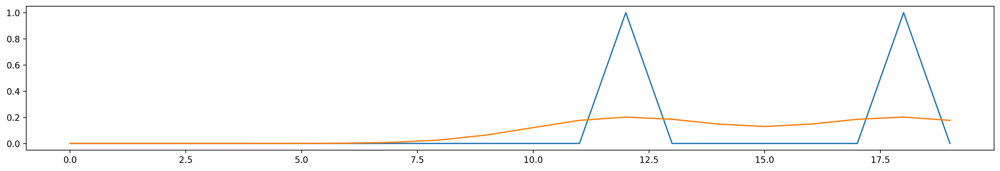

27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed


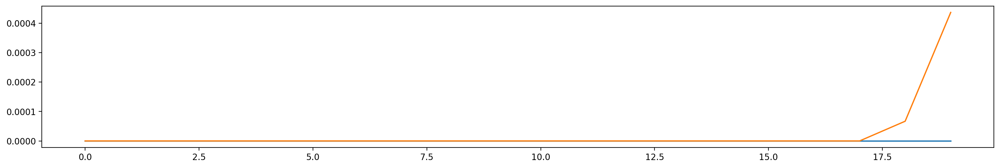

44 / 53  analysed


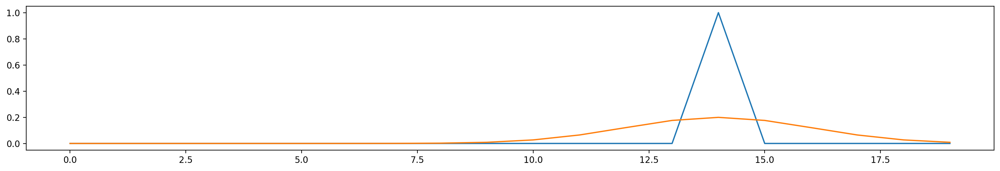

45 / 53  analysed
46 / 53  analysed


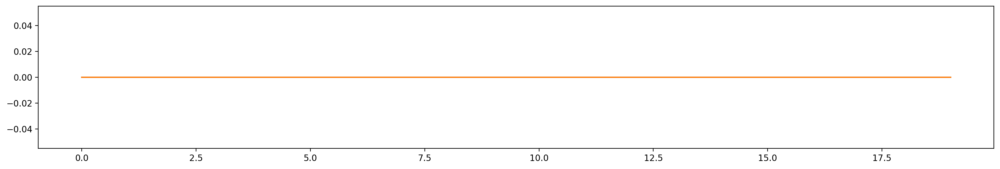

47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S09 Behaviour_imaged Withdrawal
Computing classification for Behaviour_imaged Withdrawal behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  an

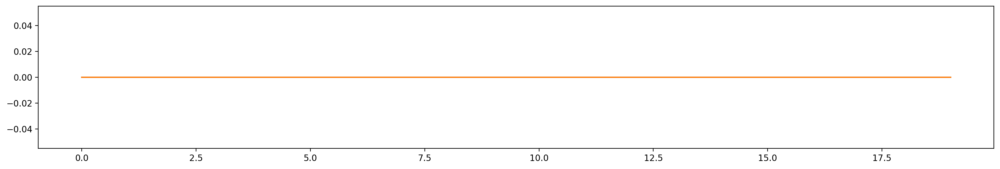

46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S09 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed


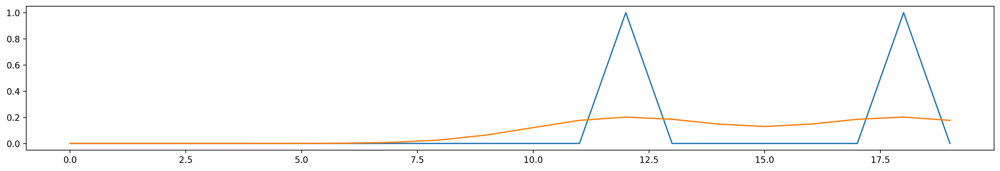

27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed


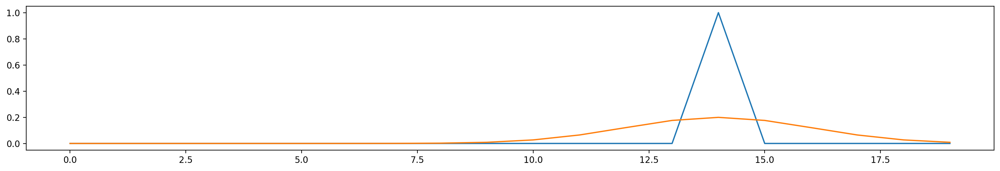

45 / 53  analysed


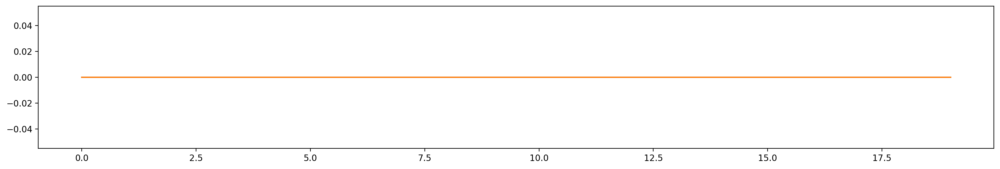

46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S09 Behaviour_competitor Push
Computing classification for Behaviour_competitor Push behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analys

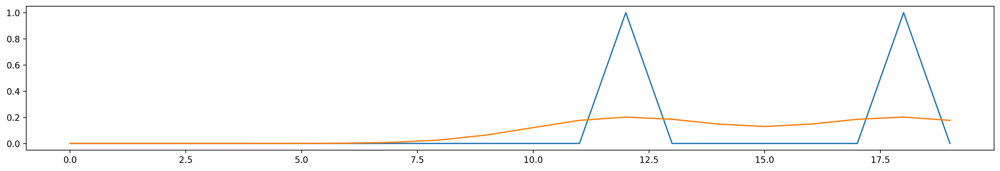

27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
H4015_P1_S11_trace_behav_aligned.csv S11
S11 Behaviour_imaged Push
Computing classification for Behaviour_imaged Push behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed


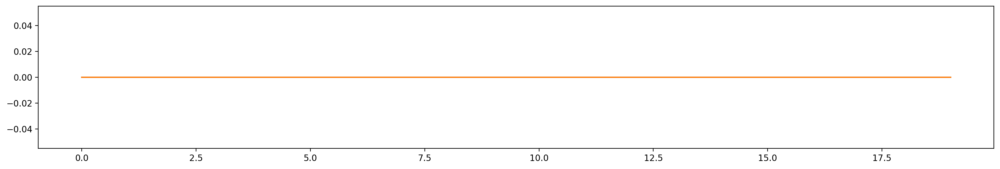

12 / 53  analysed
13 / 53  analysed
14 / 53  analysed


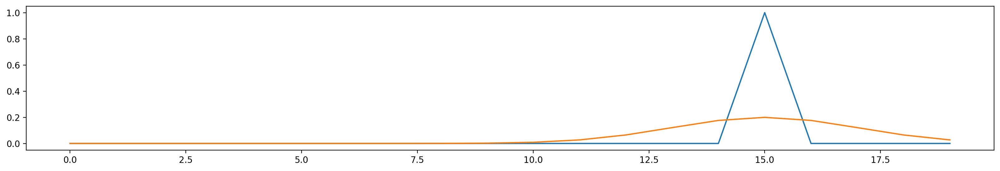

15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed


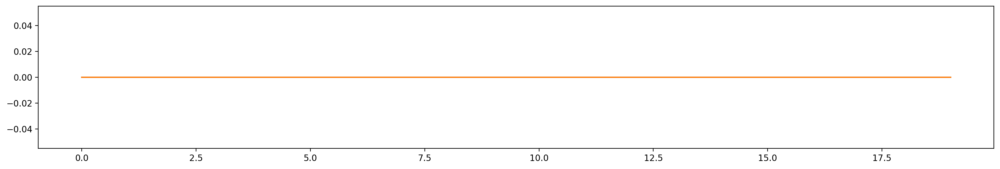

52 / 53  analysed
S11 Behaviour_imaged Move Forward
Computing classification for Behaviour_imaged Move Forward behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53

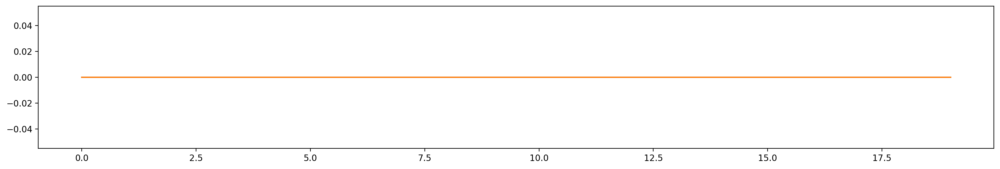

48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed


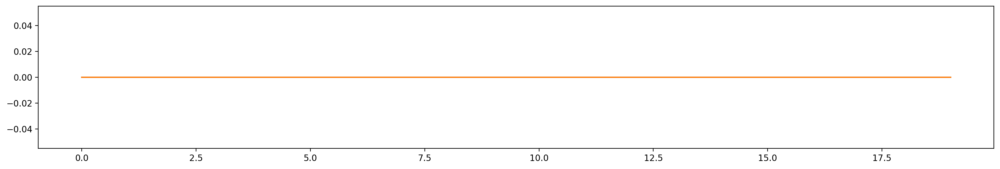

52 / 53  analysed
S11 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed


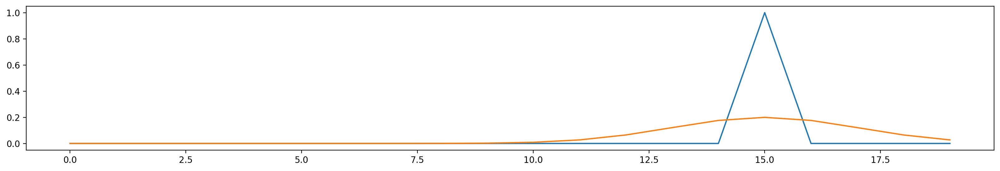

15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed


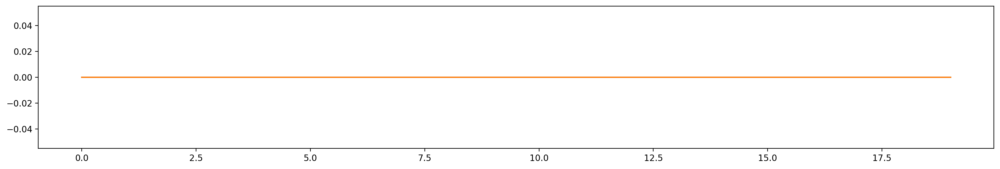

52 / 53  analysed
S11 Behaviour_competitor Push
Computing classification for Behaviour_competitor Push behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analys

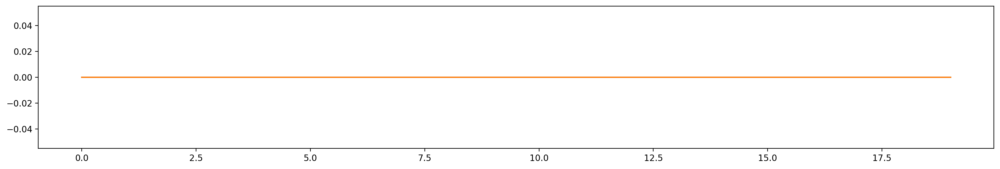

52 / 53  analysed
S11 Behaviour_competitor Move Forward
Computing classification for Behaviour_competitor Move Forward behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed

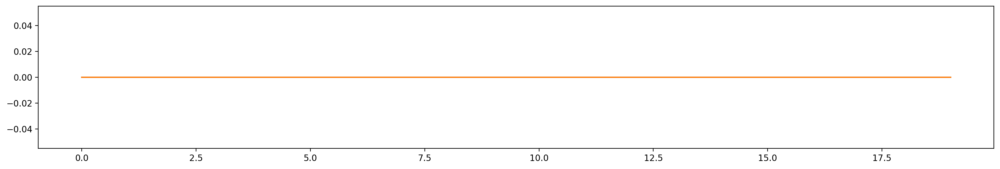

52 / 53  analysed
S11 Behaviour_competitor Resistance
Computing classification for Behaviour_competitor Resistance behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed


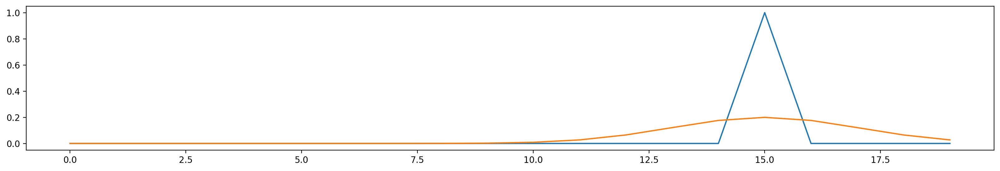

15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed


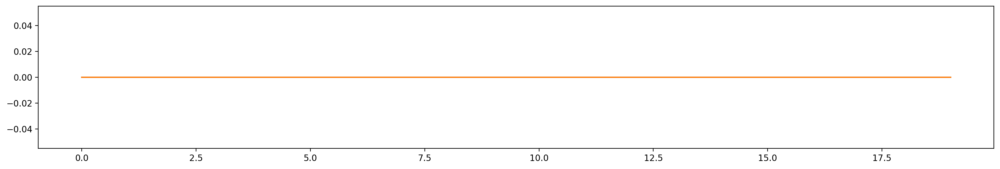

52 / 53  analysed
S11 Behaviour_competitor Retreat
Computing classification for Behaviour_competitor Retreat behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed


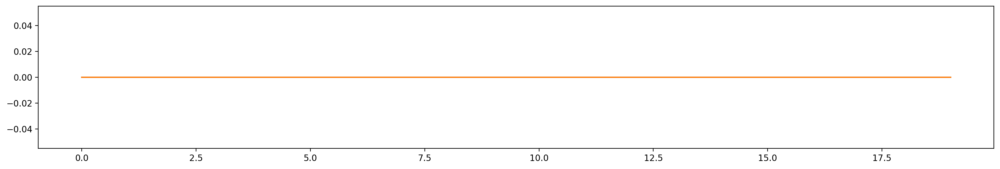

12 / 53  analysed
13 / 53  analysed
14 / 53  analysed


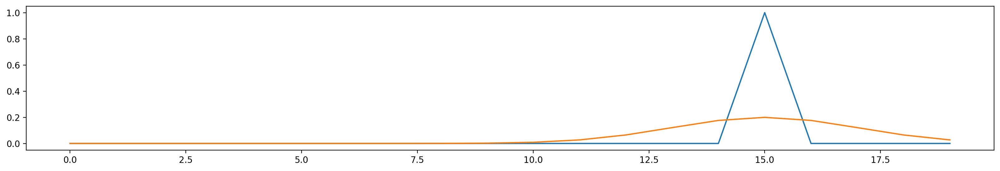

15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed


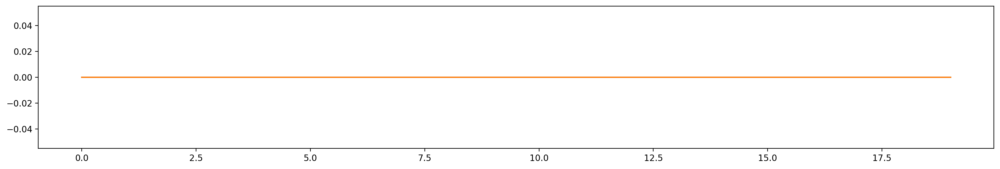

52 / 53  analysed
S11 Behaviour_competitor Withdrawal
Computing classification for Behaviour_competitor Withdrawal behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 

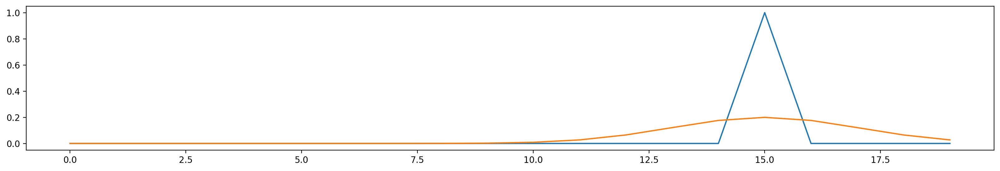

15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed


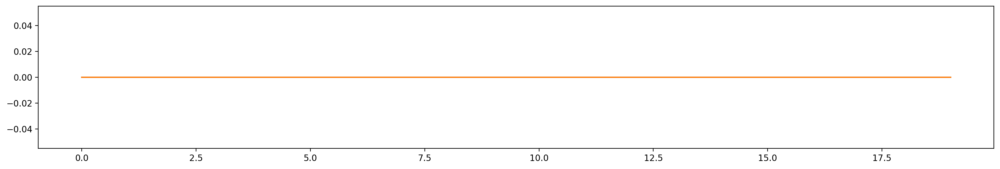

48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed


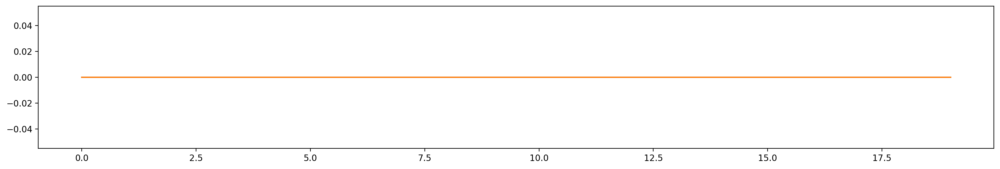

52 / 53  analysed
H4015_P1_S01_trace_behav_aligned.csv S01
S01 Behaviour_imaged Push
Behaviour_imaged Push behaviour not exhibted
S01 Behaviour_imaged Move Forward
Behaviour_imaged Move Forward behaviour not exhibted
S01 Behaviour_imaged Resistance
Computing classification for Behaviour_imaged Resistance behaviour
0 / 53  analysed
1 / 53  analysed


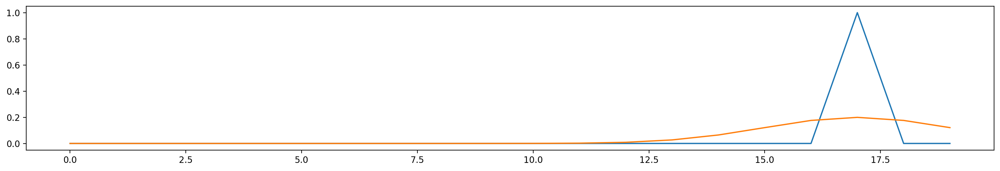

2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed


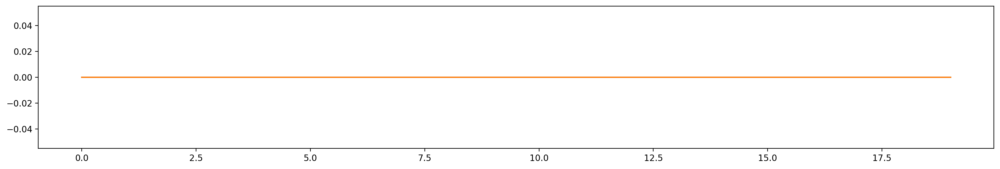

12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S01 Behaviour_imaged Retreat
Computing classification for Behaviour_imaged Retreat behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed

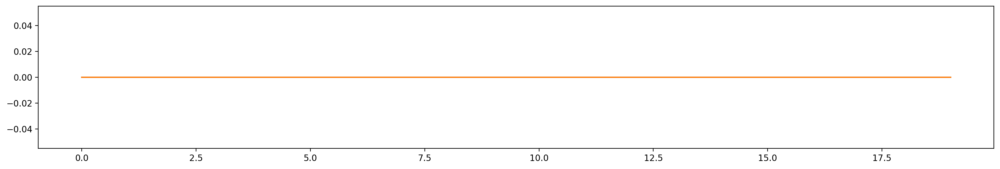

12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S01 Behaviour_imaged Withdrawal
Behaviour_imaged Withdrawal behaviour not exhibted
S01 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analys

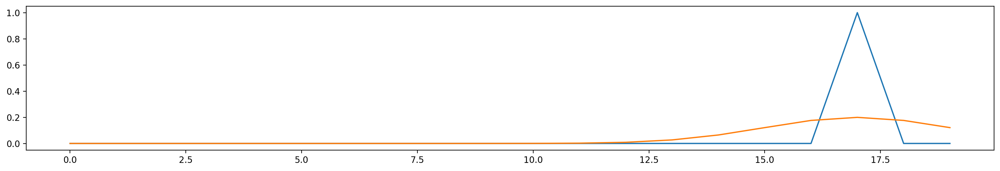

2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed


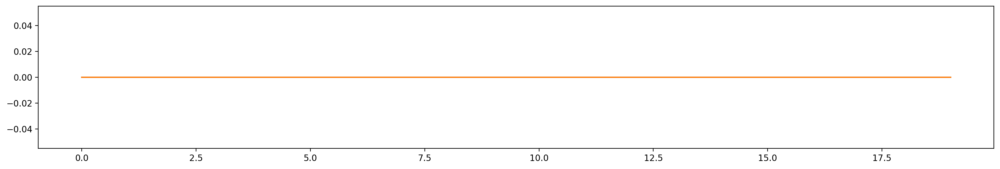

12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed
27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S01 Behaviour_competitor Move Forward
Computing classification for Behaviour_competitor Move Forward behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analyse

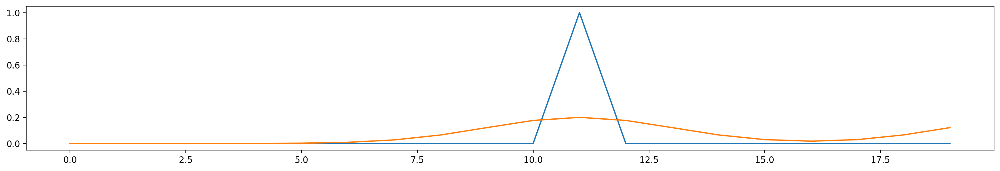

27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S05 Behaviour_imaged Withdrawal
Computing classification for Behaviour_imaged Withdrawal behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed


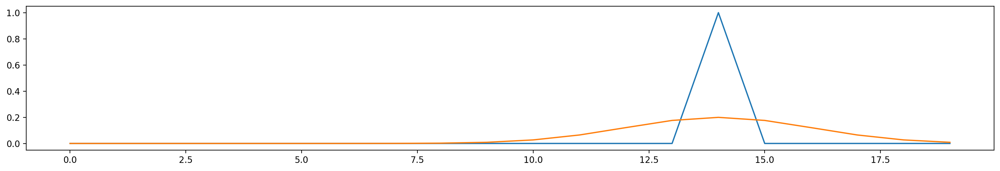

23 / 53  analysed
24 / 53  analysed
25 / 53  analysed
26 / 53  analysed


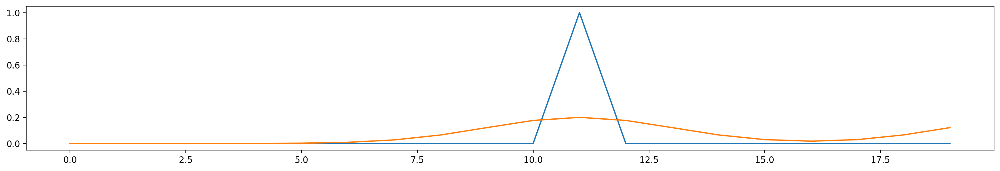

27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S05 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  anal

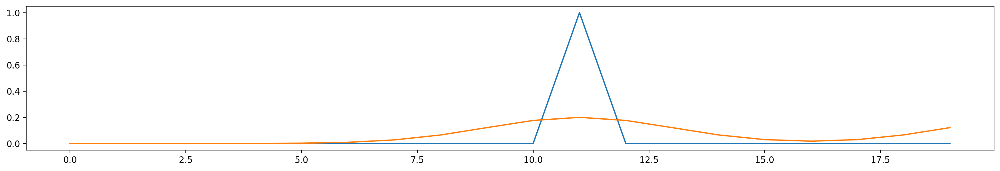

27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S05 Behaviour_competitor Push
Computing classification for Behaviour_competitor Push behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 53  analys

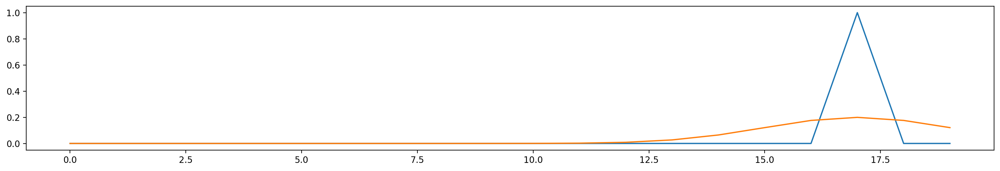

25 / 53  analysed
26 / 53  analysed


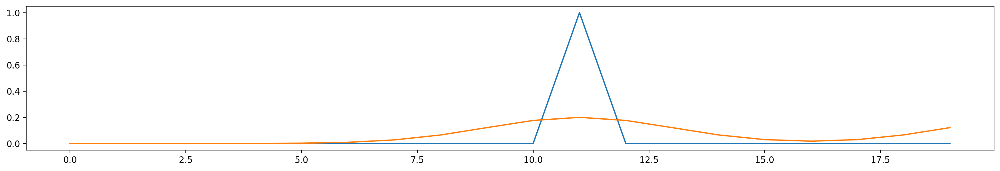

27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S05 Behaviour_competitor Move Forward
Computing classification for Behaviour_competitor Move Forward behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed

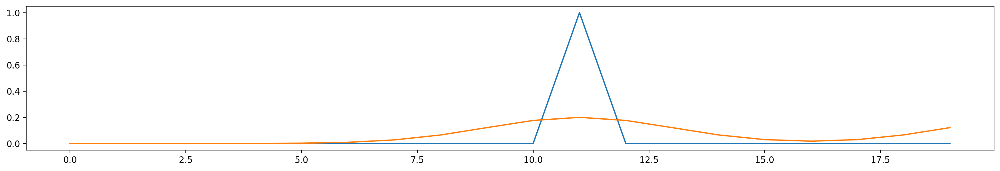

27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S05 Behaviour_competitor Resistance
Behaviour_competitor Resistance behaviour not exhibted
S05 Behaviour_competitor Retreat
Behaviour_competitor Retreat behaviour not exhibted
S05 Behaviour_competitor Withdrawal
Computing classification for Behaviour_competitor Withdrawal behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53

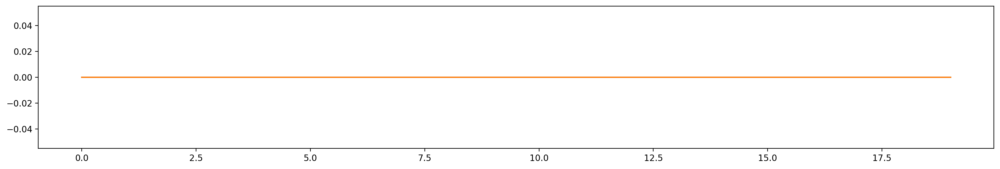

24 / 53  analysed
25 / 53  analysed


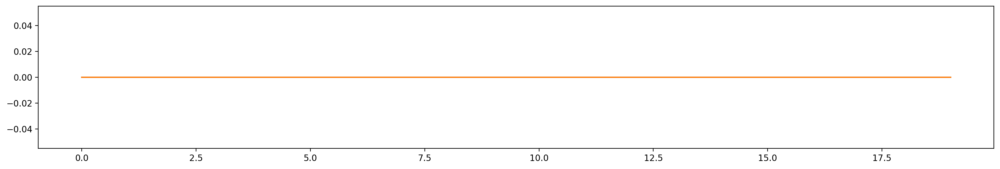

26 / 53  analysed


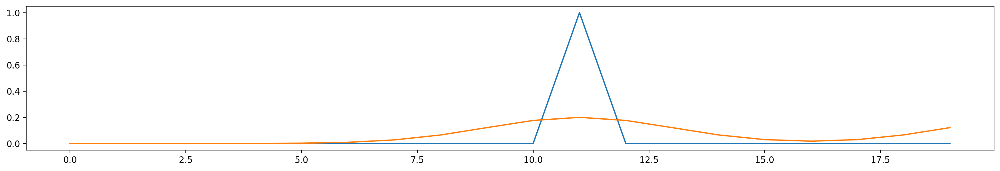

27 / 53  analysed
28 / 53  analysed
29 / 53  analysed
30 / 53  analysed
31 / 53  analysed
32 / 53  analysed
33 / 53  analysed
34 / 53  analysed
35 / 53  analysed
36 / 53  analysed
37 / 53  analysed
38 / 53  analysed
39 / 53  analysed
40 / 53  analysed
41 / 53  analysed
42 / 53  analysed
43 / 53  analysed
44 / 53  analysed
45 / 53  analysed
46 / 53  analysed
47 / 53  analysed
48 / 53  analysed
49 / 53  analysed
50 / 53  analysed
51 / 53  analysed
52 / 53  analysed
S05 Behaviour_competitor Stillness
Computing classification for Behaviour_competitor Stillness behaviour
0 / 53  analysed
1 / 53  analysed
2 / 53  analysed
3 / 53  analysed
4 / 53  analysed
5 / 53  analysed
6 / 53  analysed
7 / 53  analysed
8 / 53  analysed
9 / 53  analysed
10 / 53  analysed
11 / 53  analysed
12 / 53  analysed
13 / 53  analysed
14 / 53  analysed
15 / 53  analysed
16 / 53  analysed
17 / 53  analysed
18 / 53  analysed
19 / 53  analysed
20 / 53  analysed
21 / 53  analysed
22 / 53  analysed
23 / 53  analysed
24 / 

7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
S01 Behaviour_imaged Retreat
Computing classification for Behaviour_imaged Retreat behaviour
0 / 10  analysed
1 / 10  analysed
2 / 10  analysed
3 / 10  analysed
4 / 10  analysed
5 / 10  analysed
6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
S01 Behaviour_imaged Withdrawal
Computing classification for Behaviour_imaged Withdrawal behaviour
0 / 10  analysed


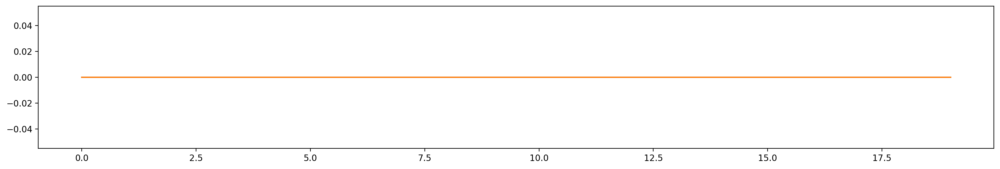

1 / 10  analysed
2 / 10  analysed


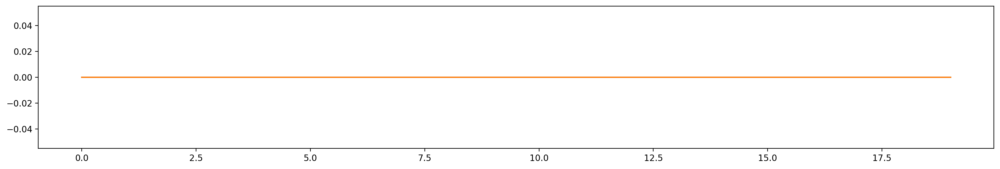

3 / 10  analysed
4 / 10  analysed
5 / 10  analysed
6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
S01 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 10  analysed
1 / 10  analysed
2 / 10  analysed
3 / 10  analysed
4 / 10  analysed
5 / 10  analysed
6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
S01 Behaviour_competitor Push
Computing classification for Behaviour_competitor Push behaviour
0 / 10  analysed
1 / 10  analysed
2 / 10  analysed
3 / 10  analysed
4 / 10  analysed
5 / 10  analysed
6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
S01 Behaviour_competitor Move Forward
Computing classification for Behaviour_competitor Move Forward behaviour
0 / 10  analysed
1 / 10  analysed
2 / 10  analysed


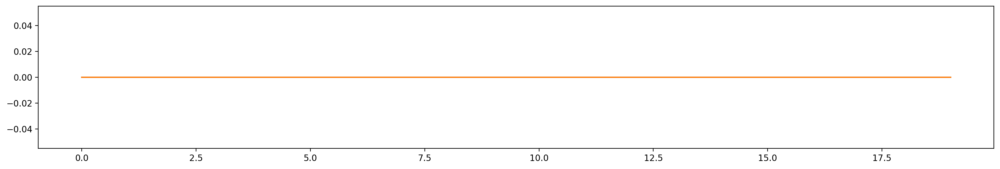

3 / 10  analysed
4 / 10  analysed
5 / 10  analysed
6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
S01 Behaviour_competitor Resistance
Behaviour_competitor Resistance behaviour not exhibted
S01 Behaviour_competitor Retreat
Behaviour_competitor Retreat behaviour not exhibted
S01 Behaviour_competitor Withdrawal
Computing classification for Behaviour_competitor Withdrawal behaviour
0 / 10  analysed


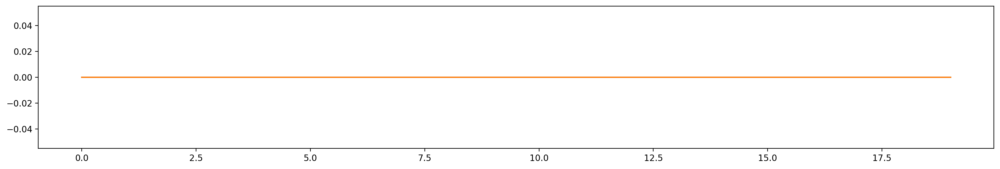

1 / 10  analysed
2 / 10  analysed
3 / 10  analysed
4 / 10  analysed
5 / 10  analysed
6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
S01 Behaviour_competitor Stillness
Computing classification for Behaviour_competitor Stillness behaviour
0 / 10  analysed
1 / 10  analysed
2 / 10  analysed
3 / 10  analysed
4 / 10  analysed
5 / 10  analysed
6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
H4017_P1_S05_trace_behav_aligned.csv S05
S05 Behaviour_imaged Push
Computing classification for Behaviour_imaged Push behaviour
0 / 10  analysed
1 / 10  analysed
2 / 10  analysed
3 / 10  analysed
4 / 10  analysed
5 / 10  analysed
6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
S05 Behaviour_imaged Move Forward
Behaviour_imaged Move Forward behaviour not exhibted
S05 Behaviour_imaged Resistance
Computing classification for Behaviour_imaged Resistance behaviour
0 / 10  analysed
1 / 10  analysed
2 / 10  analysed
3 / 10  analysed
4 / 10  analysed
5 /

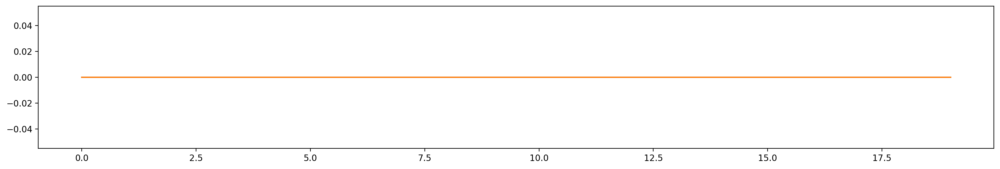

1 / 10  analysed
2 / 10  analysed
3 / 10  analysed
4 / 10  analysed
5 / 10  analysed
6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
S10 Behaviour_imaged Withdrawal
Computing classification for Behaviour_imaged Withdrawal behaviour
0 / 10  analysed


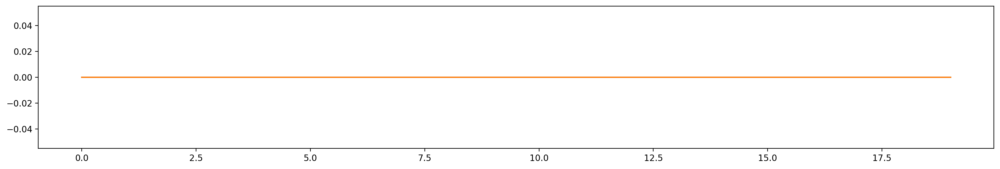

1 / 10  analysed
2 / 10  analysed
3 / 10  analysed
4 / 10  analysed
5 / 10  analysed
6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
S10 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 10  analysed
1 / 10  analysed
2 / 10  analysed
3 / 10  analysed
4 / 10  analysed
5 / 10  analysed
6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
S10 Behaviour_competitor Push
Computing classification for Behaviour_competitor Push behaviour
0 / 10  analysed


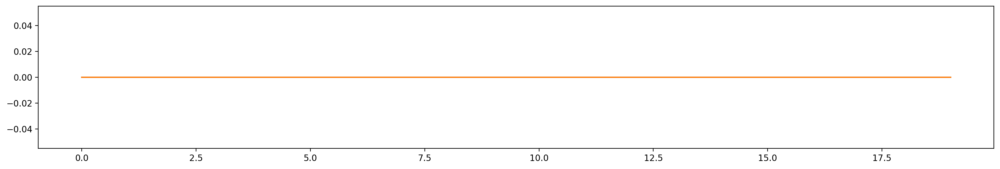

1 / 10  analysed
2 / 10  analysed
3 / 10  analysed
4 / 10  analysed
5 / 10  analysed
6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
S10 Behaviour_competitor Move Forward
Computing classification for Behaviour_competitor Move Forward behaviour
0 / 10  analysed


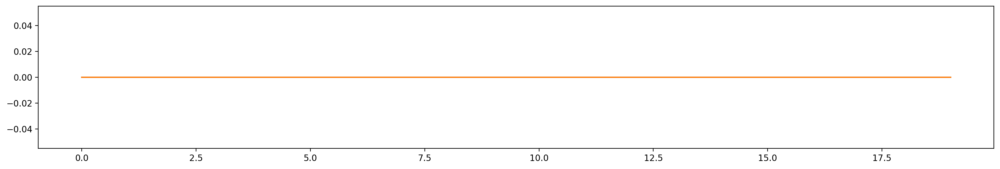

1 / 10  analysed
2 / 10  analysed
3 / 10  analysed
4 / 10  analysed
5 / 10  analysed
6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
S10 Behaviour_competitor Resistance
Behaviour_competitor Resistance behaviour not exhibted
S10 Behaviour_competitor Retreat
Behaviour_competitor Retreat behaviour not exhibted
S10 Behaviour_competitor Withdrawal
Behaviour_competitor Withdrawal behaviour not exhibted
S10 Behaviour_competitor Stillness
Computing classification for Behaviour_competitor Stillness behaviour
0 / 10  analysed


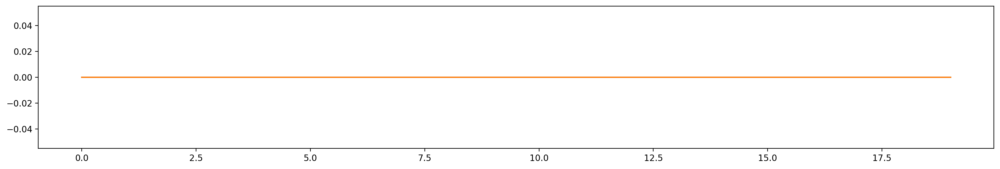

1 / 10  analysed
2 / 10  analysed
3 / 10  analysed
4 / 10  analysed
5 / 10  analysed
6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
H4017_P1_S07_trace_behav_aligned.csv S07
S07 Behaviour_imaged Push
Behaviour_imaged Push behaviour not exhibted
S07 Behaviour_imaged Move Forward
Behaviour_imaged Move Forward behaviour not exhibted
S07 Behaviour_imaged Resistance
Behaviour_imaged Resistance behaviour not exhibted
S07 Behaviour_imaged Retreat
Computing classification for Behaviour_imaged Retreat behaviour
0 / 10  analysed


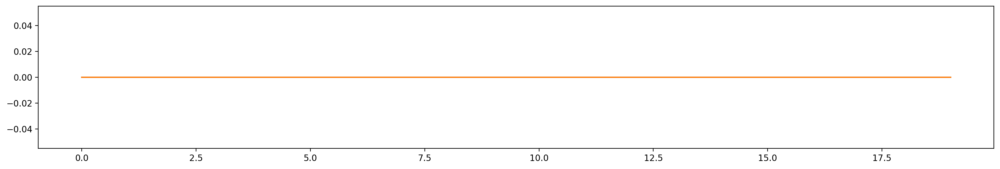

1 / 10  analysed
2 / 10  analysed
3 / 10  analysed
4 / 10  analysed
5 / 10  analysed
6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
S07 Behaviour_imaged Withdrawal
Behaviour_imaged Withdrawal behaviour not exhibted
S07 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 10  analysed
1 / 10  analysed
2 / 10  analysed
3 / 10  analysed
4 / 10  analysed
5 / 10  analysed
6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
S07 Behaviour_competitor Push
Computing classification for Behaviour_competitor Push behaviour
0 / 10  analysed


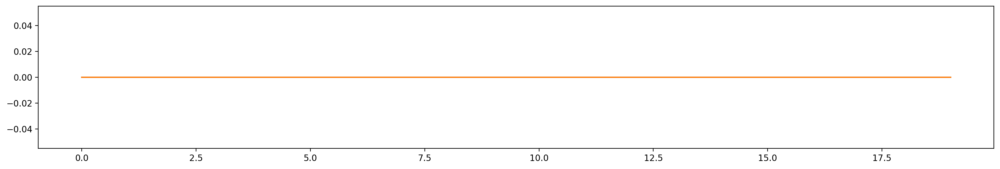

1 / 10  analysed
2 / 10  analysed
3 / 10  analysed
4 / 10  analysed
5 / 10  analysed
6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
S07 Behaviour_competitor Move Forward
Behaviour_competitor Move Forward behaviour not exhibted
S07 Behaviour_competitor Resistance
Behaviour_competitor Resistance behaviour not exhibted
S07 Behaviour_competitor Retreat
Behaviour_competitor Retreat behaviour not exhibted
S07 Behaviour_competitor Withdrawal
Behaviour_competitor Withdrawal behaviour not exhibted
S07 Behaviour_competitor Stillness
Computing classification for Behaviour_competitor Stillness behaviour
0 / 10  analysed
1 / 10  analysed
2 / 10  analysed
3 / 10  analysed
4 / 10  analysed
5 / 10  analysed
6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
H4017_P1_S08_trace_behav_aligned.csv S08
S08 Behaviour_imaged Push
Behaviour_imaged Push behaviour not exhibted
S08 Behaviour_imaged Move Forward
Behaviour_imaged Move Forward behaviour not exhibted
S08 Behavio

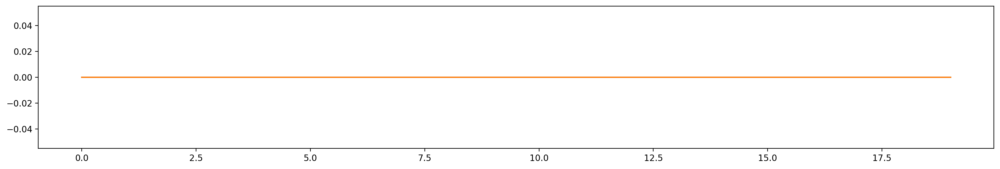

6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
S08 Behaviour_competitor Resistance
Behaviour_competitor Resistance behaviour not exhibted
S08 Behaviour_competitor Retreat
Behaviour_competitor Retreat behaviour not exhibted
S08 Behaviour_competitor Withdrawal
Behaviour_competitor Withdrawal behaviour not exhibted
S08 Behaviour_competitor Stillness
Computing classification for Behaviour_competitor Stillness behaviour
0 / 10  analysed
1 / 10  analysed
2 / 10  analysed
3 / 10  analysed
4 / 10  analysed
5 / 10  analysed
6 / 10  analysed
7 / 10  analysed
8 / 10  analysed
9 / 10  analysed
H4017_P1_S04_trace_behav_aligned.csv S04
S04 Behaviour_imaged Push
Behaviour_imaged Push behaviour not exhibted
S04 Behaviour_imaged Move Forward
Behaviour_imaged Move Forward behaviour not exhibted
S04 Behaviour_imaged Resistance
Computing classification for Behaviour_imaged Resistance behaviour
0 / 10  analysed
1 / 10  analysed
2 / 10  analysed
3 / 10  analysed
4 / 10  analysed
5 / 10 

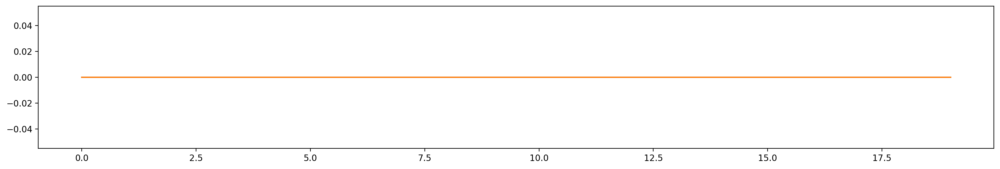

68 / 97  analysed
69 / 97  analysed
70 / 97  analysed
71 / 97  analysed
72 / 97  analysed
73 / 97  analysed
74 / 97  analysed
75 / 97  analysed
76 / 97  analysed
77 / 97  analysed
78 / 97  analysed
79 / 97  analysed
80 / 97  analysed
81 / 97  analysed
82 / 97  analysed
83 / 97  analysed
84 / 97  analysed
85 / 97  analysed
86 / 97  analysed
87 / 97  analysed
88 / 97  analysed
89 / 97  analysed
90 / 97  analysed
91 / 97  analysed
92 / 97  analysed
93 / 97  analysed
94 / 97  analysed
95 / 97  analysed
96 / 97  analysed
S03 Behaviour_imaged Resistance
Computing classification for Behaviour_imaged Resistance behaviour
0 / 97  analysed
1 / 97  analysed
2 / 97  analysed
3 / 97  analysed
4 / 97  analysed
5 / 97  analysed
6 / 97  analysed
7 / 97  analysed
8 / 97  analysed
9 / 97  analysed
10 / 97  analysed
11 / 97  analysed
12 / 97  analysed
13 / 97  analysed
14 / 97  analysed
15 / 97  analysed
16 / 97  analysed
17 / 97  analysed
18 / 97  analysed
19 / 97  analysed
20 / 97  analysed
21 / 97  an

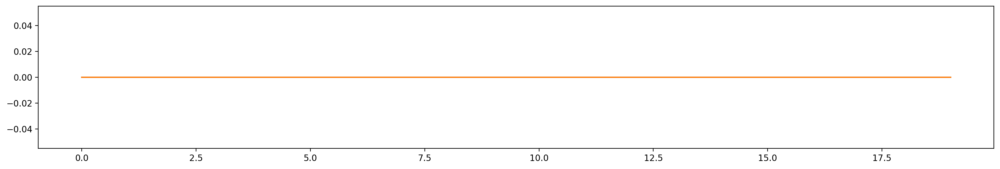

49 / 97  analysed
50 / 97  analysed
51 / 97  analysed
52 / 97  analysed
53 / 97  analysed
54 / 97  analysed
55 / 97  analysed
56 / 97  analysed
57 / 97  analysed
58 / 97  analysed
59 / 97  analysed
60 / 97  analysed
61 / 97  analysed


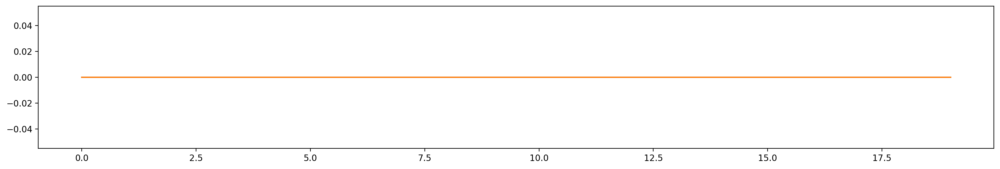

62 / 97  analysed
63 / 97  analysed
64 / 97  analysed
65 / 97  analysed
66 / 97  analysed
67 / 97  analysed
68 / 97  analysed
69 / 97  analysed
70 / 97  analysed
71 / 97  analysed
72 / 97  analysed
73 / 97  analysed
74 / 97  analysed
75 / 97  analysed
76 / 97  analysed
77 / 97  analysed
78 / 97  analysed
79 / 97  analysed
80 / 97  analysed
81 / 97  analysed
82 / 97  analysed
83 / 97  analysed
84 / 97  analysed
85 / 97  analysed
86 / 97  analysed
87 / 97  analysed
88 / 97  analysed
89 / 97  analysed
90 / 97  analysed
91 / 97  analysed
92 / 97  analysed
93 / 97  analysed
94 / 97  analysed
95 / 97  analysed
96 / 97  analysed
S03 Behaviour_imaged Stillness
Computing classification for Behaviour_imaged Stillness behaviour
0 / 97  analysed
1 / 97  analysed
2 / 97  analysed
3 / 97  analysed
4 / 97  analysed
5 / 97  analysed
6 / 97  analysed
7 / 97  analysed
8 / 97  analysed
9 / 97  analysed
10 / 97  analysed
11 / 97  analysed
12 / 97  analysed
13 / 97  analysed
14 / 97  analysed
15 / 97  anal

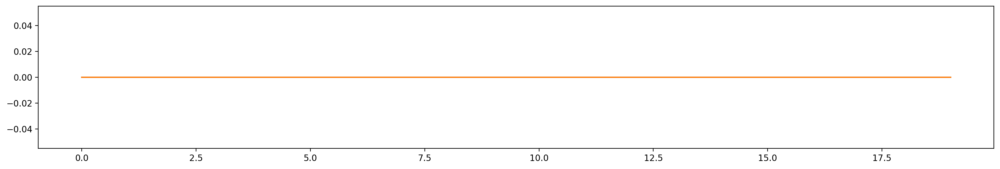

32 / 97  analysed
33 / 97  analysed
34 / 97  analysed
35 / 97  analysed
36 / 97  analysed
37 / 97  analysed
38 / 97  analysed
39 / 97  analysed
40 / 97  analysed
41 / 97  analysed
42 / 97  analysed
43 / 97  analysed
44 / 97  analysed
45 / 97  analysed
46 / 97  analysed
47 / 97  analysed
48 / 97  analysed
49 / 97  analysed
50 / 97  analysed
51 / 97  analysed
52 / 97  analysed
53 / 97  analysed
54 / 97  analysed
55 / 97  analysed
56 / 97  analysed
57 / 97  analysed
58 / 97  analysed
59 / 97  analysed
60 / 97  analysed
61 / 97  analysed
62 / 97  analysed
63 / 97  analysed
64 / 97  analysed
65 / 97  analysed
66 / 97  analysed
67 / 97  analysed
68 / 97  analysed
69 / 97  analysed
70 / 97  analysed
71 / 97  analysed
72 / 97  analysed
73 / 97  analysed
74 / 97  analysed
75 / 97  analysed
76 / 97  analysed
77 / 97  analysed
78 / 97  analysed
79 / 97  analysed
80 / 97  analysed
81 / 97  analysed
82 / 97  analysed
83 / 97  analysed
84 / 97  analysed
85 / 97  analysed
86 / 97  analysed
87 / 97  a

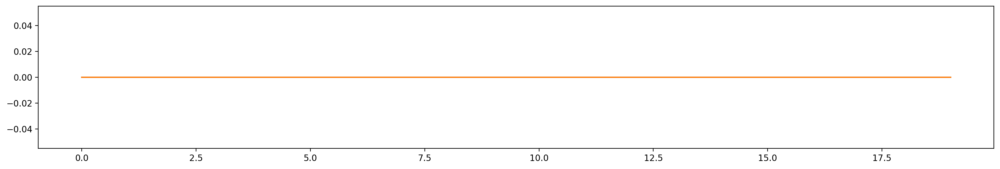

11 / 97  analysed
12 / 97  analysed
13 / 97  analysed
14 / 97  analysed
15 / 97  analysed
16 / 97  analysed


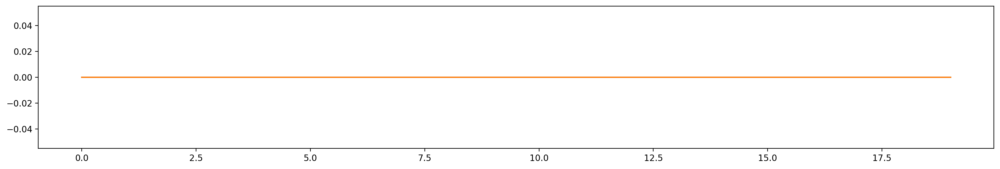

17 / 97  analysed
18 / 97  analysed
19 / 97  analysed
20 / 97  analysed
21 / 97  analysed
22 / 97  analysed
23 / 97  analysed


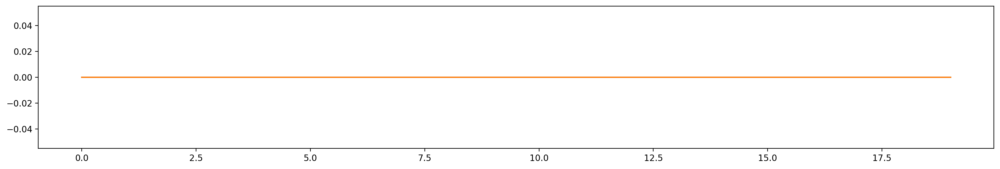

24 / 97  analysed
25 / 97  analysed


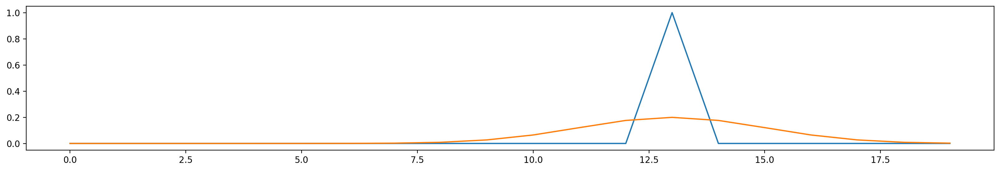

26 / 97  analysed
27 / 97  analysed
28 / 97  analysed
29 / 97  analysed
30 / 97  analysed
31 / 97  analysed
32 / 97  analysed
33 / 97  analysed


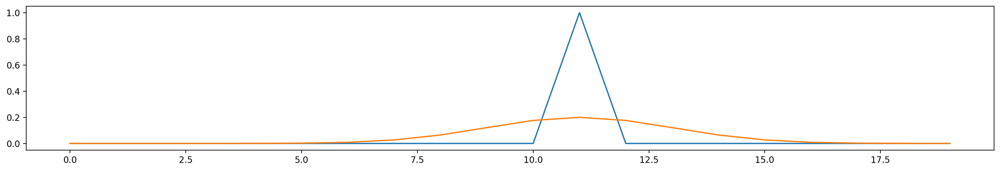

34 / 97  analysed
35 / 97  analysed


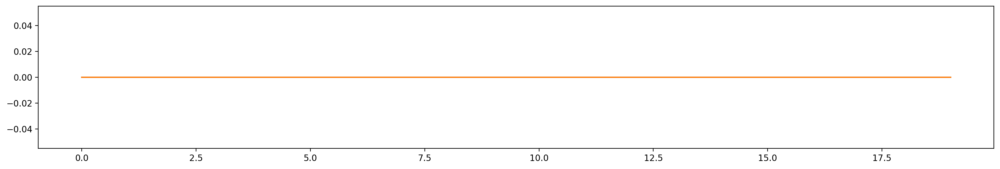

36 / 97  analysed
37 / 97  analysed
38 / 97  analysed
39 / 97  analysed
40 / 97  analysed
41 / 97  analysed
42 / 97  analysed
43 / 97  analysed
44 / 97  analysed
45 / 97  analysed
46 / 97  analysed


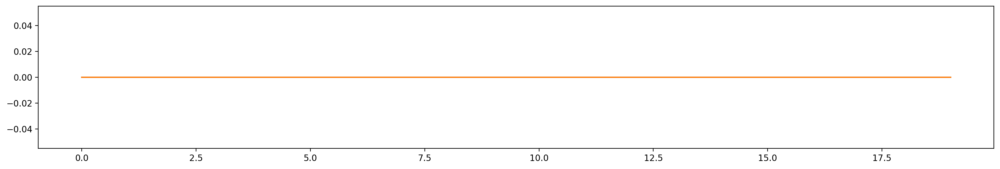

47 / 97  analysed
48 / 97  analysed
49 / 97  analysed
50 / 97  analysed
51 / 97  analysed
52 / 97  analysed
53 / 97  analysed
54 / 97  analysed
55 / 97  analysed


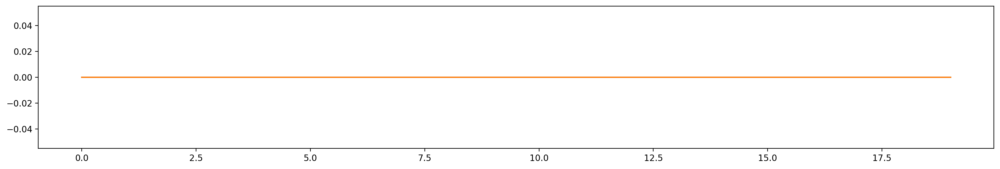

56 / 97  analysed
57 / 97  analysed
58 / 97  analysed
59 / 97  analysed
60 / 97  analysed
61 / 97  analysed


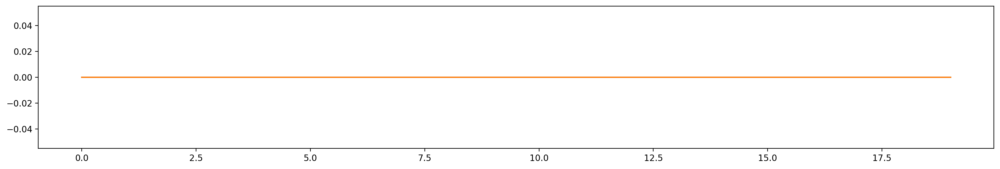

62 / 97  analysed
63 / 97  analysed
64 / 97  analysed
65 / 97  analysed


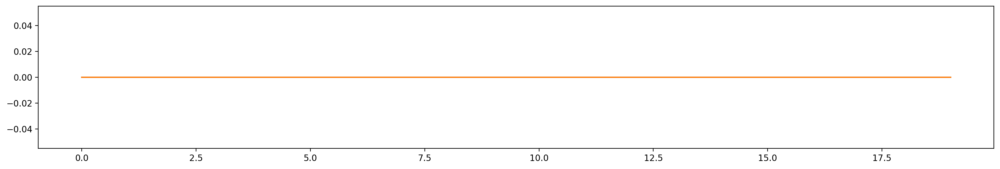

66 / 97  analysed
67 / 97  analysed
68 / 97  analysed
69 / 97  analysed
70 / 97  analysed
71 / 97  analysed
72 / 97  analysed
73 / 97  analysed
74 / 97  analysed
75 / 97  analysed
76 / 97  analysed
77 / 97  analysed
78 / 97  analysed
79 / 97  analysed
80 / 97  analysed
81 / 97  analysed
82 / 97  analysed
83 / 97  analysed
84 / 97  analysed
85 / 97  analysed
86 / 97  analysed
87 / 97  analysed
88 / 97  analysed
89 / 97  analysed
90 / 97  analysed
91 / 97  analysed
92 / 97  analysed
93 / 97  analysed
94 / 97  analysed
95 / 97  analysed
96 / 97  analysed
S03 Behaviour_competitor Stillness
Computing classification for Behaviour_competitor Stillness behaviour
0 / 97  analysed
1 / 97  analysed
2 / 97  analysed
3 / 97  analysed
4 / 97  analysed
5 / 97  analysed
6 / 97  analysed
7 / 97  analysed
8 / 97  analysed
9 / 97  analysed
10 / 97  analysed
11 / 97  analysed
12 / 97  analysed
13 / 97  analysed
14 / 97  analysed
15 / 97  analysed
16 / 97  analysed
17 / 97  analysed
18 / 97  analysed
19 / 

KeyboardInterrupt: 

In [18]:
#Read in animal IDS
ANIMALS = ['686', '691', 'H4009', 'H4010', 'H4015', 
           'H4017', '678', '681', '518', '522', 'H4011'] 

# List behaviours to analyse (note these were previously labelled)
BEH = ['Push', 'Move Forward', 'Resistance', 
       'Retreat', 'Withdrawal', 'Stillness']

#Parameters
shuffles = 2000 #number of shuffles 
perc_thresh = 95 #Chosen percentile
consistency = 34 #Consistency
n_bouts = 1 #n bouts to consider
binaized_events = True # Work with discrete vs continuous events
FR_sigma = 2 # Standard deviation window to consider when calculating instananeous FR
#------------------------------------------------------------------------------------------

#Initialize clf df
clf_df = pd.DataFrame({"Animal":[], "Session":[],
                       "Animal_analysed":[],"Behaviour":[], "Cell":[],
                       "MI_Value":[], "Percentile":[], 
                       "Engagement_matrix":[],"Consistency":[], 
                       "Classificaton":[]})

for animal in ANIMALS:
    animDIR = dataDir + animal
    for file in os.listdir(animDIR):
        if file.endswith('.csv'):
            session = file.split('_')[2]
            print(file, session)
            meta = pd.read_csv(animDIR + '/' + file)
            meta = meta[meta['Trial']!=0]
            for a in ['Behaviour_imaged', 'Behaviour_competitor']:
                for b in BEH:
                    print(session, a, b)
                    #CRITERIA 1: The behaviour must be occuring
                    if len(meta[meta[a]==b]) == 0:
                        print('%s %s behaviour not exhibted' %(a, b))            
                    else:
                        print('Computing classification for %s %s behaviour' %(a, b))   
                        #Isolate specific behaviour vector (binary)
                        b_bn = np.zeros(len(meta))
                        b_meta = meta.reset_index(drop=True)
                        b_bn[np.array(b_meta[b_meta[a]==b].index)] = 1

                        #Isolate behavioural bouts to calculate consistency
                        b_idx = b_meta[b_meta[a]==b].index
                        bout_starts = [b_idx[0]]; bout_ends = []; 
                        for i, fr in enumerate(b_idx):
                            if i < len(b_idx) - 1:
                                if  b_idx[i+1] - b_idx[i]  > 1:
                                    bout_ends.append(fr)
                                    bout_starts.append(b_idx[i+1])
                        bout_ends.append(b_idx[-1])

                        #INSERT CRITERIA THE NUMBER OF BOUTS MUST BE GREAT THAN 
                        if len(bout_ends) >= n_bouts:
                            #Loop through cells
                            Cells = [col for col in meta if col.startswith(' C')]
                            for c, cell in enumerate(Cells):
                                print(c, '/', len(Cells), ' analysed')
                                cell_events = np.array(b_meta[cell])
                                
                                #Use discrete events
                                if binaized_events:
                                    cell_events[cell_events > 0] = 1

                                #CRITERIA 2: The cell must be firing
                                if sum(cell_events) != 0: 
                                    
                                    #Calculate how many bouts the cell fires in
                                    e_m, cns = calc_cns(bout_starts, bout_ends, cell_events)

                                    #CRITERIA 3: Constiency must be > threshold percentile
                                    if cns > consistency:
                                        #Reformat cell evens to be probabilty of event
                                        cell_events_sm = gaussian_filter(cell_events, sigma = FR_sigma)
                                        cell_events_sm = list(cell_events_sm.reshape(-1,1))
                                        
                                        #Calculate I(B,E)
                                        N=100
                                        MI_list=[]
                                        for n in range(N):
                                            MI = mi_skl(cell_events_sm, b_bn, discrete_features=True, n_neighbors=3)
                                            MI_list.append(MI)
                                        MI = np.mean(MI_list)
                                        MI_SEM = scipy.stats.sem(MI_list)
                                        
                                        #Create distribution of MI with shuffled events
                                        SI = []
                                        for i in range(shuffles):
                                            shuff_events = cell_events.copy()
                                            np.random.shuffle(shuff_events)
                                            shuff_events = gaussian_filter(shuff_events, sigma = FR_sigma)
                                            shuff_events = list(shuff_events.reshape(-1,1))
                                            SI.append(mi_skl(shuff_events, b_bn, discrete_features=True, n_neighbors=3))
                                            if i > 0 and i % 100 == 0:
                                                print(str(i) + ' shuffles')
                                                
                                        #Calculate percentile
                                        perc = stats.percentileofscore(SI, MI)
                                        hist_MI(SI, MI, perc, a, b, cell)

                                        #CRITERIA 4: MI must be > threshold percentile
                                        if perc > perc_thresh:
                                            clf = 1
                                            hist_MI(SI, MI, perc, a, b, cell)
                                        else:
                                            clf = 0
                                    else:
                                        MI = [0]; MI_SEM=[0]; perc = 0; clf = 0

                                else: #Cells that have no events are automatically unclassified
                                    MI = [0]; MI_SEM=[0]; perc = 0; cns = 0; clf = 0; e_m = np.zeros(n_bouts)

                                #Save to dataframe
                                cell_clf = pd.DataFrame({"Animal":animal, 
                                                         "Session":session,
                                                         "Animal_analysed":a,
                                                         "Behaviour":b,
                                                         "Cell":cell,
                                                         "MI_Value":MI,
                                                         "MI_sem": MI_SEM,
                                                         "Percentile":perc,
                                                         "Engagement_matrix":str(e_m),
                                                         "Consistency":cns, 
                                                         "Classificaton":clf})
                                clf_df = clf_df.append(cell_clf)



    clf_df['Behaviour_classificaton'] = mixed_cells(clf_df)
    clf_df.to_csv(saveTo + "%s_Classified_cells_nonbinary.csv" %(animal), index=False)